# Analysis of NGC 3627 with Optical + X-ray wavelength data

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rc
rc('text', usetex=True)
font = {'family' : 'serif',
        'weight' : 'bold',
        'size'   : '14'}
rc('font', **font)

import pandas as pd

import os, sys
import glob
import shutil

from astroquery.mast import Observations

from astropy.io import fits                     # for file handing 
from astropy.table import Table                # for reading tables
from astropy.coordinates import SkyCoord, FK5   # for defining sky coordinates
import astropy.units as u                       # for using astronomical units (degs)
from astropy.wcs import WCS

from XRBID.AutoPhots import RunPhots, DaoFindObjects
from XRBID.WriteScript import (WriteReg, WriteScalings,
                               WriteDS9)
from XRBID.Sources import (LoadSources, GetCoords, GetIDs,
                           DaoClean, Crossref, GetDaoPhots)
from XRBID.DataFrameMod import (RemoveElse, FindUnique, BuildFrame,
                                Find)
from XRBID.Align import CorrectAstrometry, CalcPU
from XRBID.XRTools import FindSNRs, Lum
from XRBID.CMDs import (MakeCMD, MakeCCD, FitSED,
                        PlotSED, PlotHR)

sys.path.insert(0, '/Users/undergradstudent/Research/XRB-Analysis/Notebooks')
from helpers.analysis import remove_unnamed, XrayBinary

from regions import CircleSkyRegion, Regions    # for defining sky regions
from regions import TextSkyRegion               # for defining text regions

import seaborn as sns

# define directories to handle data in
cd = os.chdir
hstdir = "/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/HST/"
chandra_hst_dir = "/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/"
chandra_jwst_dir = "/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-JWST/"
jwstdir = "/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/JWST/"
M66_dir = "/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/"

# jwst directories
f200w = jwstdir+"hlsp_phangs-jwst_jwst_nircam_ngc3627_f200w_v1p1_img.fits"
f300m = jwstdir+"hlsp_phangs-jwst_jwst_nircam_ngc3627_f300m_v1p1_img.fits"
f335m = jwstdir+"hlsp_phangs-jwst_jwst_nircam_ngc3627_f335m_v1p1_img.fits"
f360m = jwstdir+"hlsp_phangs-jwst_jwst_nircam_ngc3627_f360m_v1p1_img.fits"

# hst directories
f275w = hstdir+"M66_mosaic_uvis_f275w_drc_sci.fits"
f336w = hstdir+"M66_mosaic_uvis_f336w_drc_sci.fits"
f438w = hstdir+"M66_mosaic_uvis_f438w_drc_sci.fits"
f555w = hstdir+"M66_mosaic_uvis_f555w_drc_sci.fits"
f814w = hstdir+"M66_mosaic_uvis_f814w_drc_sci.fits"


## Notes
1. Through XRBID, we found 19 HMXBs, 29 LMXBs, 3 clusters (uncategorized), 5 compact association and 1 unconfirmed globular cluster.

# Mosaicking
## Querying data with astroquery

In [9]:
filters = ["F275W", "F336W", "F438W", "F555W", "F814W"]
obs_id = [13364, 13477, 15654, 12968]

print("Finding observations for WFC3/UVIS images...")
obs_table = Observations.query_criteria(objectname="M66", obs_collection="HST",
                                        filters=filters,
                                        proposal_id=obs_id, instrument_name="WFC3/UVIS")
print("Done")

Finding observations for WFC3/UVIS images...
Done


In [10]:
obs_table

intentType,obs_collection,provenance_name,instrument_name,project,filters,wavelength_region,target_name,target_classification,obs_id,s_ra,s_dec,dataproduct_type,proposal_pi,calib_level,t_min,t_max,t_exptime,em_min,em_max,obs_title,t_obs_release,proposal_id,proposal_type,sequence_number,s_region,jpegURL,dataURL,dataRights,mtFlag,srcDen,obsid,objID,objID1,distance
str7,str3,str7,str9,str3,str5,str7,str9,str41,str35,float64,float64,str5,str20,int64,float64,float64,float64,float64,float64,str90,float64,str5,str3,int64,str912,str60,str61,str6,bool,float64,str8,str9,str9,float64
science,HST,CALWF3,WFC3/UVIS,HST,F555W,OPTICAL,NGC3627,GALAXY;SPIRAL,icdm12060,170.06225,12.96494722222,image,"Calzetti, Daniela",3,56696.72166797454,56696.73775590278,1134.0,441.7,659.1,LEGUS: Legacy ExtraGalactic UV Survey,56697.09893517,13364,GO,--,POLYGON 170.08076328 12.97824899 170.06572731 12.99556788 170.06521380355673 12.995195839564671 170.06495993 12.99548823 170.02762465 12.96843276 170.04266164 12.95111605 170.04291838622675 12.95130213254728 170.04346509999991 12.950672469999981 170.08079944000002 12.977725710000051 170.08050660602714 12.978063037290907 170.08076328 12.97824899 170.08076328 12.97824899 POLYGON 170.09584581000001 12.960128829999974 170.08100976000014 12.977259580000084 170.04370447999989 12.950591230000102 170.0585415000001 12.933462589999994 170.09584581000001 12.960128829999974 170.09584581000001 12.960128829999974,mast:HST/product/icdm12060_drz.jpg,mast:HST/product/icdm12060_drz.fits,PUBLIC,False,nan,24813357,755841358,755841358,0.0
science,HST,CALWF3,WFC3/UVIS,HST,F275W,UV,NGC-3627,GALAXY;SPIRAL,idxr22060,170.0646666667,13.00013888889,image,"Lee, Janice",3,58798.6967849537,58798.854620335645,2190.0,243.20000000000002,305.8,PHANGS-HST: Linking Stars and Gas throughout the Scales of Star Formation,58799.06275462,15654,GO,--,POLYGON 170.08698664 13.00556577 170.07985413 13.02716006 170.07982858651627 13.027153744369755 170.0796716 13.02762899 170.07964579535579 13.027622609763295 170.07948883 13.02809779 170.0343843 13.01694125 170.04152047 12.99534819 170.0415462823843 12.995354576975101 170.04170331 12.99487939 170.04172886131559 12.99488571238917 170.04188588 12.99441055 170.08698664 13.00556577 170.08698664 13.00556577,mast:HST/product/idxr22060_drz.jpg,mast:HST/product/idxr22060_drz.fits,PUBLIC,False,nan,26250740,770402919,770402919,28.036980630951845
science,HST,HAP-SVM,WFC3/UVIS,HAP,F555W,OPTICAL,SN-2009HD,EXT-STAR;SUPERNOVA TYPE II,hst_12968_01_wfc3_uvis_f555w_ic0h01,170.0707916667,12.97952777778,image,"Maund, Justyn Robert",3,56594.98504182,56595.03676605,1340.0,441.7,659.1,--,56960.19863424,12968,HAP,--,POLYGON 170.07798226639588 12.975194685627338 170.06666579903072 12.972938602024174 170.0635257891145 12.983812019710173 170.07484272452695 12.986167289060173 170.07798226639588 12.975194685627338,mast:HST/product/hst_12968_01_wfc3_uvis_f555w_ic0h01_drc.jpg,mast:HST/product/hst_12968_01_wfc3_uvis_f555w_ic0h01_drc.fits,PUBLIC,False,nan,26583210,656236786,656236786,27.744534966031452
science,HST,HAP-SVM,WFC3/UVIS,HAP,F336W,OPTICAL,NGC3627,GALAXY;SPIRAL,hst_13364_12_wfc3_uvis_f336w_icdm12,170.06225,12.96494722222,image,"Calzetti, Daniela",3,56696.6552676,56696.67123961,1110.0,305.8,367.3,--,56696.94539342,13364,HAP,--,POLYGON 170.09587933272053 12.960105704016119 170.05863460197395 12.933661530475247 170.05809257526263 12.93424481735564 170.05773123005582 12.93420078958274 170.04299381343537 12.951005619438776 170.04318577063316 12.951280772110136 170.04299377906062 12.951456847177832 170.04268887917473 12.951368780524264 170.0277009387766 12.96842586006943 170.064891119366 12.995556774752023 170.0650605431135 12.995644817214684 170.06532032117627 12.99539168629164 170.06580600439307 12.995732851717417 170.08079294998566 12.978277393686412 170.08064610326238 12.977958243126867 170.08080420819957 12.97780415402661 170.08112044715043 12.977881169950564 170.0957890736521 12.960744037813907 170.09565350983263 12.9604138886550

In [11]:
%%time
cd(hstdir)
print("Downloading data.\nThis may take several minutes... \n")
products = Observations.get_product_list(obs_table)
data_prod = ['FLC']       
data_type = ['HAP-SVM']   

Observations.download_products(products, project=data_type, 
                               productSubGroupDescription=data_prod)
print("Done")


This may take several minutes... 



INFO:astroquery:52 of 104 products were duplicates. Only returning 52 unique product(s).


INFO: 52 of 104 products were duplicates. Only returning 52 unique product(s). [astroquery.mast.utils]


KeyboardInterrupt: 

In [ ]:
# Gathering the FLC file names
input_flcs = glob.glob(os.path.join('mastDownload','HST','*','*.fits'))

# Moving files from mastDownload directory into current directory
for flc in input_flcs:
  shutil.copy(flc, os.path.basename(flc))

shutil.rmtree('mastDownload') # removes the extra directories
print("Done")

Done


In [ ]:
flc_files = glob.glob("hst*_acs_wfc_*_j*_flc.fits")
flc_files.sort()       # Alphabetizing files

for i,f in enumerate(flc_files):
    try: hdu = fits.open(f)
    except: print(f,"not good. Please remove.")

## F555W
The following code will be run in a python terminal

In [ ]:
from drizzlepac.astrodrizzle import AstroDrizzle as adriz

flc_files = glob.glob("*f555w*flc*.fits")
flc_files.sort()

adriz(flc_files, output='M66_mosaic_uvis_f555w',
      preserve=True, clean=True, context=False,
      skymethod='globalmin+match', # renormalizes the brightness of each field
      driz_cr=True, driz_cr_corr=False,
      final_wcs=True, final_rot=0,  # places North pointed up
      configobj=None, overwrite=False, build=False)  

## F814W

In [ ]:
flc_files = glob.glob("*f814w*flc*.fits")
flc_files.sorqqt()

adriz(flc_files, output='M66_mosaic_uvis_f814w',
      preserve=True, clean=True, context=False,
      skymethod='globalmin+match', # renormalizes the brightness of each field
      driz_cr=True, driz_cr_corr=False,
      final_wcs=True, final_rot=0,  # places North pointed up
      configobj=None, overwrite=False, build=False) 

## F438W

In [ ]:
flc_files = glob.glob("*f438w*flc*.fits")
flc_files.sort()

adriz(flc_files, output='M66_mosaic_uvis_f438w',
      preserve=True, clean=True, context=False,
      skymethod='globalmin+match', # renormalizes the brightness of each field
      driz_cr=True, driz_cr_corr=False,
      final_wcs=True, final_rot=0,  # places North pointed up
      configobj=None, overwrite=False, build=False) 

## F336W

In [ ]:
flc_files = glob.glob("*f336w*flc*.fits")
flc_files.sort()

adriz(flc_files, output='M66_mosaic_uvis_f336w',
      preserve=True, clean=True, context=False,
      skymethod='globalmin+match', # renormalizes the brightness of each field
      driz_cr=True, driz_cr_corr=False,
      final_wcs=True, final_rot=0,  # places North pointed up
      configobj=None, overwrite=False, build=False) 

## F275W

In [ ]:
flc_files = glob.glob("*f275w*flc*.fits")
flc_files.sort()

adriz(flc_files, output='M66_mosaic_uvis_f275w',
      preserve=True, clean=True, context=False,
      skymethod='globalmin+match', # renormalizes the brightness of each field
      driz_cr=True, driz_cr_corr=False,
      final_wcs=True, final_rot=0,  # places North pointed up
      configobj=None, overwrite=False, build=False) 

# Photometry

## F814W

In [ ]:
f814w_data = fits.getdata(f814w)
f814w_data_sliced = f814w_data[3400:3700, 4400:4700]
pixtoarcs = 0.03962
f814w_objects = DaoFindObjects(f814w_data_sliced, fwhm=0.10*2, pixtoarcs=pixtoarcs, threshold=2, plot=True)

# investigating the daofind sources and extracting their photometry
f814w_hdu = fits.open(f814w)
apcorr, aperr, apcorr_ext, aperr_ext = RunPhots(f814w_hdu, gal="M66", instrument="WFC3",
                                               filter='F814W', fwhm_arcs=0.10*2, threshold=2,
                                               num_stars=20, extended_rad=8, reg_correction=[1,1])
f814w_hdu.close()

# ((np.float64(-0.8588325849729528),),
#  np.float64(0.1807607521654574),
#  np.float64(-0.3719457463759386),
#  np.float64(0.10642947110641915))

## F555W

In [ ]:
f555w_data = fits.getdata(f555w)
f555w_data_sliced = f555w_data[3400:3700, 4400:4700]
pixtoarcs = 0.03962
fwhm = 0.18 * 2 # originally found 0.18 arcsec through ds9
f555w_objects = DaoFindObjects(f555w_data_sliced, fwhm=fwhm, pixtoarcs=pixtoarcs,
                               threshold=2, plot=True)

#investigating the daofind sources and extracting their photometry
f555w_hdu = fits.open(f555w)
apcorr555w, aperr555w, apcorr_ext555w, aperr_ext555w = RunPhots(f555w_hdu, gal="M66", instrument="WFC3",
                                               filter='F555W', fwhm_arcs=fwhm, threshold=2,
                                               num_stars=20, extended_rad=8, reg_correction=[1,1])
f555w_hdu.close()

# ((np.float64(-0.8814290765714752),),
#  np.float64(0.24055442323969883),
#  np.float64(-0.3472747023393392),
#  np.float64(0.12601848622183956))

## F438W

In [ ]:
f438w_data = fits.getdata(f438w)
f438w_data_sliced = f438w_data[3400:3700, 4400:4700]
pixtoarcs = 0.03962
fwhm = 0.11 * 2 # originally found 0.18 arcsec through ds9
f438w_objects = DaoFindObjects(f438w_data_sliced, fwhm=fwhm, pixtoarcs=pixtoarcs,
                               threshold=2, plot=True, vmax=0.09)
print(len(f438w_objects)) # found with 195 sources fwhm=0.10

#investigating the daofind sources and extracting their photometry
f438w_hdu = fits.open(f438w)
apcorr438w, aperr438w, apcorr_ext438w, aperr_ext438w = RunPhots(f438w_hdu, gal="M66", instrument="WFC3",
                                               filter='F438W', fwhm_arcs=fwhm, threshold=2,
                                               num_stars=20, extended_rad=8, reg_correction=[1,1])
f438w_hdu.close()

# ((np.float64(-0.9175731144364969),),
#  np.float64(0.2291917542835823),
#  np.float64(-0.4745254777532202),
#  np.float64(0.15543813531799572))

## F336W

In [ ]:
f336w_data = fits.getdata(f336w)
f336w_data_sliced = f336w_data[3400:3700, 4400:4700]
pixtoarcs = 0.03962
fwhm = 0.12 * 2 # originally found 0.18 arcsec through ds9
f336w_objects = DaoFindObjects(f336w_data_sliced, fwhm=fwhm, pixtoarcs=pixtoarcs,
                               threshold=2, plot=True, vmax=0.05)
print(len(f336w_objects)) # found with 195 sources fwhm=0.10

# investigating the daofind sources and extracting their photometry
f336w_hdu = fits.open(f336w)
apcorr336w, aperr336w, apcorr_ext336w, aperr_ext336w = RunPhots(f336w_hdu, gal="M66", instrument="WFC3",
                                               filter='F336W', fwhm_arcs=fwhm, threshold=2,
                                               num_stars=20, extended_rad=8, reg_correction=[1,1])
f336w_hdu.close()

# ((np.float64(-0.9540754478692428),),
#  np.float64(0.23448030394882666),
#  np.float64(-0.43512525755218445),
#  np.float64(0.13649683194194648))

## F275W

In [ ]:
f275w_data = fits.getdata(f275w)
f275w_data_sliced = f275w_data[4400:5000, 4300:4900]
pixtoarcs = 0.03962
fwhm = 0.12 * 2 # originally found 0.18 arcsec through ds9
f275w_objects = DaoFindObjects(f275w_data_sliced, fwhm=fwhm, pixtoarcs=pixtoarcs,
                               threshold=2, plot=True, vmax=0.015)
print(len(f275w_objects)) # found with 195 sources fwhm=0.10

#investigating the daofind sources and extracting their photometry
f275w_hdu = fits.open(f275w)
apcorr275w, aperr275w, apcorr_ext275w, aperr_ext275w = RunPhots(f275w_hdu, gal="M66", instrument="WFC3",
                                               filter='F275W', fwhm_arcs=fwhm, threshold=2,
                                               num_stars=20, extended_rad=8, reg_correction=[1,1])
f275w_hdu.close()

# ((np.float64(-0.9707309801124901),),
#  np.float64(0.25887846989477437),
#  np.float64(-0.4419304737417187),
#  np.float64(0.1511766174865048))

# Astrometric Corrections

In [ ]:
M66_CSC = LoadSources(chandra_hst_dir+"cscresults_M66_renamed.frame")
M66_unique = FindUnique(M66_CSC, header="CSC ID")
WriteReg(M66_unique, outfile=chandra_hst_dir+"M66_cscsources.reg", idheader="CSC ID", 
         radius=5, radunit="arcsec", width=2, color="hotpink")

In [ ]:
M66_calibrators = ["2CXO J112014.8+125814",
                   "2CXO J112018.9+130135",
                   "2CXO J112019.1+125947", # Not sure about this (upper left corner)
                   "2CXO J112019.5+125958", # Not sure about this (upper left corner)
                   "2CXO J112018.8+125924",
                  ] 
print(f"{len(M66_calibrators)} calibrators to match")

M66_calibrators = RemoveElse(M66_unique, keep=M66_calibrators, header='CSC ID')
print(f"{len(M66_calibrators)} calibrators found")

WriteReg(M66_calibrators, outfile=chandra_hst_dir+"M66_calibrators.reg")

In [ ]:
base_coords = GetCoords(hstdir+"M66_daofind_f555w_wfc3_fk5.reg")
cat_coords = [M66_calibrators["RA"].values.tolist(),
              M66_calibrators["Dec"].values.tolist()]

CorrectAstrometry(base_coords, cat_coords, returnshifts=True,
                 savebasereg=chandra_hst_dir+"M66_astrocorrect.reg")

# Input min and max separation: 0, 9.6e-5
# Min and max x residuals: -3e-5, 2.2e-5
# Min and max y residuals: -4.2e-5, 1.6e-5

# RESULTS OF ASTROMETRY CORRECTION

# Median offsets in x and y:
#  -2.018614964072185e-05 3.766607498967289e-05 degrees
#  -0.07267013870659866 0.13559786996282241 arcsecs

# Standard deviation in x and y offsets:
#  1.7643739978865733e-05 1.9961232387211725e-05 degrees
#  0.06351746392391663 0.07186043659396221 arcsecs

#  (np.float64(-2.018614964072185e-05),
#  np.float64(3.766607498967289e-05),
#  np.float64(1.7643739978865733e-05),
#  np.float64(1.9961232387211725e-05))

Assuming that the above astrometric corrections and its outputs are correct, since the standard deviations in the x and y offsets are bigger than their corresponding median offsets, there is not any correction needed between them. 

## Calculating Positional Uncertainties

In [ ]:
M66_CSC = LoadSources(chandra_hst_dir+"cscresults_M66_renamed.frame")
display(M66_CSC)

Reading in sources from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/cscresults_M66_renamed.frame...


,Separation,CSC ID,RA,Dec,Err Ellipse Major,Err Ellipse Minor,Err Ellipse Angle,Significance,Likelihood,conf_flag,...,flux_aper_avg_lolim_b,flux_aper_avg_hilim_b,flux_aper_avg_w,flux_aper_avg_lolim_w,flux_aper_avg_hilim_w,Theta,HS Ratio,Counts,Counts lolim,Counts hilim
0,0.603512,2CXO J112014.9+125929,170.062428,12.991495,0.311932,0.311917,0.000000,9.567092,TRUE,True,...,2.158629e-14,2.700286e-14,NaN,NaN,NaN,0.420311,0.029981,173.048934,154.988228,191.109641
1,1.154310,2CXO J112015.0+125928,170.062878,12.991329,0.317501,0.317501,0.000000,7.701153,TRUE,True,...,2.096613e-14,2.689218e-14,NaN,NaN,NaN,0.412041,-0.277327,126.386565,109.441688,142.201784
2,4.249587,2CXO J112014.9+125933,170.062259,12.992633,0.299684,0.298357,5.587902,12.795398,TRUE,False,...,2.943952e-14,3.440386e-14,NaN,NaN,NaN,0.488407,0.224859,226.842541,209.119065,244.566017
3,4.484088,2CXO J112015.2+125932X,170.063665,12.992189,3.446421,3.446421,0.000000,39.744111,TRUE,NaN,...,2.366824e-13,2.788378e-13,NaN,NaN,NaN,0.466503,NaN,3329.616280,3231.522180,3427.710381
4,5.940189,2CXO J112015.3+125932,170.064119,12.992230,0.413187,0.343140,64.093176,5.142857,TRUE,False,...,5.671396e-15,8.390559e-15,NaN,NaN,NaN,0.477466,0.199875,39.229231,31.383385,46.639197
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,231.679093,2CXO J112030.5+130013,170.127457,13.003663,1.402157,0.820192,1.489236,3.575758,TRUE,False,...,2.248525e-15,4.208778e-15,NaN,NaN,NaN,3.984317,0.201124,18.342335,13.057255,23.316527
84,237.496980,2CXO J112008.5+130307,170.035399,13.051914,0.774353,0.647498,139.851620,4.000000,TRUE,False,...,4.359917e-15,7.956849e-15,NaN,NaN,NaN,4.338261,0.463460,24.421586,18.316189,30.526982
85,240.218881,2CXO J112019.6+130320,170.081736,13.055570,0.563631,0.427724,157.623228,10.427182,TRUE,False,...,3.837669e-14,4.670929e-14,NaN,NaN,NaN,4.414767,0.763273,150.478203,136.047662,164.908744
86,246.797558,2CXO J112027.8+125649,170.116113,12.946999,1.754478,1.143646,33.705932,3.294118,TRUE,False,...,1.775502e-15,4.142838e-15,NaN,NaN,NaN,3.872333,-0.408495,17.434501,12.141885,22.727118


In [ ]:
sig1, sig2 = CalcPU(M66_CSC, std=[0.06352,0.07186], sig2search='Err Ellipse Major')

In [ ]:
M66_CSC['1Sig'] = sig1  # Saves sig1 to a new header called '1Sig'
M66_CSC['2Sig'] = sig2  # Saves sig2 to a new header called '2Sig'

# The new DataFrame has 1 and 2sig added at the end of the columns list
display(M66_CSC)

M66_CSC.to_csv(chandra_hst_dir+'M66_csc_astrocorrected.frame')

,Separation,CSC ID,RA,Dec,Err Ellipse Major,Err Ellipse Minor,Err Ellipse Angle,Significance,Likelihood,conf_flag,...,flux_aper_avg_w,flux_aper_avg_lolim_w,flux_aper_avg_hilim_w,Theta,HS Ratio,Counts,Counts lolim,Counts hilim,1Sig,2Sig
0,0.603512,2CXO J112014.9+125929,170.062428,12.991495,0.311932,0.311917,0.000000,9.567092,TRUE,True,...,NaN,NaN,NaN,0.420311,0.029981,173.048934,154.988228,191.109641,0.115174,0.238746
1,1.154310,2CXO J112015.0+125928,170.062878,12.991329,0.317501,0.317501,0.000000,7.701153,TRUE,True,...,NaN,NaN,NaN,0.412041,-0.277327,126.386565,109.441688,142.201784,0.118283,0.248443
2,4.249587,2CXO J112014.9+125933,170.062259,12.992633,0.299684,0.298357,5.587902,12.795398,TRUE,False,...,NaN,NaN,NaN,0.488407,0.224859,226.842541,209.119065,244.566017,0.113925,0.235415
3,4.484088,2CXO J112015.2+125932X,170.063665,12.992189,3.446421,3.446421,0.000000,39.744111,TRUE,NaN,...,NaN,NaN,NaN,0.466503,NaN,3329.616280,3231.522180,3427.710381,1.725878,3.451755
4,5.940189,2CXO J112015.3+125932,170.064119,12.992230,0.413187,0.343140,64.093176,5.142857,TRUE,False,...,NaN,NaN,NaN,0.477466,0.199875,39.229231,31.383385,46.639197,0.154105,0.345133
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,231.679093,2CXO J112030.5+130013,170.127457,13.003663,1.402157,0.820192,1.489236,3.575758,TRUE,False,...,NaN,NaN,NaN,3.984317,0.201124,18.342335,13.057255,23.316527,0.439176,1.071654
84,237.496980,2CXO J112008.5+130307,170.035399,13.051914,0.774353,0.647498,139.851620,4.000000,TRUE,False,...,NaN,NaN,NaN,4.338261,0.463460,24.421586,18.316189,30.526982,0.423189,1.022475
85,240.218881,2CXO J112019.6+130320,170.081736,13.055570,0.563631,0.427724,157.623228,10.427182,TRUE,False,...,NaN,NaN,NaN,4.414767,0.763273,150.478203,136.047662,164.908744,0.194439,0.404728
86,246.797558,2CXO J112027.8+125649,170.116113,12.946999,1.754478,1.143646,33.705932,3.294118,TRUE,False,...,NaN,NaN,NaN,3.872333,-0.408495,17.434501,12.141885,22.727118,0.436688,1.067144


In [ ]:
# Pulling the ID of each unique CSC source
ids = FindUnique(M66_CSC, header="CSC ID")["CSC ID"].values.tolist()

# Building an empty DataFrame, which I will fill below
M66_best = BuildFrame()

for i in ids: # for each unique ID pulled from CSC...
    
    # Search for all instances (i.e. observations) of each source
    Temp = Find(M66_CSC, "CSC ID = " + i)
    
    # Try to avoid sources where counts = NaN (invalid observations) 
    if len(Find(Temp, ["Counts != NaN", "Theta != NaN"])) > 0: 
        Temp = Find(Temp, ["Counts != NaN", "Theta != NaN"])
    
    # Specifically focus on those with a valid number of counts
    if len(Find(Temp, "Counts > 0")) > 0: 
        Temp = Find(Temp, ["Counts > 0"])
        
    # Otherwise, all instances with counts = 0 have the same measurements, 
    # so it doesn't matter which row is chosen for the best radii
    else: pass;
    
    # Take the source with the smallest 2sig. 
    # If there's more than one, take the first on the list.
    Tempbest = Find(Temp, "2Sig =< " + str(min(Temp["2Sig"]))).iloc[:1]
    
    # Add the chosen source observation to the new DataFrame
    M66_best = pd.concat([M66_best, Tempbest], ignore_index=True)

# Saving results to a DataFrame file
# This file contains only rows from M101_CSC that has the 
# best 2sigma radius, based on the search performed above
M66_best.to_csv(chandra_hst_dir+"M66_csc_bestrads.frame")

display(M66_best)

,Separation,CSC ID,RA,Dec,Err Ellipse Major,Err Ellipse Minor,Err Ellipse Angle,Significance,Likelihood,conf_flag,...,flux_aper_avg_w,flux_aper_avg_lolim_w,flux_aper_avg_hilim_w,Theta,HS Ratio,Counts,Counts lolim,Counts hilim,1Sig,2Sig
0,0.603512,2CXO J112014.9+125929,170.062428,12.991495,0.311932,0.311917,0.000000,9.567092,TRUE,True,...,NaN,NaN,NaN,0.420311,0.029981,173.048934,154.988228,191.109641,0.115174,0.238746
1,1.154310,2CXO J112015.0+125928,170.062878,12.991329,0.317501,0.317501,0.000000,7.701153,TRUE,True,...,NaN,NaN,NaN,0.412041,-0.277327,126.386565,109.441688,142.201784,0.118283,0.248443
2,4.249587,2CXO J112014.9+125933,170.062259,12.992633,0.299684,0.298357,5.587902,12.795398,TRUE,False,...,NaN,NaN,NaN,0.488407,0.224859,226.842541,209.119065,244.566017,0.113925,0.235415
3,4.484088,2CXO J112015.2+125932X,170.063665,12.992189,3.446421,3.446421,0.000000,39.744111,TRUE,NaN,...,NaN,NaN,NaN,0.466503,NaN,3329.616280,3231.522180,3427.710381,1.725878,3.451755
4,5.940189,2CXO J112015.3+125932,170.064119,12.992230,0.413187,0.343140,64.093176,5.142857,TRUE,False,...,NaN,NaN,NaN,0.477466,0.199875,39.229231,31.383385,46.639197,0.154105,0.345133
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,231.679093,2CXO J112030.5+130013,170.127457,13.003663,1.402157,0.820192,1.489236,3.575758,TRUE,False,...,NaN,NaN,NaN,3.984317,0.201124,18.342335,13.057255,23.316527,0.439176,1.071654
84,237.496980,2CXO J112008.5+130307,170.035399,13.051914,0.774353,0.647498,139.851620,4.000000,TRUE,False,...,NaN,NaN,NaN,4.338261,0.463460,24.421586,18.316189,30.526982,0.423189,1.022475
85,240.218881,2CXO J112019.6+130320,170.081736,13.055570,0.563631,0.427724,157.623228,10.427182,TRUE,False,...,NaN,NaN,NaN,4.414767,0.763273,150.478203,136.047662,164.908744,0.194439,0.404728
86,246.797558,2CXO J112027.8+125649,170.116113,12.946999,1.754478,1.143646,33.705932,3.294118,TRUE,False,...,NaN,NaN,NaN,3.872333,-0.408495,17.434501,12.141885,22.727118,0.436688,1.067144


In [ ]:
# Saving the positional uncertainties as region files
WriteReg(M66_best, radius=M66_best['2Sig'].values.tolist(), radunit='arcsec', \
         idheader="CSC ID", outfile=chandra_hst_dir+'M66_bestrads_2sig.reg')
WriteReg(M66_best, radius=M66_best['1Sig'].values.tolist(), radunit='arcsec', \
         outfile=chandra_hst_dir+'M66_bestrads_1sig.reg')g

# Identifying Optical Counterparts to X-ray sources

In [ ]:
x,y = GetCoords(hstdir+"M66_daofind_f555w_wfc3_img.reg")
ids = GetIDs(hstdir+"M66_daofind_f555w_wfc3_img.reg")
ra,dec = GetCoords(hstdir+"M66_daofind_f555w_wfc3_fk5.reg")

# Compiling into a single DataFrame
DaoFrame = BuildFrame(headers=['DaoID','X','Y','RA','Dec'], 
                      values=[ids,x,y,ra,dec])
DaoFrame.to_csv(hstdir+"M66_daofind_acs_coords.frame")

Retrieving coordinates from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/HST/M66_daofind_f555w_wfc3_img.reg
Retrieving IDs from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/HST/M66_daofind_f555w_wfc3_img.reg
Retrieving coordinates from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/HST/M66_daofind_f555w_wfc3_fk5.reg


In [ ]:
DaoFrame = pd.read_csv(hstdir+"M66_daofind_acs_coords.frame").drop("Unnamed: 0", axis=1)
display(DaoFrame)

,DaoID,X,Y,RA,Dec
0,1,4044.301157,506.383541,170.058899,12.933998
1,2,4071.287505,514.796584,170.058594,12.934091
2,3,4174.768903,607.892406,170.057425,12.935115
3,4,3852.428200,659.309812,170.061065,12.935681
4,5,3885.366892,660.899267,170.060693,12.935699
...,...,...,...,...,...
35153,35154,2559.137495,8946.778618,170.075675,13.026889
35154,35155,2270.289930,8989.284099,170.078938,13.027356
35155,35156,2218.000801,9011.531171,170.079529,13.027601
35156,35157,2269.749207,9011.687347,170.078944,13.027603


In [ ]:
# Loading in the original DataFrame containing the best 2sig radii for each source
M66_best = LoadSources(chandra_hst_dir+"M66_csc_bestrads.frame")

# Reading in the newly-saved img region file
xsources, ysources = GetCoords(chandra_hst_dir+"M66_bestrads_2sig_img.reg")
# Adding the image coordinates to the DataFrame
M66_best["X"] = xsources
M66_best["Y"] = ysources

# Convert the radius from arcseconds to pixels. 
# The conversion is 0.05 for ACS/WFC and 0.03962 for WFC3/UVIS
M66_best["2Sig (pix)"] = M66_best["2Sig"] / 0.03962 

# Saving the changes to the DataFrame
M66_best.to_csv(chandra_hst_dir+"M66_csc_bestrads.frame")
display(M66_best)


Reading in sources from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_csc_bestrads.frame...
Retrieving coordinates from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_bestrads_2sig_img.reg


,Separation,CSC ID,RA,Dec,Err Ellipse Major,Err Ellipse Minor,Err Ellipse Angle,Significance,Likelihood,conf_flag,...,Theta,HS Ratio,Counts,Counts lolim,Counts hilim,1Sig,2Sig,X,Y,2Sig (pix)
0,0.603512,2CXO J112014.9+125929,170.062428,12.991495,0.311932,0.311917,0.000000,9.567092,TRUE,True,...,0.420311,0.029981,173.048934,154.988228,191.109641,0.115174,0.238746,3732.25780,5731.0323,6.025886
1,1.154310,2CXO J112015.0+125928,170.062878,12.991329,0.317501,0.317501,0.000000,7.701153,TRUE,True,...,0.412041,-0.277327,126.386565,109.441688,142.201784,0.118283,0.248443,3692.38100,5715.9783,6.270647
2,4.249587,2CXO J112014.9+125933,170.062259,12.992633,0.299684,0.298357,5.587902,12.795398,TRUE,False,...,0.488407,0.224859,226.842541,209.119065,244.566017,0.113925,0.235415,3747.18600,5834.4389,5.941826
3,4.484088,2CXO J112015.2+125932X,170.063665,12.992189,3.446421,3.446421,0.000000,39.744111,TRUE,NaN,...,0.466503,NaN,3329.616280,3231.522180,3427.710381,1.725878,3.451755,3622.72450,5794.0764,87.121537
4,5.940189,2CXO J112015.3+125932,170.064119,12.992230,0.413187,0.343140,64.093176,5.142857,TRUE,False,...,0.477466,0.199875,39.229231,31.383385,46.639197,0.154105,0.345133,3582.56790,5797.8225,8.711076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,231.679093,2CXO J112030.5+130013,170.127457,13.003663,1.402157,0.820192,1.489236,3.575758,TRUE,False,...,3.984317,0.201124,18.342335,13.057255,23.316527,0.439176,1.071654,-2024.96930,6837.4179,27.048301
84,237.496980,2CXO J112008.5+130307,170.035399,13.051914,0.774353,0.647498,139.851620,4.000000,TRUE,False,...,4.338261,0.463460,24.421586,18.316189,30.526982,0.423189,1.022475,6124.79330,11221.0620,25.807047
85,240.218881,2CXO J112019.6+130320,170.081736,13.055570,0.563631,0.427724,157.623228,10.427182,TRUE,False,...,4.414767,0.763273,150.478203,136.047662,164.908744,0.194439,0.404728,2023.27800,11553.1970,10.215239
86,246.797558,2CXO J112027.8+125649,170.116113,12.946999,1.754478,1.143646,33.705932,3.294118,TRUE,False,...,3.872333,-0.408495,17.434501,12.141885,22.727118,0.436688,1.067144,-1021.79190,1688.5554,26.934484


In [ ]:
DaoCleanFrame = DaoClean(daosources=DaoFrame, sources=M66_best, sourceid="CSC ID", 
                         coordsys="img", coordheads=['X','Y'], radheader="2Sig (pix)",
                         wiggle=0.5) 


# Renaming the DaoID header to "F555W ID", to match the output of the other filters
DaoCleanFrame = DaoCleanFrame.rename(columns={'DaoID': 'F555W ID'})

display(DaoCleanFrame)

WriteReg(DaoCleanFrame, coordsys='fk5', width=2, radius=0.2, radunit='arcsec',
         outfile=chandra_hst_dir+'M66_daoclean_f555w_wfc3_fk5.reg')

Cleaning DAOFind sources. This will take a few minutes. Please wait.. 
DONE WITH CLEANING. CREATING DATAFRAME...


,F555W ID,X,Y,RA,Dec,CSC ID
0,18393,3728.392237,5731.691614,170.062466,12.991505,2CXO J112014.9+125929
1,18431,3730.3829,5734.693669,170.062444,12.991539,2CXO J112014.9+125929
2,18254,3690.922608,5713.903685,170.06289,12.99131,2CXO J112015.0+125928
3,18303,3693.339708,5721.089782,170.062862,12.991389,2CXO J112015.0+125928
4,19206,3746.7145,5828.6536,170.06226,12.992573,2CXO J112014.9+125933
...,...,...,...,...,...,...
236,3994,4869.455824,3777.647306,170.049579,12.97,2CXO J112011.8+125811
237,34886,3768.771693,8363.063045,170.062011,13.020465,2CXO J112014.9+130113
238,1804,4463.71084,2888.783967,170.054162,12.960218,2CXO J112013.0+125736
239,1476,3375.849092,2661.999469,170.066447,12.957722,2CXO J112015.9+125727


## Cross-referencing sources across filters

In [ ]:
cd(hstdir)
regions = ["M66_daofind_f275w_wfc3_img.reg",
           "M66_daofind_f336w_wfc3_img.reg",
           "M66_daofind_f438w_wfc3_img.reg",
           "M66_daofind_f814w_wfc3_img.reg"]

DaoCleanMatch = Crossref(DaoCleanFrame, regions=regions, catalogs=['F275W', 'F336W', 'F438W', 'F814W'],
                        coordheads=['X','Y'], sourceid="F555W ID",
                        outfile="M66_daoclean_matches.frame")

DaoCleanMatch

Finding cross-references between sources. This will take a few minutes. Please wait.. 
DONE WITH CLEANING. CREATING DATAFRAME...


,X,Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,RA,Dec,CSC ID
0,3728.392237,5731.691614,18393,NaN,95500,34799,17413,170.062466,12.991505,2CXO J112014.9+125929
1,3730.382900,5734.693669,18431,NaN,NaN,NaN,17413,170.062444,12.991539,2CXO J112014.9+125929
2,3690.922608,5713.903685,18254,NaN,95118,34583,NaN,170.062890,12.991310,2CXO J112015.0+125928
3,3693.339708,5721.089782,18303,NaN,NaN,NaN,NaN,170.062862,12.991389,2CXO J112015.0+125928
4,3746.714500,5828.653600,19206,NaN,NaN,35989,NaN,170.062260,12.992573,2CXO J112014.9+125933
...,...,...,...,...,...,...,...,...,...,...
257,3768.771693,8363.063045,34886,203812,157738,59483,NaN,170.062011,13.020465,2CXO J112014.9+130113
258,4463.710840,2888.783967,1804,48203,NaN,NaN,1718,170.054162,12.960218,2CXO J112013.0+125736
259,3375.849092,2661.999469,1476,NaN,25603,5443,1413,170.066447,12.957722,2CXO J112015.9+125727
260,3375.849092,2661.999469,1476,NaN,25753,NaN,NaN,170.066447,12.957722,2CXO J112015.9+125727


In [ ]:
# Adding "CSC ID" to columns in DaoCleanMatch
DaoCleanMatch["CSC ID"] = None

# Adding the CSC IDs of each source the daosources are associated with
for i in range(len(DaoCleanMatch)): 
    # Searches for the CSC ID associated with each F555W ID (DaoID in DaoCleanFrame)
    tempid = DaoCleanMatch["F555W ID"][i] 
    tempcsc = Find(DaoCleanFrame, "F555W ID = " + str(tempid))["CSC ID"][0]
    DaoCleanMatch["CSC ID"][i] = tempcsc
    
# Updating the DataFrame
DaoCleanMatch.to_csv(hstdir+"M66_daoclean_matches.frame")
display(DaoCleanMatch)

,X,Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,RA,Dec,CSC ID
0,3728.392237,5731.691614,18393,NaN,95500,34799,17413,170.062466,12.991505,2CXO J112014.9+125929
1,3730.382900,5734.693669,18431,NaN,NaN,NaN,17413,170.062444,12.991539,2CXO J112014.9+125929
2,3690.922608,5713.903685,18254,NaN,95118,34583,NaN,170.062890,12.991310,2CXO J112015.0+125928
3,3693.339708,5721.089782,18303,NaN,NaN,NaN,NaN,170.062862,12.991389,2CXO J112015.0+125928
4,3746.714500,5828.653600,19206,NaN,NaN,35989,NaN,170.062260,12.992573,2CXO J112014.9+125933
...,...,...,...,...,...,...,...,...,...,...
257,3768.771693,8363.063045,34886,203812,157738,59483,NaN,170.062011,13.020465,2CXO J112014.9+130113
258,4463.710840,2888.783967,1804,48203,NaN,NaN,1718,170.054162,12.960218,2CXO J112013.0+125736
259,3375.849092,2661.999469,1476,NaN,25603,5443,1413,170.066447,12.957722,2CXO J112015.9+125727
260,3375.849092,2661.999469,1476,NaN,25753,NaN,NaN,170.066447,12.957722,2CXO J112015.9+125727


In [ ]:
# For each X-ray source, number the associated stars starting from 1.
tempcsc = DaoCleanMatch["CSC ID"][0] # Keeping track of the current X-ray source
DaoCleanMatch["StarID"] = None # Storing the star number for each X-ray source

starno = 1 # Star number counter

for i in range(len(DaoCleanMatch)): 
    # If this is a new CSC ID, save it to tempcsc and restart starno counter
    if tempcsc != DaoCleanMatch["CSC ID"][i]: 
        tempcsc = DaoCleanMatch["CSC ID"][i]
        starno = 1
    DaoCleanMatch["StarID"][i] = starno
    starno += 1 # adds one to the starno counter

# Saving the candidate region file with new numberings
WriteReg(DaoCleanMatch, coordsys="image", coordheads=["X","Y"], 
         idheader="StarID", width=2, fontsize=12,
         outfile=chandra_hst_dir+"M66_XRB_candidates.reg",
         radius=0.1, radunit='arcsec')

# DaoCleanMatch has now renumbered each star associated with 
# an X-ray source for simplicity
DaoCleanMatch.to_csv(hstdir+"M66_daoclean_matches.frame")
display(DaoCleanMatch)

Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_XRB_candidates.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_XRB_candidates.reg saved!


,X,Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,RA,Dec,CSC ID,StarID
0,3728.392237,5731.691614,18393,NaN,95500,34799,17413,170.062466,12.991505,2CXO J112014.9+125929,1
1,3730.382900,5734.693669,18431,NaN,NaN,NaN,17413,170.062444,12.991539,2CXO J112014.9+125929,2
2,3690.922608,5713.903685,18254,NaN,95118,34583,NaN,170.062890,12.991310,2CXO J112015.0+125928,1
3,3693.339708,5721.089782,18303,NaN,NaN,NaN,NaN,170.062862,12.991389,2CXO J112015.0+125928,2
4,3746.714500,5828.653600,19206,NaN,NaN,35989,NaN,170.062260,12.992573,2CXO J112014.9+125933,1
...,...,...,...,...,...,...,...,...,...,...,...
257,3768.771693,8363.063045,34886,203812,157738,59483,NaN,170.062011,13.020465,2CXO J112014.9+130113,1
258,4463.710840,2888.783967,1804,48203,NaN,NaN,1718,170.054162,12.960218,2CXO J112013.0+125736,1
259,3375.849092,2661.999469,1476,NaN,25603,5443,1413,170.066447,12.957722,2CXO J112015.9+125727,1
260,3375.849092,2661.999469,1476,NaN,25753,NaN,NaN,170.066447,12.957722,2CXO J112015.9+125727,2


## Incorporating Other Catalogs

### Cluster Catalog
The cluster catalog being used below can be found from the PHANGS-CAT website, [here](https://archive.stsci.edu/hlsp/phangs/phangs-cat). Note that the catalog above was observed through wfc3. There's another one available taken through acs, [here](https://archive.stsci.edu/hlsp/phangs.html#hst_image_products_table). However, since I am using the wfc3 instrument for all my analysis here, I am using the wfc3 catalog only.

In [ ]:
# Read a BinTableHDU
cluster_hdu = fits.open('/Users/undergradstudent/Downloads/ngc3627/cluster/hlsp_phangs-cat_hst_wfc3_ngc3627_multi_v1_cluster-human-class12.fits')
clustertbl = QTable(cluster_hdu[1].data)
clustertbl

INDEX,ID_PHANGS_CLUSTERS,PHANGS_X,PHANGS_Y,PHANGS_RA,PHANGS_DEC,PHANGS_CLUSTER_CLASS_HUMAN,PHANGS_CLUSTER_CLASS_ML_VGG,PHANGS_CLUSTER_CLASS_ML_VGG_QUAL,PHANGS_F275W_VEGA_TOT,PHANGS_F275W_VEGA_TOT_ERR,PHANGS_F336W_VEGA_TOT,PHANGS_F336W_VEGA_TOT_ERR,PHANGS_F438W_VEGA_TOT,PHANGS_F438W_VEGA_TOT_ERR,PHANGS_F555W_VEGA_TOT,PHANGS_F555W_VEGA_TOT_ERR,PHANGS_F814W_VEGA_TOT,PHANGS_F814W_VEGA_TOT_ERR,PHANGS_F275W_mJy_TOT,PHANGS_F275W_mJy_TOT_ERR,PHANGS_F336W_mJy_TOT,PHANGS_F336W_mJy_TOT_ERR,PHANGS_F438W_mJy_TOT,PHANGS_F438W_mJy_TOT_ERR,PHANGS_F555W_mJy_TOT,PHANGS_F555W_mJy_TOT_ERR,PHANGS_F814W_mJy_TOT,PHANGS_F814W_mJy_TOT_ERR,PHANGS_CI,PHANGS_AGE_MINCHISQ,PHANGS_AGE_MINCHISQ_ERR,PHANGS_MASS_MINCHISQ,PHANGS_MASS_MINCHISQ_ERR,PHANGS_EBV_MINCHISQ,PHANGS_EBV_MINCHISQ_ERR,PHANGS_REDUCED_MINCHISQ,NO_DETECTION_FLAG
int64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1,14,6614.89,3239.51,170.06613550163783,12.939565672437887,1.0,2,0.9,20.64478245728906,0.02659657396351643,20.93979017654412,0.030188736564226437,22.250655300429276,0.031346415447021464,22.27859441730564,0.016875740045112282,22.11064764254441,0.03901893634778962,0.004894710575974825,0.00012002236400823634,0.005149012301279204,0.00014331060515183322,0.0051853476618246,0.00014985637672020489,0.004488303673158532,6.983200680382467e-05,0.003450014679669524,0.00012410973040724197,1.4406957552854887,1.0,1.0,8719.629993702069,2694.2879321260407,0.31,0.03999999999999998,0.15571900335067532,0.0
2,46,7284.4,3396.34,170.05857517129016,12.94129168906165,1.0,1,0.8,24.105332415990546,0.37037020453020186,22.714208348075548,0.08964678639377795,22.519651769070073,0.027672450452808608,21.668955157650842,0.009359068435449567,20.217371142107172,0.008528855229104975,0.0002020724158307192,6.900054767200979e-05,0.0010045155423948492,8.302346398363295e-05,0.004047429496485954,0.00010326101122819036,0.007869333245767959,6.790160231908834e-05,0.01973020252367809,0.00015514284407774865,1.6525453388887816,2440.0,1412.0,435789.158149563,132243.1815034949,0.15,0.17,0.6757897715262302,0.0
3,55,6620.99,3457.63,170.0660666598804,12.941966204158541,1.0,1,1.0,22.281918510623996,0.07737770478364059,22.22169363119243,0.0616848745282317,22.46988424208646,0.027246659028787583,22.442268805930635,0.014600834523023043,21.98812430101322,0.02959330849684471,0.001083608980805747,7.730327650696346e-05,0.0015811116822482226,8.991884008849886e-05,0.0042372716090699316,0.00010644101884595906,0.003860223743174932,5.196364647241765e-05,0.003862160160097809,0.00010537395092536263,1.5549336132831346,182.0,28.0,17467.385090088555,2360.828541606472,0.0,0.01,0.7982185920792995,0.0
4,68,6698.34,3482.21,170.06519319571672,12.942236733359024,1.0,1,1.0,20.82626233865763,0.02611063539413167,20.81526062516283,0.022289843866434313,21.009603537555332,0.010733207751301713,20.91452051154636,0.006500915802188716,20.38050871921674,0.009989056907406837,0.004141284477435931,9.969238081274846e-05,0.005774784072017913,0.00011867308687031326,0.01626292222205026,0.00016093021202070686,0.015765646894598556,9.449216496329995e-05,0.01697760840966834,0.00015635452786221064,1.7234222094582332,210.0,0.0,80145.11041876292,9281.609214165932,0.01,0.03,0.181573970260038,0.0
5,90,6745.89,3520.91,170.06465624597297,12.942662654573844,1.0,1,1.0,22.925218259744764,0.13452151333237802,22.27913233033862,0.06630949310249956,22.105464738627294,0.022063156905752657,21.881795724754113,0.012211765860952238,21.189383833152473,0.016662480049139786,0.0005991736362875742,7.431113649301165e-05,0.0014996401795385338,9.167950055632037e-05,0.005927261726618868,0.00012056776794817406,0.006468472112226721,7.282653409476053e-05,0.008059840858327328,0.00012381565857698675,1.8696595576630655,500.0,151.0,55569.664341832664,1130.107884178833,0.0,0.1,

In [ ]:
regions = []
radius = 0.00005 * u.deg       # change this depending on the desired size of the radius
for i in range(len(clustertbl)):
    # create sky coordinates
    center_sky = SkyCoord(ra=clustertbl['PHANGS_RA'][i], dec=clustertbl['PHANGS_DEC'][i],
                          unit='deg', frame='icrs').transform_to(FK5)
    sky_reg = CircleSkyRegion(center=center_sky, radius=radius)
    regions.append(sky_reg)

regs = Regions(regions)
regs.write(chandra_hst_dir+"cluster_catalog_.reg", format='ds9')
regs

In [ ]:
# Add a few degrees to the center coordinate of the source
# so that the region that is created would be above the source
clustercopy = clustertbl.copy()
clustercopy['PHANGS_DEC'] = clustercopy['PHANGS_DEC'] + 0.00005

text_regions = []
radius = 0.00008 * u.deg
for i in range(len(clustertbl)):
    center_sky = SkyCoord(ra=clustertbl['PHANGS_RA'][i], dec=clustercopy['PHANGS_DEC'][i],
                          unit='deg', frame='icrs').transform_to(FK5)
    text_sky_reg = TextSkyRegion(center=center_sky, text=clustertbl['ID_PHANGS_CLUSTERS'][i])
    text_regions.append(sky_reg)

text_regs = Regions(text_regions)
# regs_text.write(chandra_hst_dir+"cluster_catalog_text.reg", format='ds9')
text_regs


In [ ]:
# cluster coordinates in fk5 system
clusters_sky = SkyCoord(ra=clustertbl['PHANGS_RA'], dec=clustertbl['PHANGS_DEC'],
                          unit='deg', frame='icrs').transform_to(FK5)
clustertbl.add_column(col=clusters_sky.ra.deg, index=2,
                        name='RA')
clustertbl.add_column(col=clusters_sky.dec.deg, index=3,
                        name='Dec')                       
clustertbl.write(chandra_hst_dir+'cluster_catalog.txt', format='csv', overwrite=True)
# We are mainly only interested in the RA_fk5 and Dec_fk5  

In [ ]:
# save an fk5 region file of the cluster catalog with WriteReg
clusterdf = clustertbl.to_pandas()
WriteReg(sources=clusterdf, outfile=chandra_hst_dir+'M66_cluster_catalog_fk5.reg',
         coordsys='fk5', coordheads=['RA', 'Dec'], idheader='ID_PHANGS_CLUSTERS',
         radius=0.2, radunit='arcsec')

Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_cluster_catalog_fk5.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_cluster_catalog_fk5.reg saved!


In [ ]:
# save both the image and fk5 coordinates in the df
clusters_sky = SkyCoord(ra=clustertbl['PHANGS_RA'], dec=clustertbl['PHANGS_DEC'],
                          unit='deg', frame='icrs').transform_to(FK5)
with fits.open(f555w) as hdu:
    wcs = WCS(hdu['PRIMARY'].header)  
    print(wcs)              
clusters_pix = clusters_sky.to_pixel(wcs, origin=1)

clusters_pix


WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN' 'DEC--TAN' 
CRVAL : 170.06006411545647 12.978893560524552 
CRPIX : 3941.092599017002 4585.730459454908 
CD1_1 CD1_2  : -1.1005555796954e-05 2.15389758956903e-22 
CD2_1 CD2_2  : 2.64730184271065e-22 1.10055557969543e-05 
NAXIS : 7880  9170


(array([3403.43545948, 4072.9464916 , 3409.53693632, 3486.88709962,
        3534.43735975, 3482.41771575, 3670.62826688, 3765.68865683,
        4144.73887549, 3871.59894932, 3744.9394757 , 4078.49957858,
        3844.30993084, 3947.85999319, 3915.68012718, 3452.55019316,
        3632.8202174 , 3832.68041004, 3974.02054232, 4029.54060407,
        4010.92079712, 3955.72089524, 3914.60106149, 3908.08117647,
        4119.22120506, 2891.73141101, 4016.81158147, 3152.34173038,
        4013.75184559, 3621.58189615, 4040.18213097, 3875.50254708,
        2628.95360882, 3978.72404699, 3943.22419935, 4000.60513671,
        3564.86517161, 2619.01521977, 3615.56522487, 4310.41522627,
        2684.60534097, 2707.13541229, 2773.7154529 , 4228.89549177,
        2893.69554623, 4162.43573683, 4143.56580487, 4138.17618778,
        3270.78623981, 4144.05636009, 2987.45652241, 2160.12673496,
        4179.21679787, 3358.98697777, 2489.05711158, 3349.04711058,
        4166.20714313, 2738.81747671, 1951.17750

In [ ]:
clusterdf.insert(4, column='X', value=clusters_pix[0])
clusterdf.insert(5, column='Y', value=clusters_pix[1])
clusterdf.to_csv(chandra_hst_dir+'M66_cluster_catalog.frame')

In [ ]:
# Save an img region file 
WriteReg(clusterdf, idheader='ID_PHANGS_CLUSTERS', coordheads=['X', 'Y'],
         coordsys='image', outfile=chandra_hst_dir+'M66_cluster_catalog_img.reg',
         radius=0.0001, radunit='deg')

Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_cluster_catalog_img.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_cluster_catalog_img.reg saved!


#### Investigating the ACS cluster catalog 

This catalog can be found [here](https://archive.stsci.edu/hlsp/phangs.html#hst_image_products_table).

In [ ]:
cluster_dir = '/Users/undergradstudent/Downloads/catalogs/hlsp_phangs-cat_hst_uvis_ngc3627_multi_v1_obs-human-cluster-class12.fits'

with fits.open(cluster_dir) as cluster_hdu:
    clustertbl = QTable(cluster_hdu[1].data)

# convert cluster coordinates from icrs to fk5 system
clusters_sky = SkyCoord(ra=clustertbl['PHANGS_RA'], dec=clustertbl['PHANGS_DEC'],
                          unit='deg', frame='icrs').transform_to(FK5)
clustertbl.add_column(col=clusters_sky.ra.deg, index=4,
                        name='RA')
clustertbl.add_column(col=clusters_sky.dec.deg, index=5,
                        name='Dec')                       

clusterdf = clustertbl.to_pandas()
clusterdf.to_csv('/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_cluster_catalog_uvis_fk5.frame')

WriteReg(sources=clusterdf, outfile=chandra_hst_dir+'M66_cluster_catalog_acs-uvis_fk5.reg',
         coordsys='fk5', coordheads=['RA', 'Dec'], idheader='ID_PHANGS_CLUSTER',
         radius=0.3, radunit='arcsec')


# Manually creating a region file with image coordinates with this region file. 

Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_cluster_catalog_acs-uvis_fk5.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_cluster_catalog_acs-uvis_fk5.reg saved!


After comparing the regions files of clusters obtained from both acs and wfc3 instruments, I noticed that both their positions are the same except for their ids. Everything else is the same. 

### Supernova Remnants (SNRs)

I created this catalog myself by finding the catalogued SNRs

In [ ]:
snr_catalog = pd.read_csv(chandra_hst_dir+"M66_snr_catalog.frame")

In [ ]:
snr_catalog

,Unnamed: 0,SNR ID,RA,Dec
0,0,SN 1973R,170.048450,12.998440
1,1,SN 1989B,170.057960,13.005330
2,2,SN 1997bs,170.059375,12.972111
3,3,SN 2009hd,170.070670,12.979610
4,4,SN 2016cok,170.079292,12.982389


In [ ]:
snr_catalog['RA'][3], snr_catalog['Dec'][3]

(np.float64(170.07067), np.float64(12.97961))

In [ ]:
WriteReg(snr_catalog, idheader='SNR ID', coordsys='fk5',
        coordheads=['RA', 'Dec'], outfile=chandra_hst_dir+'M66_snr_catalog_fk5.reg',
        radius=0.25, radunit='arcsec')

# Creating an img region file using ds9

Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_snr_catalog_fk5.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_snr_catalog_fk5.reg saved!


### Compact Association Clusters

The compact association catalog being used below can be found from the PHANGS-CAT website, [here](https://archive.stsci.edu/hlsp/phangs/phangs-cat). They have the catalogs available using the 3 different watershed algorithms for 16pc, 32pc and 64pc. The 16pc method has the most amount of sources, which is why I will be using my analysis.

In [ ]:
ws16pc = '/Users/undergradstudent/Downloads/ngc3627/assoc/vselect/ws16pc/hlsp_phangs-cat_hst_wfc3_ngc3627_multi_v1_assoc-vselect-ws16pc-main.fits'
ws32pc = '/Users/undergradstudent/Downloads/ngc3627/assoc/vselect/ws32pc/hlsp_phangs-cat_hst_wfc3_ngc3627_multi_v1_assoc-vselect-ws32pc-main.fits'
ws64pc = '/Users/åundergradstudent/Downloads/ngc3627/assoc/vselect/ws64pc/hlsp_phangs-cat_hst_wfc3_ngc3627_multi_v1_assoc-vselect-ws64pc-main.fits'

In [ ]:
with fits.open(ws16pc) as hdu1:
    assoc1 = QTable(hdu1[1].data)

# convert coordinates from icrs to fk5 system
assoc_sky = SkyCoord(ra=assoc1['reg_ra'], dec=assoc1['reg_dec'],
                          unit='deg', frame='icrs').transform_to(FK5)
assoc1.add_column(col=assoc_sky.ra.deg, index=3,
                        name='RA')
assoc1.add_column(col=assoc_sky.dec.deg, index=4,
                        name='Dec')                       
                        
# Convert to a df to use WriteReg to create region files
assoc1df = assoc1.to_pandas()
assoc1df.to_csv('/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/assoc_catalog_ws16pc.frame')

WriteReg(sources=assoc1df, outfile=chandra_hst_dir+'M66_assoc1_catalog_ws16pc_fk5.reg',
         coordsys='fk5', coordheads=['reg_ra', 'reg_dec'], idheader='reg_id',
         radius=0.3, radunit='arcsec')

# Manually creating a region file with image coordinates of this region file


Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_assoc1_catalog_ws16pc_fk5.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_assoc1_catalog_ws16pc_fk5.reg saved!


In [ ]:
with fits.open(ws32pc) as hdu2:
    assoc2 = QTable(hdu2[1].data)

# convert coordinates from icrs to fk5 system
assoc_sky = SkyCoord(ra=assoc2['reg_ra'], dec=assoc2['reg_dec'],
                          unit='deg', frame='icrs').transform_to(FK5)
assoc2.add_column(col=assoc_sky.ra.deg, index=3,
                        name='RA')
assoc2.add_column(col=assoc_sky.dec.deg, index=4,
                        name='Dec')   

# Convert to a df to use WriteReg to create region files
assoc2df = assoc2.to_pandas()
assoc2df.to_csv('/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/assoc_catalog_ws32pc.frame')

WriteReg(sources=assoc2df, outfile=chandra_hst_dir+'M66_assoc2_catalog_ws32pc_fk5.reg',
         coordsys='fk5', coordheads=['reg_ra', 'reg_dec'], idheader='reg_id',
         radius=0.3, radunit='arcsec')


Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_assoc2_catalog_ws32pc_fk5.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_assoc2_catalog_ws32pc_fk5.reg saved!


In [ ]:
with fits.open(ws64pc) as hdu3:
    assoc3 = QTable(hdu3[1].data)

# convert coordinates from icrs to fk5 system
assoc_sky = SkyCoord(ra=assoc3['reg_ra'], dec=assoc3['reg_dec'],
                          unit='deg', frame='icrs').transform_to(FK5)
assoc3.add_column(col=assoc_sky.ra.deg, index=3,
                        name='RA')
assoc3.add_column(col=assoc_sky.dec.deg, index=4,
                        name='Dec')   

# Convert to a df to use WriteReg to create region files
assoc3df = assoc3.to_pandas()
assoc3df.to_csv('/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/assoc_catalog_ws64pc.frame')

WriteReg(sources=assoc3df, outfile=chandra_hst_dir+'M66_assoc3_catalog_ws64pc_fk5.reg',
         coordsys='fk5', coordheads=['reg_ra', 'reg_dec'], idheader='reg_id',
         radius=0.3, radunit='arcsec')

Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_assoc3_catalog_ws64pc_fk5.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_assoc3_catalog_ws64pc_fk5.reg saved!


#### Investigating the compact associations catalog available [here](https://archive.stsci.edu/hlsp/phangs.html#hst_image_products_table)

In [ ]:
assoc_dir = '/Users/undergradstudent/Downloads/catalogs/hlsp_phangs-cat_hst_uvis_ngc3627_multi_v1_obs-human-compact-association-class3.fits'

with fits.open(assoc_dir) as hdu4:
    assoc4 = QTable(hdu4[1].data)

# convert coordinates from icrs to fk5 system
assoc_sky = SkyCoord(ra=assoc4['PHANGS_RA'], dec=assoc4['PHANGS_DEC'],
                          unit='deg', frame='icrs').transform_to(FK5)
assoc4.add_column(col=assoc_sky.ra.deg, index=4,
                        name='RA')
assoc4.add_column(col=assoc_sky.dec.deg, index=5,
                        name='Dec')   

# Convert to a df to use WriteReg to create region files
assoc4df = assoc4.to_pandas()
assoc4df.to_csv('/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_assoc_catalog_acs-uvis.frame')

WriteReg(sources=assoc4df, outfile=chandra_hst_dir+'M66_assoc_catalog_acs-uvis_fk5.reg',
         coordsys='fk5', coordheads=['RA', 'Dec'], idheader='ID_PHANGS_CLUSTER',
         radius=0.3, radunit='arcsec')

# Manually creating a region file with image coordianates with this

Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_assoc_catalog_acs-uvis_fk5.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_assoc_catalog_acs-uvis_fk5.reg saved!


Interestingly, there are new sources in this catalog that are not in the other catalogs. Need to show these to Qiana

## Crossreferencing

In [ ]:
cd(chandra_hst_dir)
DaoCleanMatch = LoadSources(hstdir+'M66_daoclean_matches.frame')
regions = ['M66_cluster_catalog_img.reg', 'M66_snr_catalog_img.reg']
catalog = Crossref(DaoCleanMatch, regions=regions, catalogs=['Cluster','SNR'],
        coordsys='image', coordheads=['X', 'Y'], search_radius=10, sourceid='CSC ID',
        outfile='M66_cluster_snr.frame')

display(Find(catalog, "Cluster ID != NaN"))
display(Find(catalog, "SNR ID != NaN"))

Reading in sources from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/HST/M66_daoclean_matches.frame...
Finding cross-references between sources. This will take a few minutes. Please wait.. 
DONE WITH CLEANING. CREATING DATAFRAME...


,X,Y,CSC ID,Cluster ID,SNR ID
0,3047.994693,6496.996070,2CXO J112016.8+125959,8501,NaN
1,2755.708034,4894.660794,2CXO J112017.6+125856,5530,NaN
2,2751.060154,4895.502463,2CXO J112017.6+125856,5530,NaN
3,2760.635455,4897.088811,2CXO J112017.6+125856,5530,NaN
4,2754.588454,4901.407635,2CXO J112017.6+125856,5530,NaN
5,2767.745789,4903.458676,2CXO J112017.6+125856,5530,NaN
6,2505.543551,5010.300555,2CXO J112018.3+125900,5876,NaN
7,4305.368668,7157.762918,2CXO J112013.4+130026,9731,NaN
8,4319.070185,7158.929070,2CXO J112013.4+130026,9731,NaN
9,4312.345427,7164.339340,2CXO J112013.4+130026,9731,NaN


,X,Y,CSC ID,Cluster ID,SNR ID


#### Crossreferencing the ws16pc compact association catalog from [here](https://archive.stsci.edu/hlsp/phangs/phangs-cat), and the compact association catalog and cluster catalog from [here](https://archive.stsci.edu/hlsp/phangs.html#hst_image_products_table)

In [ ]:
cd(chandra_hst_dir)

DaoCleanMatch = LoadSources(hstdir+'M66_daoclean_matches.frame')

# I have manually created a region file with the image coordinates of the cluster
# and the compact association catalog since crossref works better with img coordinates
regions = ['M66_assoc1_catalog_ws16pc_img.reg',   
           'M66_assoc_catalog_acs-uvis_img.reg',
           'M66_cluster_catalog_acs-uvis_img.reg']

catalog = Crossref(DaoCleanMatch, regions=regions,
        catalogs=['Assoc-16pc','Assoc (acs)', 'Cluster (acs)'],
        coordsys='image', coordheads=['X', 'Y'], search_radius=3, sourceid='CSC ID',
        outfile='M66_cluster_snr.frame')

display(Find(catalog, "Assoc (acs) ID != NaN"))
display(Find(catalog, "Assoc-16pc ID != NaN"))
display(Find(catalog, "Cluster (acs) ID != NaN"))

Reading in sources from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/HST/M66_daoclean_matches.frame...
Finding cross-references between sources. This will take a few minutes. Please wait.. 
DONE WITH CLEANING. CREATING DATAFRAME...


,X,Y,CSC ID,Assoc-16pc ID,Assoc (acs) ID,Cluster (acs) ID
0,2754.588454,4901.407635,2CXO J112017.6+125856,NaN,3252,NaN
1,2320.888778,5805.087973,2CXO J112018.8+125932,NaN,4302,NaN


,X,Y,CSC ID,Assoc-16pc ID,Assoc (acs) ID,Cluster (acs) ID
0,3690.922608,5713.903685,2CXO J112015.0+125928,2733.0,NaN,NaN
1,3589.611349,5751.360661,2CXO J112015.2+125932X,2752.0,NaN,NaN
2,3589.611349,5751.360661,2CXO J112015.2+125932X,2752.0,NaN,NaN
3,3470.638926,4624.306397,2CXO J112015.7+125845,1698.0,NaN,NaN
4,2771.853078,4904.192542,2CXO J112017.6+125856,2071.0,NaN,NaN
5,2771.853078,4904.192542,2CXO J112017.6+125856,2071.0,NaN,NaN
6,2192.147111,6160.112032,2CXO J112019.1+125947,2937.0,NaN,NaN
7,2191.607801,6178.359825,2CXO J112019.1+125947,2954.0,NaN,NaN
8,2191.607801,6178.359825,2CXO J112019.1+125947,2954.0,NaN,NaN
9,4363.615697,7398.711500,2CXO J112013.2+130035,3999.0,NaN,NaN


,X,Y,CSC ID,Assoc-16pc ID,Assoc (acs) ID,Cluster (acs) ID
0,2760.635455,4897.088811,2CXO J112017.6+125856,NaN,NaN,3241
1,2505.543551,5010.300555,2CXO J112018.3+125900,NaN,NaN,3424
2,4312.345427,7164.339340,2CXO J112013.4+130026,NaN,NaN,5592


# Classifying Optical Counterparts

Date: 30 May 2025

In [ ]:
M66_best = LoadSources(chandra_hst_dir+"M66_csc_bestrads.frame")

# Renaming each X-ray source as CXO001, CXO002, CXO003, etc. under header "ID"
M66_best["ID"] = ["CXO%03d" % (i+1) for i in range(len(M66_best))]

# Outputs a new scalings file 
WriteScalings(M66_best, outfile=chandra_hst_dir+"M66_XRB_scalings.txt", 
              scalings=chandra_hst_dir+"autoscalings.txt","ID")

Reading in sources from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_csc_bestrads.frame...


In [ ]:
display(M66_best)

,Separation,CSC ID,RA,Dec,Err Ellipse Major,Err Ellipse Minor,Err Ellipse Angle,Significance,Likelihood,conf_flag,...,HS Ratio,Counts,Counts lolim,Counts hilim,1Sig,2Sig,X,Y,2Sig (pix),ID
0,0.603512,2CXO J112014.9+125929,170.062428,12.991495,0.311932,0.311917,0.000000,9.567092,TRUE,True,...,0.029981,173.048934,154.988228,191.109641,0.115174,0.238746,3732.25780,5731.0323,6.025886,CXO001
1,1.154310,2CXO J112015.0+125928,170.062878,12.991329,0.317501,0.317501,0.000000,7.701153,TRUE,True,...,-0.277327,126.386565,109.441688,142.201784,0.118283,0.248443,3692.38100,5715.9783,6.270647,CXO002
2,4.249587,2CXO J112014.9+125933,170.062259,12.992633,0.299684,0.298357,5.587902,12.795398,TRUE,False,...,0.224859,226.842541,209.119065,244.566017,0.113925,0.235415,3747.18600,5834.4389,5.941826,CXO003
3,4.484088,2CXO J112015.2+125932X,170.063665,12.992189,3.446421,3.446421,0.000000,39.744111,TRUE,NaN,...,NaN,3329.616280,3231.522180,3427.710381,1.725878,3.451755,3622.72450,5794.0764,87.121537,CXO004
4,5.940189,2CXO J112015.3+125932,170.064119,12.992230,0.413187,0.343140,64.093176,5.142857,TRUE,False,...,0.199875,39.229231,31.383385,46.639197,0.154105,0.345133,3582.56790,5797.8225,8.711076,CXO005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,231.679093,2CXO J112030.5+130013,170.127457,13.003663,1.402157,0.820192,1.489236,3.575758,TRUE,False,...,0.201124,18.342335,13.057255,23.316527,0.439176,1.071654,-2024.96930,6837.4179,27.048301,CXO084
84,237.496980,2CXO J112008.5+130307,170.035399,13.051914,0.774353,0.647498,139.851620,4.000000,TRUE,False,...,0.463460,24.421586,18.316189,30.526982,0.423189,1.022475,6124.79330,11221.0620,25.807047,CXO085
85,240.218881,2CXO J112019.6+130320,170.081736,13.055570,0.563631,0.427724,157.623228,10.427182,TRUE,False,...,0.763273,150.478203,136.047662,164.908744,0.194439,0.404728,2023.27800,11553.1970,10.215239,CXO086
86,246.797558,2CXO J112027.8+125649,170.116113,12.946999,1.754478,1.143646,33.705932,3.294118,TRUE,False,...,-0.408495,17.434501,12.141885,22.727118,0.436688,1.067144,-1021.79190,1688.5554,26.934484,CXO087


The results from the code commented below produced the postage stamp images where the regions had a large offset from the source. Open inspection, I noticed that the 'M66_XRB_candidates.reg' file did not align well with the base image that I was using in the image. To counter this, I created an fk5 region file of aforementioned file, which seems to be a good workaround for this.

In [ ]:
WriteDS9(M66_best, galaxy="M66", zoom=6, 
         unique_scale=True, scales=chandra_hst_dir+"M66_XRB_scalings.txt",
         regions=[chandra_hst_dir+"M66_XRB_candidates_fk5.reg",
                  chandra_hst_dir+"M66_bestrads_1sig.reg", 
                  chandra_hst_dir+"M66_bestrads_2sig.reg"],
         colorfiles=[hstdir+"M66_mosaic_uvis_f814w_drc_sci.fits", 
                    hstdir+"M66_mosaic_uvis_f555w_drc_sci.fits", 
                    hstdir+"M66_mosaic_uvis_f438w_drc_sci.fits"], 
         basefilter=['green'], imgnames=chandra_hst_dir+"XRB_images/M66_XRB_candidates", 
         outfile=chandra_hst_dir+"M66_XRB_candidates.sh", idheader="ID", filetype="png",
         path_to_ds9="/Applications/SAOImageDS9.app/Contents/MacOS/ds9")

,Separation,CSC ID,RA,Dec,Err Ellipse Major,Err Ellipse Minor,Err Ellipse Angle,Significance,Likelihood,conf_flag,...,HS Ratio,Counts,Counts lolim,Counts hilim,1Sig,2Sig,X,Y,2Sig (pix),ID
0,0.603512,2CXO J112014.9+125929,170.062428,12.991495,0.311932,0.311917,0.000000,9.567092,TRUE,True,...,0.029981,173.048934,154.988228,191.109641,0.115174,0.238746,3732.25780,5731.0323,6.025886,CXO001
1,1.154310,2CXO J112015.0+125928,170.062878,12.991329,0.317501,0.317501,0.000000,7.701153,TRUE,True,...,-0.277327,126.386565,109.441688,142.201784,0.118283,0.248443,3692.38100,5715.9783,6.270647,CXO002
2,4.249587,2CXO J112014.9+125933,170.062259,12.992633,0.299684,0.298357,5.587902,12.795398,TRUE,False,...,0.224859,226.842541,209.119065,244.566017,0.113925,0.235415,3747.18600,5834.4389,5.941826,CXO003
3,4.484088,2CXO J112015.2+125932X,170.063665,12.992189,3.446421,3.446421,0.000000,39.744111,TRUE,NaN,...,NaN,3329.616280,3231.522180,3427.710381,1.725878,3.451755,3622.72450,5794.0764,87.121537,CXO004
4,5.940189,2CXO J112015.3+125932,170.064119,12.992230,0.413187,0.343140,64.093176,5.142857,TRUE,False,...,0.199875,39.229231,31.383385,46.639197,0.154105,0.345133,3582.56790,5797.8225,8.711076,CXO005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,231.679093,2CXO J112030.5+130013,170.127457,13.003663,1.402157,0.820192,1.489236,3.575758,TRUE,False,...,0.201124,18.342335,13.057255,23.316527,0.439176,1.071654,-2024.96930,6837.4179,27.048301,CXO084
84,237.496980,2CXO J112008.5+130307,170.035399,13.051914,0.774353,0.647498,139.851620,4.000000,TRUE,False,...,0.463460,24.421586,18.316189,30.526982,0.423189,1.022475,6124.79330,11221.0620,25.807047,CXO085
85,240.218881,2CXO J112019.6+130320,170.081736,13.055570,0.563631,0.427724,157.623228,10.427182,TRUE,False,...,0.763273,150.478203,136.047662,164.908744,0.194439,0.404728,2023.27800,11553.1970,10.215239,CXO086
86,246.797558,2CXO J112027.8+125649,170.116113,12.946999,1.754478,1.143646,33.705932,3.294118,TRUE,False,...,-0.408495,17.434501,12.141885,22.727118,0.436688,1.067144,-1021.79190,1688.5554,26.934484,CXO087


Writing /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_XRB_candidates.sh...
DONE


These are the scalings that I used for creating the postage stamps

0.9 0.65 0.2 2747.89 4493.02 4659.05 7194.33 <br>
10.0 7.0 3.0 3352.46 4046.7 5423.01 6069.97

31 May 2025

## Flagging out of bounds X-ray sources

In [ ]:
cd(chandra_hst_dir+"XRB_images")
# M66_best = LoadSources(chandra_hst_dir+"M66_csc_bestrads.frame")
imgfiles = glob.glob("*_env.png")
imgfiles.sort()
print(imgfiles)
goodxrbs = [i.split("_")[3] for i in imgfiles]
print(goodxrbs)

# Sets all X-ray sources as out-of-bounds by default
M66_best["Bounds"] = "Out"

# Then, sets the sources in the list above as within the bounds of the mosaic
for i in range(len(M66_best)): 
    if M66_best["ID"][i] in goodxrbs: 
        M66_best["Bounds"][i] = "In"

['M66_XRB_candidates_CXO001_env.png', 'M66_XRB_candidates_CXO002_env.png', 'M66_XRB_candidates_CXO003_env.png', 'M66_XRB_candidates_CXO004_env.png', 'M66_XRB_candidates_CXO005_env.png', 'M66_XRB_candidates_CXO006_env.png', 'M66_XRB_candidates_CXO007_env.png', 'M66_XRB_candidates_CXO008_env.png', 'M66_XRB_candidates_CXO009_env.png', 'M66_XRB_candidates_CXO010_env.png', 'M66_XRB_candidates_CXO011_env.png', 'M66_XRB_candidates_CXO012_env.png', 'M66_XRB_candidates_CXO013_env.png', 'M66_XRB_candidates_CXO014_env.png', 'M66_XRB_candidates_CXO015_env.png', 'M66_XRB_candidates_CXO016_env.png', 'M66_XRB_candidates_CXO017_env.png', 'M66_XRB_candidates_CXO018_env.png', 'M66_XRB_candidates_CXO019_env.png', 'M66_XRB_candidates_CXO020_env.png', 'M66_XRB_candidates_CXO021_env.png', 'M66_XRB_candidates_CXO022_env.png', 'M66_XRB_candidates_CXO023_env.png', 'M66_XRB_candidates_CXO024_env.png', 'M66_XRB_candidates_CXO025_env.png', 'M66_XRB_candidates_CXO026_env.png', 'M66_XRB_candidates_CXO027_env.png', 

In [ ]:
M66_best.to_csv(chandra_hst_dir+'M66_csc_bestrads.frame')

In [ ]:
M66_best = pd.read_csv(chandra_hst_dir+'M66_csc_bestrads.frame')
M66_best

,Unnamed: 0,Separation,CSC ID,RA,Dec,Err Ellipse Major,Err Ellipse Minor,Err Ellipse Angle,Significance,Likelihood,...,Counts,Counts lolim,Counts hilim,1Sig,2Sig,X,Y,2Sig (pix),ID,Bounds
0,0,0.603512,2CXO J112014.9+125929,170.062428,12.991495,0.311932,0.311917,0.000000,9.567092,TRUE,...,173.048934,154.988228,191.109641,0.115174,0.238746,3732.25780,5731.0323,6.025886,CXO001,In
1,1,1.154310,2CXO J112015.0+125928,170.062878,12.991329,0.317501,0.317501,0.000000,7.701153,TRUE,...,126.386565,109.441688,142.201784,0.118283,0.248443,3692.38100,5715.9783,6.270647,CXO002,In
2,2,4.249587,2CXO J112014.9+125933,170.062259,12.992633,0.299684,0.298357,5.587902,12.795398,TRUE,...,226.842541,209.119065,244.566017,0.113925,0.235415,3747.18600,5834.4389,5.941826,CXO003,In
3,3,4.484088,2CXO J112015.2+125932X,170.063665,12.992189,3.446421,3.446421,0.000000,39.744111,TRUE,...,3329.616280,3231.522180,3427.710381,1.725878,3.451755,3622.72450,5794.0764,87.121537,CXO004,In
4,4,5.940189,2CXO J112015.3+125932,170.064119,12.992230,0.413187,0.343140,64.093176,5.142857,TRUE,...,39.229231,31.383385,46.639197,0.154105,0.345133,3582.56790,5797.8225,8.711076,CXO005,In
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,83,231.679093,2CXO J112030.5+130013,170.127457,13.003663,1.402157,0.820192,1.489236,3.575758,TRUE,...,18.342335,13.057255,23.316527,0.439176,1.071654,-2024.96930,6837.4179,27.048301,CXO084,Out
84,84,237.496980,2CXO J112008.5+130307,170.035399,13.051914,0.774353,0.647498,139.851620,4.000000,TRUE,...,24.421586,18.316189,30.526982,0.423189,1.022475,6124.79330,11221.0620,25.807047,CXO085,Out
85,85,240.218881,2CXO J112019.6+130320,170.081736,13.055570,0.563631,0.427724,157.623228,10.427182,TRUE,...,150.478203,136.047662,164.908744,0.194439,0.404728,2023.27800,11553.1970,10.215239,CXO086,Out
86,86,246.797558,2CXO J112027.8+125649,170.116113,12.946999,1.754478,1.143646,33.705932,3.294118,TRUE,...,17.434501,12.141885,22.727118,0.436688,1.067144,-1021.79190,1688.5554,26.934484,CXO087,Out


## Classifying sources by eye

In [ ]:
M66_xrbs = Find(M66_best, "Bounds = In")

# Adding empty columns that I'll use later
M66_xrbs["Class"] = ""
M66_xrbs["Best Star"] = ""
M66_xrbs["Mass"] = ""
M66_xrbs["Notes"] = ""

M66_notes = BuildFrame(headers=["CSC ID", "ID", "Class", 
                               "Best Star", "Mass", "Notes"], 
                       values=[M66_xrbs["CSC ID"], 
                               M66_xrbs["ID"], 
                               M66_xrbs["Class"], 
                               M66_xrbs["Best Star"], 
                               M66_xrbs["Mass"], 
                               M66_xrbs["Notes"]])

# Saving to a new .txt file. Can also use .frame
M66_notes.to_csv(chandra_hst_dir+"M66_XRB_notes.txt")

In [ ]:
M66_notes

,CSC ID,ID,Class,Best Star,Mass,Notes
0,2CXO J112014.9+125929,CXO001,NaN,NaN,NaN,NaN
1,2CXO J112015.0+125928,CXO002,NaN,NaN,NaN,NaN
2,2CXO J112014.9+125933,CXO003,NaN,NaN,NaN,NaN
3,2CXO J112015.2+125932X,CXO004,NaN,NaN,NaN,NaN
4,2CXO J112015.3+125932,CXO005,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
56,2CXO J112013.0+125736,CXO060,NaN,NaN,NaN,NaN
57,2CXO J112015.9+125727,CXO061,NaN,NaN,NaN,NaN
58,2CXO J112018.9+130135,CXO067,NaN,NaN,NaN,NaN
59,2CXO J112019.3+125658,CXO069,NaN,NaN,NaN,NaN


In [ ]:
cd(chandra_hst_dir+'XRB_images')
all_images = glob.glob("*.png")
env_images = glob.glob('*_env.png')
zoomed_images = [] # empty list to append the images without the suffix '_env.png'

# Gather all the zoomed in images to classify the optical
# counterpart in the image
for image in all_images:
    if image not in env_images:
        zoomed_images.append(image)

zoomed_images.sort()

M66_notes = pd.read_csv(chandra_hst_dir+"M66_XRB_notes.txt")
x 
for img in zoomed_images:
    image = mpimg.imread(img)
    plt.imshow(image)
    plt.title(img)
    plt.show()

    M66_notes['Class'][img] = input("Enter Class of XRB candidate:")
    M66_notes['Best Star'][img] = input ("Enter the best star:")

# CXO014: HMXB
# CXO033: cluster? young association? 
# CXO040: 
# CX042
# CXO046
# CXO069

### Deleting some unwanted sources 
1. 2CXO J112015.2+125932X: This is an extended source and not an XRB. <br>
3,2CXO J112015.2+125932X,CXO004,Nucleus X source,96,,Needs to be deleted

2. 2CXO J112019.3+125658: This source is not in the full rgb image so I will have to remove it from my analysis <br>
59,2CXO J112019.3+125658,CXO069,,,,Full color image not available so it needs to be discarded

In [ ]:
M66_notes = pd.read_csv(chandra_hst_dir+'M66_XRB_notes.txt')
display(M66_notes)

,Unnamed: 0,CSC ID,ID,Class,Best Star,Mass,Notes
0,0,2CXO J112014.9+125929,CXO001,Nucleus,2.0,NaN,NaN
1,1,2CXO J112015.0+125928,CXO002,Nucleus,1.0,NaN,According to the cassoc catalog this is a comp...
2,2,2CXO J112014.9+125933,CXO003,Nucleus,2.0,NaN,NaN
3,3,2CXO J112015.2+125932X,CXO004,Nucleus X source,96.0,NaN,Needs to be deleted
4,4,2CXO J112015.3+125932,CXO005,Nucleus,NaN,NaN,Optical Counterpart not observed with HST
...,...,...,...,...,...,...,...
56,56,2CXO J112013.0+125736,CXO060,HMXB,1.0,NaN,NaN
57,57,2CXO J112015.9+125727,CXO061,HMXB,2.0,NaN,NaN
58,58,2CXO J112018.9+130135,CXO067,Globular cluster,1.0,NaN,NaN
59,59,2CXO J112019.3+125658,CXO069,NaN,NaN,NaN,Full color image not available so it needs to ...


In [ ]:
M66_notes = M66_notes[(M66_notes['CSC ID'] != '2CXO J112015.2+125932X') & (M66_notes['CSC ID'] != '2CXO J112019.3+125658')]
display(M66_notes), len(M66_notes)
M66_notes.to_csv(chandra_hst_dir+"M66_XRB_notes.txt")

,Unnamed: 0,CSC ID,ID,Class,Best Star,Mass,Notes
0,0,2CXO J112014.9+125929,CXO001,Nucleus,2.0,NaN,NaN
1,1,2CXO J112015.0+125928,CXO002,Nucleus,1.0,NaN,According to the cassoc catalog this is a comp...
2,2,2CXO J112014.9+125933,CXO003,Nucleus,2.0,NaN,NaN
4,4,2CXO J112015.3+125932,CXO005,Nucleus,NaN,NaN,Optical Counterpart not observed with HST
5,5,2CXO J112015.0+125936,CXO006,Nucleus,1.0,NaN,NaN
6,6,2CXO J112015.0+125921,CXO007,Nucleus,1.0,NaN,NaN
7,7,2CXO J112015.2+125921,CXO008,Nucleus,2.0,NaN,NaN
8,8,2CXO J112014.7+125937,CXO009,Nucleus,1.0,NaN,NaN
9,9,2CXO J112015.0+125938,CXO010,Nucleus,1.0,NaN,NaN
10,10,2CXO J112014.2+125927,CXO011,Nucleus,NaN,NaN,Optical Counterpart not observed with HST


## Identifying SNR from X-ray properties

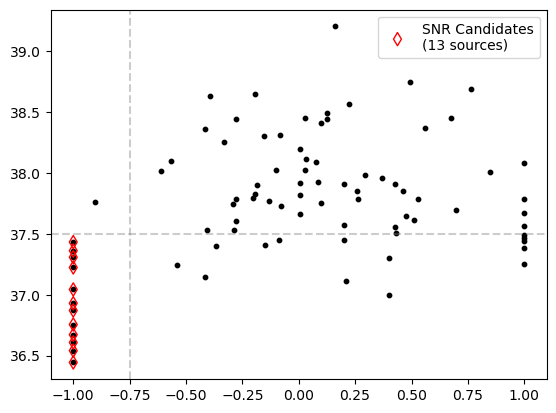

,Unnamed: 0,Separation,CSC ID,RA,Dec,Err Ellipse Major,Err Ellipse Minor,Err Ellipse Angle,Significance,Likelihood,...,Counts hilim,1Sig,2Sig,X,Y,2Sig (pix),ID,Bounds,LogLx,(SNR)
0,6,8.100148,2CXO J112015.0+125921,170.062538,12.989251,0.417169,0.377474,174.326803,3.028571,TRUE,...,21.057952,0.198328,0.467468,3722.5237,5527.1337,11.798781,CXO007,In,37.043263,1
1,8,8.748180,2CXO J112014.7+125937,170.061339,12.993597,0.373752,0.353781,175.324238,4.062500,TRUE,...,24.189117,0.198165,0.465134,3828.6427,5922.0231,11.739872,CXO009,In,37.307865,1
2,24,45.142910,2CXO J112015.7+125845,170.065490,12.979281,0.496865,0.398594,114.179479,2.473684,MARGINAL,...,15.428362,0.230993,0.557056,3461.1296,4621.2181,14.059974,CXO025,In,36.755654,1
3,32,55.540360,2CXO J112018.8+125932,170.078417,12.992199,0.355246,0.352550,100.025275,4.722222,TRUE,...,39.647935,0.180155,0.412782,2316.6505,5795.1184,10.418516,CXO033,In,37.432311,1
4,34,56.010743,2CXO J112018.8+125924,170.078512,12.990211,0.382236,0.374887,10.207139,3.696970,TRUE,...,27.972545,0.204380,0.478708,2308.1864,5614.4769,12.082486,CXO035,In,37.223740,1
5,41,62.781313,2CXO J112019.1+125947,170.079790,12.996356,0.568604,0.431156,177.945615,2.270270,TRUE,...,10.844639,0.327688,0.814304,2195.1306,6172.7859,20.552848,CXO042,In,36.671921,1
6,43,64.596761,2CXO J112016.7+125830,170.069903,12.975028,0.432959,0.416387,110.602463,2.914286,TRUE,...,18.872017,0.226934,0.542665,3070.3973,4234.8121,13.696748,CXO044,In,36.870636,1
7,44,68.719164,2CXO J112016.4+130034,170.068581,13.009677,0.898680,0.567040,149.540655,1.846154,TRUE,...,7.793080,0.424152,1.077406,3187.5345,7383.1631,27.193498,CXO045,In,-inf,1
8,46,72.223544,2CXO J112019.5+125958,170.081516,12.999423,0.611480,0.514987,16.123950,2.545455,TRUE,...,11.651285,0.335104,0.832043,2042.3195,6451.4525,21.000582,CXO047,In,36.443881,1
9,47,75.034310,2CXO J112014.8+125814,170.061855,12.970670,0.374988,0.359765,24.192297,4.315789,TRUE,...,33.960968,0.182755,0.421194,3782.9501,3838.8041,10.630845,CXO048,In,37.361746,1


In [ ]:
M66_best['LogLx'] = np.log10(Lum(F=M66_best['Flux'], dist=1.01e+7)) # 10.1 Mpc as used by PHANGS (https://archive.stsci.edu/hlsp/phangs.html#hst_image_products_table) for their analysis
M66_best = FindSNRs(M66_best)
display(Find(M66_best, "(SNR) != 0"))
M66_best.to_csv(chandra_hst_dir+'M66_csc_bestrads.frame')

# Estimating XRB masses with SED fitting, CMDs and CCDs

In [ ]:
M66_best = LoadSources(chandra_hst_dir+'M66_csc_bestrads.frame')
DaoCleanMatch = LoadSources(chandra_hst_dir+"M66_daoclean_matches.frame")
M66_notes = LoadSources(chandra_hst_dir+'M66_XRB_notes.txt')

Reading in sources from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_csc_bestrads.frame...
Reading in sources from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_daoclean_matches.frame...
Reading in sources from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_XRB_notes.txt...


## HMXBs

In [ ]:
# Only use sources classified as HMXBs
hmxbs = Find(M66_notes, 'Class == HMXB')

# Create dataframe with only the columns of DaoCleanMatch.
# Then out of DaoCleanMatch, only add the best-star matches from 
# the hmxb dataframe to this new dataframe 
hmxb_df = BuildFrame(headers=DaoCleanMatch.columns.tolist())
for index1, row1 in DaoCleanMatch.iterrows():
    for index2, row2 in hmxbs.iterrows():
        if DaoCleanMatch['CSC ID'][index1] == hmxbs['CSC ID'][index2]:
            if DaoCleanMatch['StarID'][index1] == hmxbs['Best Star'][index2]:
                hmxb_df = hmxb_df._append(DaoCleanMatch.iloc[index1], ignore_index=True)

# Now, we have the sources associated with the best-stars of the HMXBs
display(hmxb_df)

,X,Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,RA,Dec,CSC ID,StarID
0,3743.843919,5833.507868,19247,130956.0,NaN,36055.0,NaN,170.062292,12.992626,2CXO J112014.9+125933,2
1,3700.317585,5908.701948,19792,NaN,NaN,36916.0,NaN,170.062784,12.993454,2CXO J112015.0+125936,1
2,3727.624318,5519.646556,16435,NaN,NaN,NaN,NaN,170.062475,12.989172,2CXO J112015.0+125921,1
3,3652.013236,5540.798551,16667,NaN,NaN,32346.0,NaN,170.063329,12.989405,2CXO J112015.2+125921,2
4,3834.343555,5918.287693,19852,NaN,NaN,37022.0,NaN,170.061270,12.993559,2CXO J112014.7+125937,1
5,3694.780748,5952.563551,20110,134991.0,NaN,NaN,NaN,170.062846,12.993936,2CXO J112015.0+125938,1
6,3595.444164,6102.186159,21187,NaN,NaN,39199.0,20615.0,170.063968,12.995583,2CXO J112015.3+125944,1
7,4265.222965,6110.760032,21250,140213.0,105316.0,NaN,20690.0,170.056403,12.995677,2CXO J112013.5+125944,1
8,4518.077121,6197.146311,21971,NaN,NaN,40508.0,21529.0,170.053547,12.996628,2CXO J112012.8+125947,1
9,3042.724778,6490.637342,24541,NaN,116238.0,44454.0,24097.0,170.070211,12.999858,2CXO J112016.8+125959,3


In [ ]:
dist = 11.32e6 # units pc from https://iopscience.iop.org/article/10.3847/1538-4357/ace162/meta#apjace162s2
dmod = 5 * np.log10(dist) - 5
cd(hstdir)
HMXBPhots = GetDaoPhots(hmxb_df, 
                        photfiles=['photometry_M66_f555w_wfc3_sources.ecsv',
                                    'photometry_M66_f438w_wfc3_sources.ecsv',
                                    'photometry_M66_f814w_wfc3_sources.ecsv',
                                    'photometry_M66_f275w_wfc3_sources.ecsv',
                                    'photometry_M66_f336w_wfc3_sources.ecsv'],
                        idheads=['F555W ID', 'F438W ID', 'F814W ID', 'F275W ID', 'F336W ID'],
                        filters=['F555W', 'F438W', 'F814W', 'F275W', 'F336W'],
                        magheader='aperture_mag_corr', dmod=dmod)
HMXBPhots['ID'] = hmxb_df['StarID']
display(HMXBPhots) 

Searching photometry_M66_f555w_wfc3_sources.ecsv
Searching photometry_M66_f438w_wfc3_sources.ecsv
Searching photometry_M66_f814w_wfc3_sources.ecsv
Searching photometry_M66_f275w_wfc3_sources.ecsv
Searching photometry_M66_f336w_wfc3_sources.ecsv


,X,Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,RA,Dec,CSC ID,...,F555W Err,F438W,F438W Err,F814W,F814W Err,F275W,F275W Err,F336W,F336W Err,ID
0,3743.843919,5833.507868,19247,130956.0,NaN,36055.0,NaN,170.062292,12.992626,2CXO J112014.9+125933,...,-0.973168,-7.711479,-0.896442,NaN,NaN,-2.974469,-1.372681,NaN,NaN,2
1,3700.317585,5908.701948,19792,NaN,NaN,36916.0,NaN,170.062784,12.993454,2CXO J112015.0+125936,...,1.536468,NaN,1.142291,NaN,NaN,NaN,NaN,NaN,NaN,1
2,3727.624318,5519.646556,16435,NaN,NaN,NaN,NaN,170.062475,12.989172,2CXO J112015.0+125921,...,-2.693151,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,3652.013236,5540.798551,16667,NaN,NaN,32346.0,NaN,170.063329,12.989405,2CXO J112015.2+125921,...,-3.374700,-5.046482,-6.267793,NaN,NaN,NaN,NaN,NaN,NaN,2
4,3834.343555,5918.287693,19852,NaN,NaN,37022.0,NaN,170.061270,12.993559,2CXO J112014.7+125937,...,-4.222578,-4.744178,-7.880962,NaN,NaN,NaN,NaN,NaN,NaN,1
5,3694.780748,5952.563551,20110,134991.0,NaN,NaN,NaN,170.062846,12.993936,2CXO J112015.0+125938,...,-6.290347,NaN,NaN,NaN,NaN,-5.450522,-0.102546,NaN,NaN,1
6,3595.444164,6102.186159,21187,NaN,NaN,39199.0,20615.0,170.063968,12.995583,2CXO J112015.3+125944,...,0.943308,NaN,0.855513,NaN,2.461638,NaN,NaN,NaN,NaN,1
7,4265.222965,6110.760032,21250,140213.0,105316.0,NaN,20690.0,170.056403,12.995677,2CXO J112013.5+125944,...,-0.364728,NaN,NaN,-7.855328,-0.561741,-5.223577,-0.170918,-5.611739,-0.535002,1
8,4518.077121,6197.146311,21971,NaN,NaN,40508.0,21529.0,170.053547,12.996628,2CXO J112012.8+125947,...,-0.922180,-4.940801,-0.800427,-6.661469,-0.941390,NaN,NaN,NaN,NaN,1
9,3042.724778,6490.637342,24541,NaN,116238.0,44454.0,24097.0,170.070211,12.999858,2CXO J112016.8+125959,...,-0.157759,-7.299592,-0.143603,-7.958255,-0.220121,NaN,NaN,-7.826786,-0.155406,3


### HMXB SED fitting

In [ ]:
# the `showHR=True` is not working well and is only displaying the HR diagram for the last model.
#  The code needs to be updated to show the HR diagram for all the sources
hmxb_bestfit = FitSED(df=HMXBPhots, instrument='wfc3', idheader='CSC ID', min_models=10, plotSED=False, showHR=False)
display(hmxb_bestfit)

Finding best-fit model(s)...
DONE


,Zini,MH,logAge,Mini,int_IMF,Mass,logL,logTe,logg,label,...,F621M,F689M,F763M,F845M,F098M,F127M,F139M,F153M,Test Statistic,CSC ID
0,0.0152,0.01508,7.14003,14.447449,2.628936,14.069,4.700,3.6380,0.391,1,...,-6.969,-7.305,-7.573,-7.780,-8.038,-8.664,-8.842,-9.051,0.000002,2CXO J112014.7+125937
1,0.0152,0.01508,7.18003,13.932890,2.628694,13.249,4.701,3.6372,0.360,6,...,-6.966,-7.304,-7.575,-7.783,-8.043,-8.671,-8.850,-9.058,0.000004,2CXO J112014.7+125937
2,0.0152,0.01508,7.14003,14.446742,2.628936,14.069,4.699,3.6365,0.385,1,...,-6.957,-7.296,-7.568,-7.776,-8.036,-8.666,-8.846,-9.057,0.000019,2CXO J112014.7+125937
3,0.0152,0.01508,7.15003,14.225143,2.628834,13.846,4.686,3.6420,0.414,1,...,-6.958,-7.287,-7.548,-7.751,-8.001,-8.616,-8.791,-8.997,0.000031,2CXO J112014.7+125937
4,0.0152,0.01508,7.20003,13.520863,2.628486,12.990,4.668,3.6436,0.410,6,...,-6.923,-7.250,-7.508,-7.709,-7.956,-8.568,-8.741,-8.946,0.000032,2CXO J112014.7+125937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,0.0152,0.01508,3.85000,34.539719,2.632327,34.514,5.302,4.3202,2.907,0,...,-6.451,-6.407,-6.336,-6.274,-6.094,-5.998,-5.959,-5.932,0.419055,2CXO J112015.9+125727
156,0.0152,0.01508,6.85002,24.801214,2.631460,23.656,5.302,4.3187,2.736,1,...,-6.460,-6.416,-6.345,-6.284,-6.104,-6.008,-5.969,-5.943,0.491028,2CXO J112015.9+125727
157,0.0152,0.01508,6.86002,24.204195,2.631380,23.196,5.281,4.3106,2.717,1,...,-6.450,-6.407,-6.337,-6.277,-6.100,-6.006,-5.968,-5.942,0.786442,2CXO J112015.9+125727
158,0.0152,0.01508,6.87002,23.662815,2.631304,22.744,5.260,4.2906,2.649,1,...,-6.518,-6.479,-6.412,-6.356,-6.184,-6.095,-6.058,-6.034,0.505268,2CXO J112015.9+125727


CSC ID: 2CXO J112014.9+125933


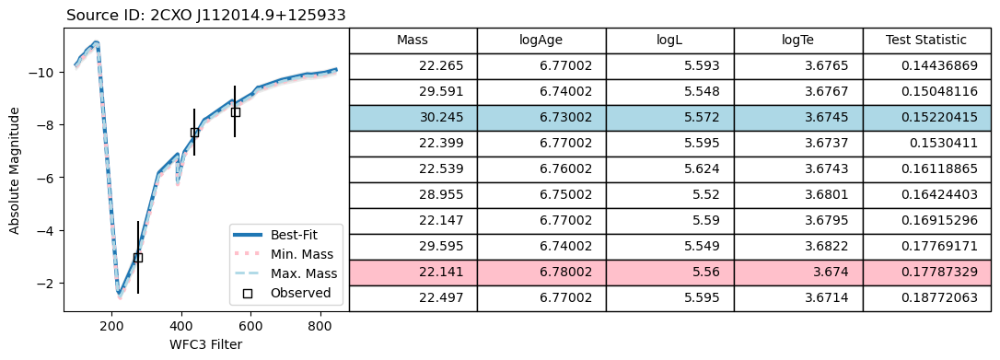

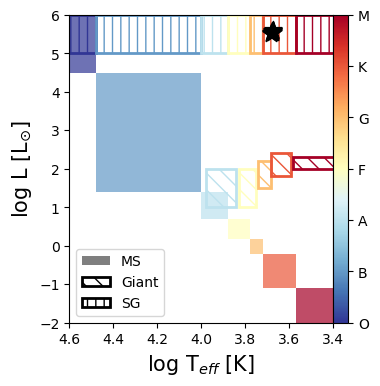

###################################################
CSC ID: 2CXO J112015.0+125936
No best-fit model available for Source ID 2CXO J112015.0+125936.
Oopsie Daisy...No models available for CSC ID: {id}
###################################################
CSC ID: 2CXO J112015.0+125921
No best-fit model available for Source ID 2CXO J112015.0+125921.
Oopsie Daisy...No models available for CSC ID: {id}
###################################################
CSC ID: 2CXO J112015.2+125921


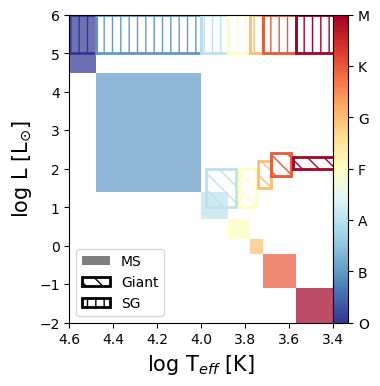

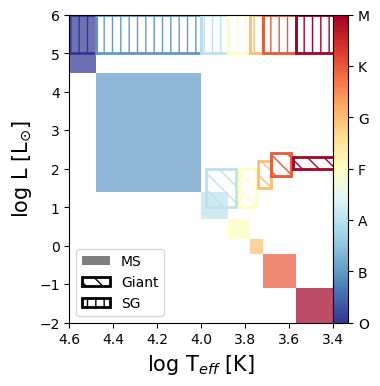

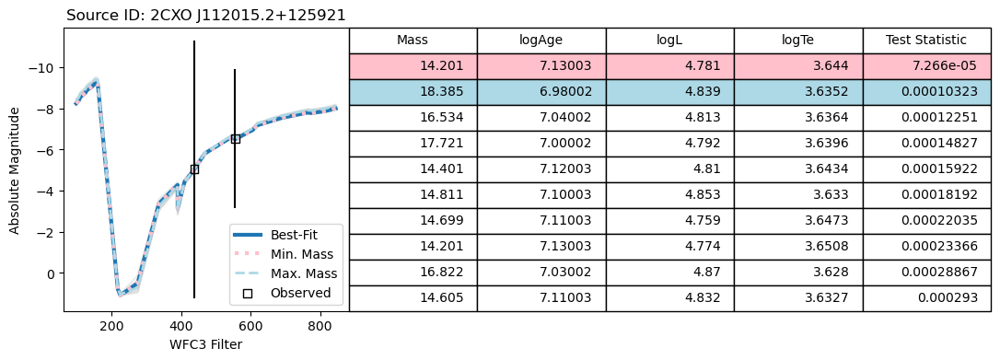

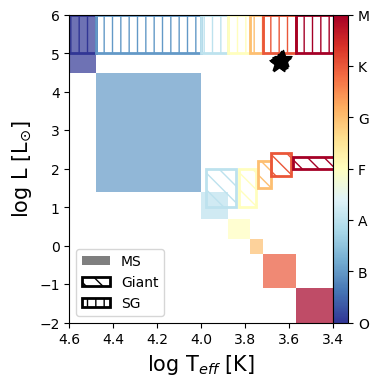

###################################################
CSC ID: 2CXO J112014.7+125937


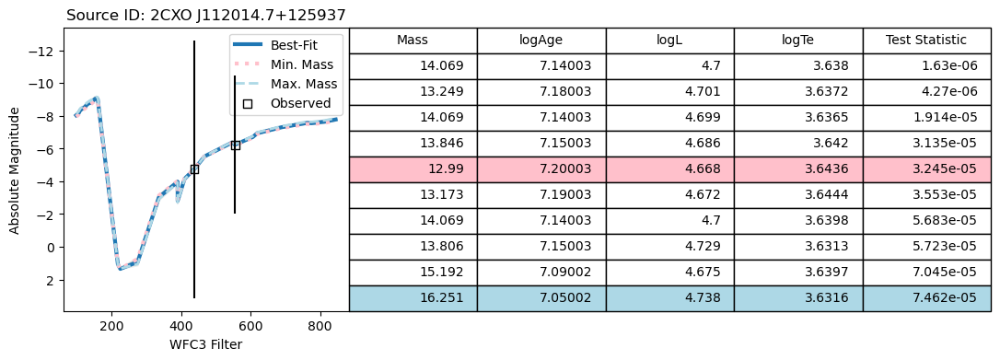

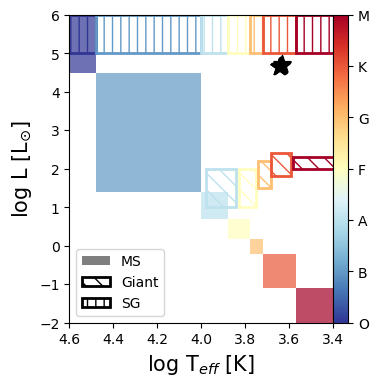

###################################################
CSC ID: 2CXO J112015.0+125938


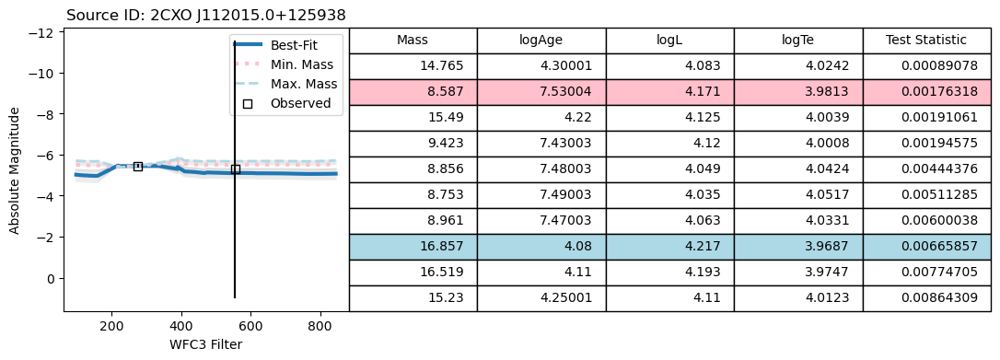

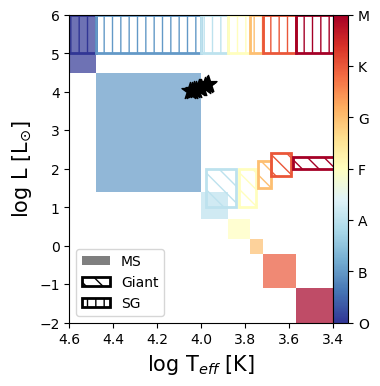

###################################################
CSC ID: 2CXO J112015.3+125944
No best-fit model available for Source ID 2CXO J112015.3+125944.
Oopsie Daisy...No models available for CSC ID: {id}
###################################################
CSC ID: 2CXO J112013.5+125944


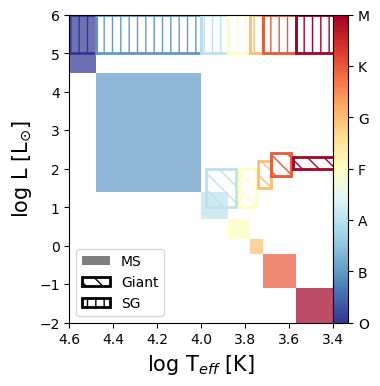

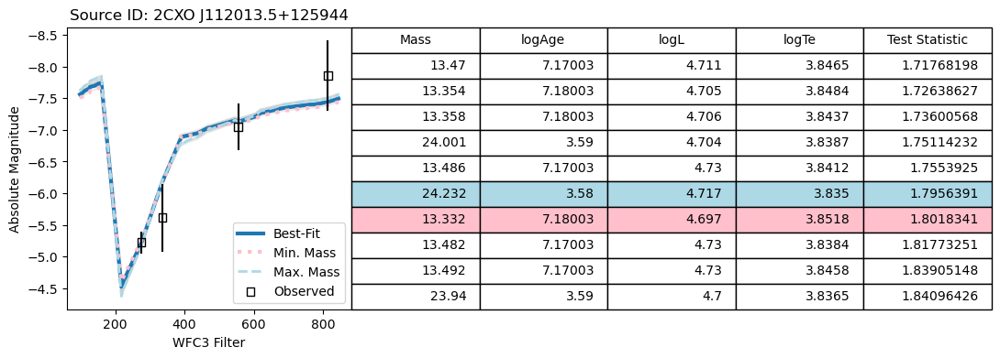

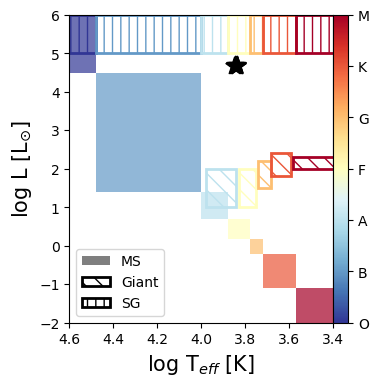

###################################################
CSC ID: 2CXO J112012.8+125947


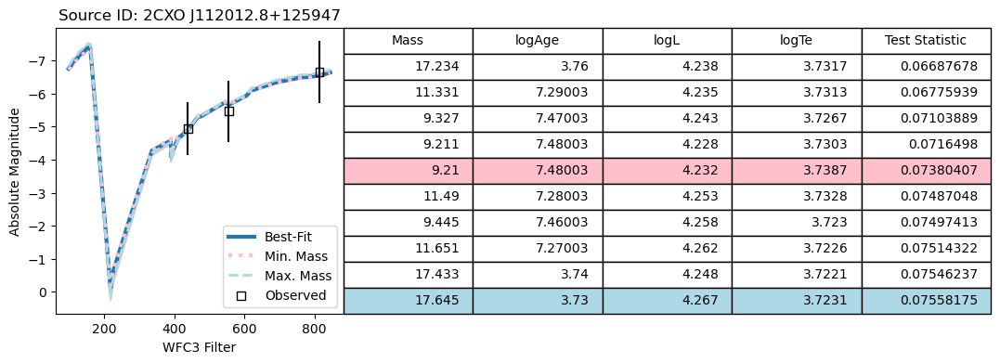

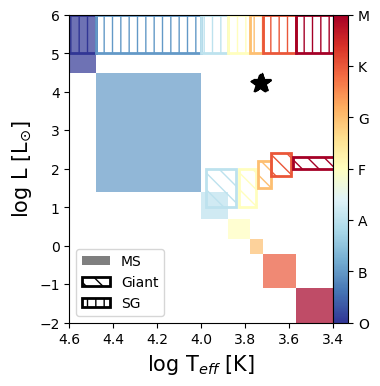

###################################################
CSC ID: 2CXO J112016.8+125959


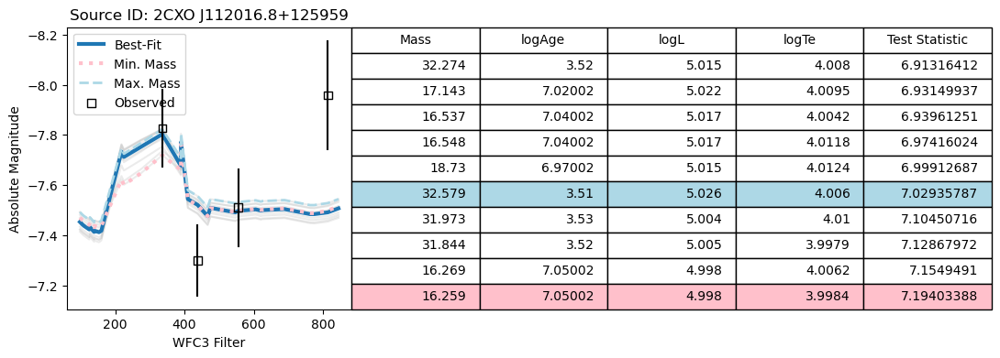

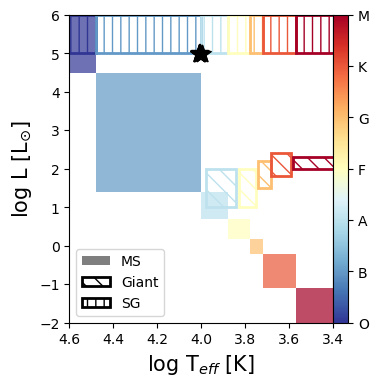

###################################################
CSC ID: 2CXO J112018.8+125924


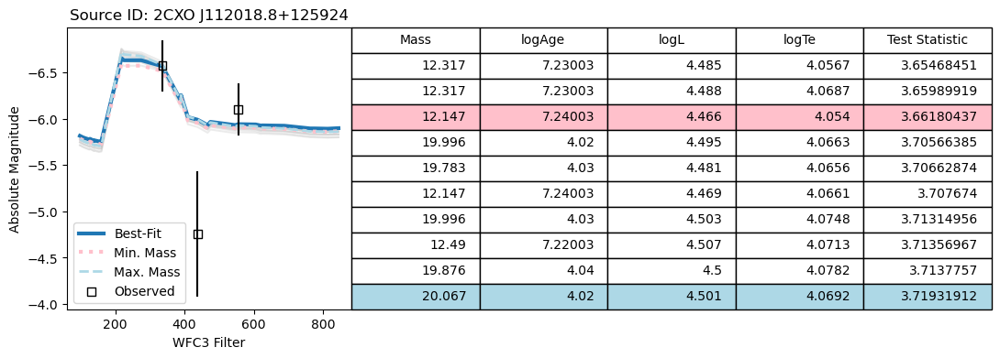

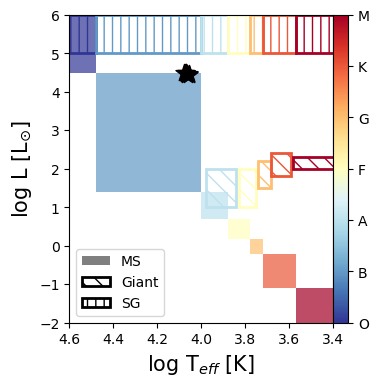

###################################################
CSC ID: 2CXO J112013.7+130025


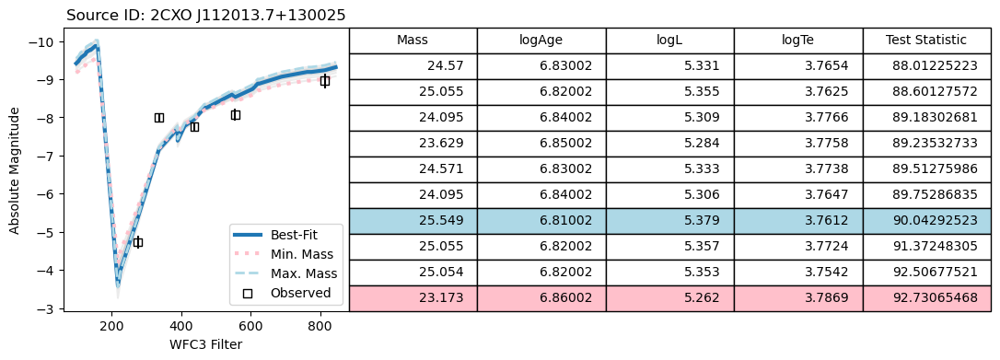

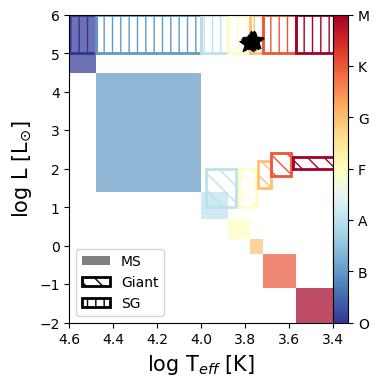

###################################################
CSC ID: 2CXO J112016.7+125830


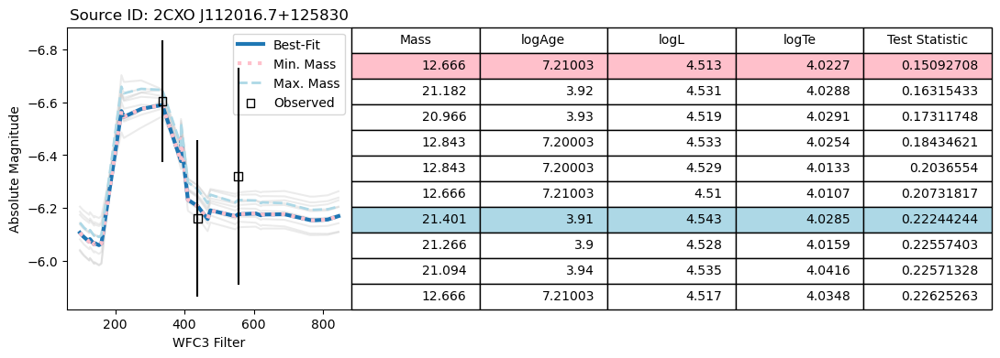

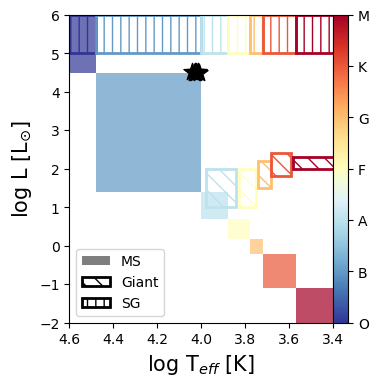

###################################################
CSC ID: 2CXO J112019.5+125958


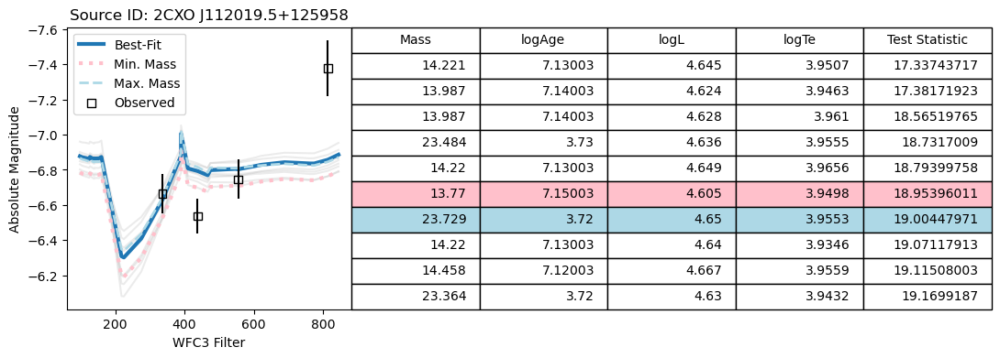

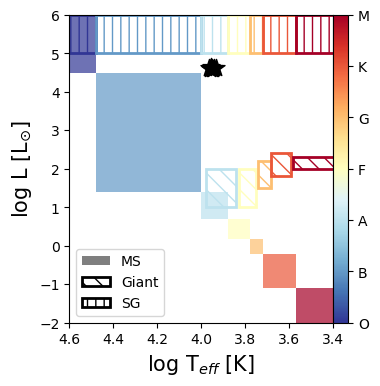

###################################################
CSC ID: 2CXO J112019.0+130027


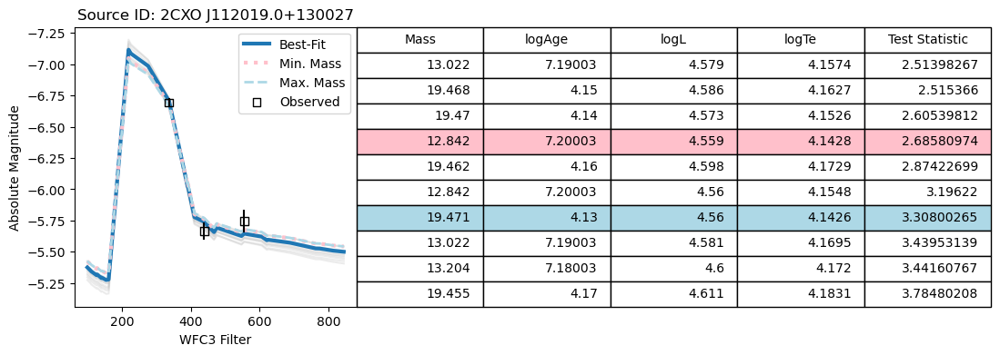

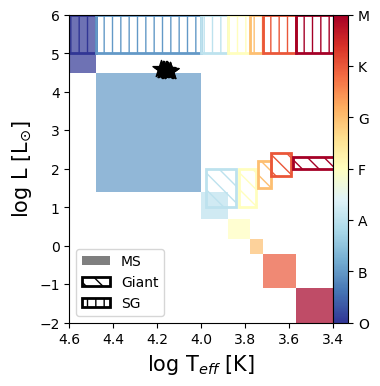

###################################################
CSC ID: 2CXO J112011.8+125811


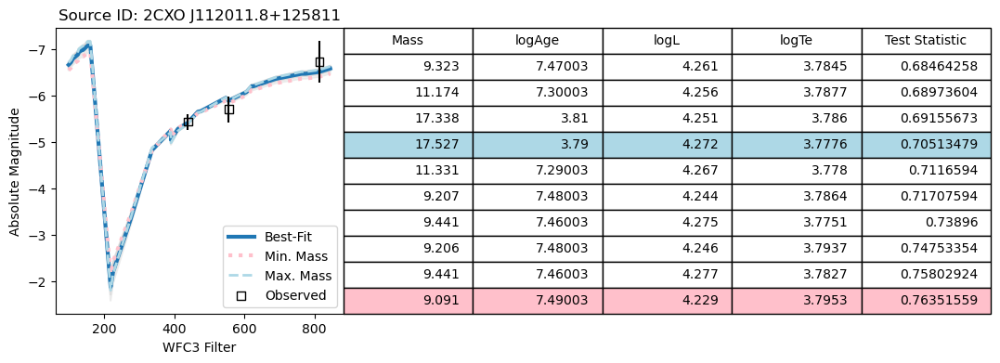

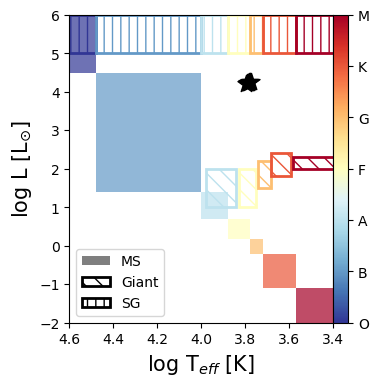

###################################################
CSC ID: 2CXO J112014.9+130113


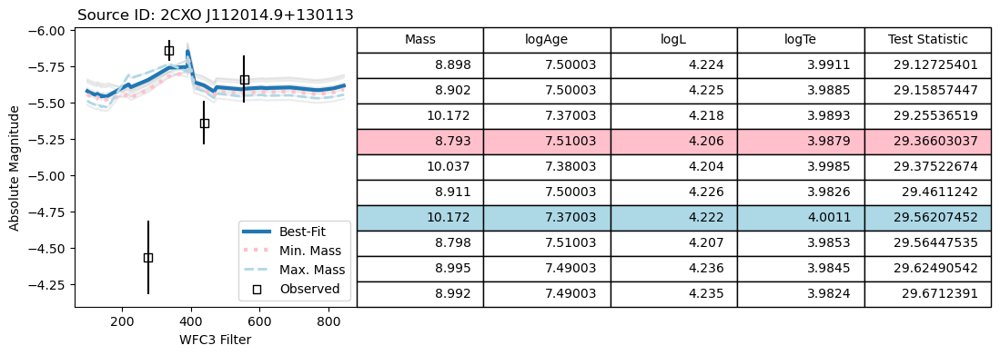

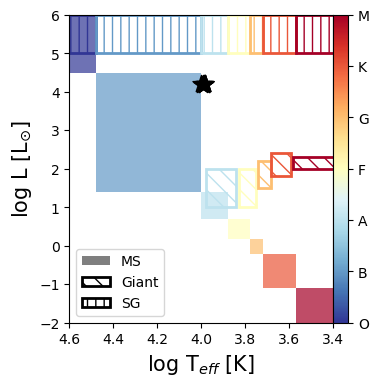

###################################################
CSC ID: 2CXO J112013.0+125736


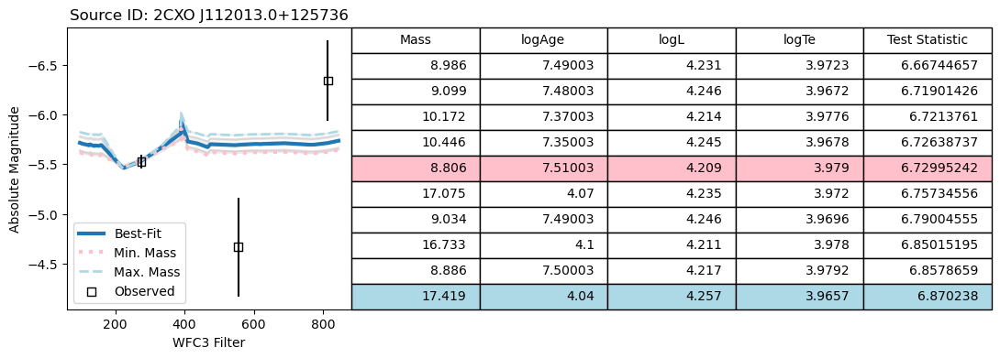

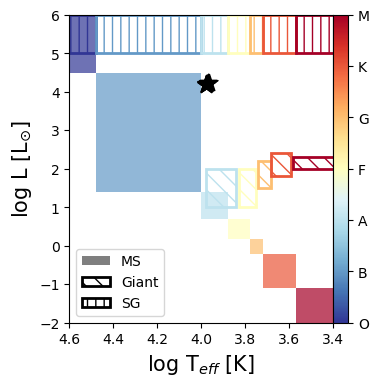

###################################################
CSC ID: 2CXO J112015.9+125727


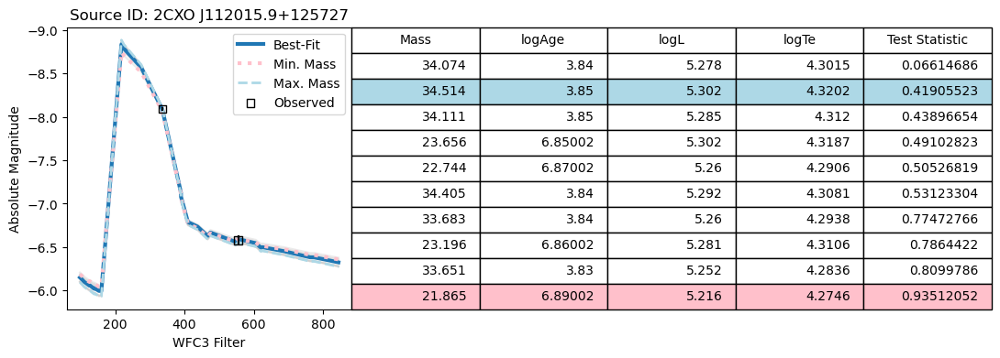

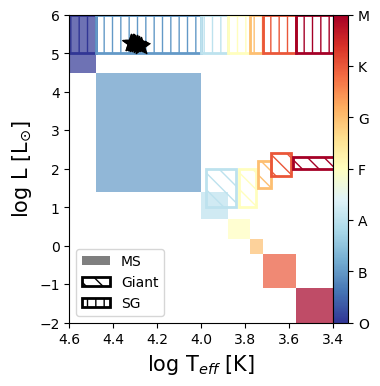

###################################################


In [ ]:
# This is a good workaround to cope around the showHR problem
hmxb_cscid = hmxbs['CSC ID'].tolist()

# There isn't any difference with the previous version when `model_ext=False`
for id in hmxb_cscid:
    try:
        print(f"CSC ID: {id}")
        PlotSED(df_sources=Find(HMXBPhots, f'CSC ID = {id}'),
                df_models=Find(hmxb_bestfit, f"CSC ID = {id}"),
                idheader='CSC ID', instrument='wfc3',
                showHR=True)
        print("###################################################")
        # PlotHR(df=Find(hmxb_bestfit, f'CSC ID = {id}'))
    except Exception:
        print("Oopsie Daisy...No models available for CSC ID: {id}")
        print("###################################################")
        pass

### HMXB CMDs

(<Figure size 600x400 with 1 Axes>,
 <Axes: xlabel='F814W - F555W', ylabel='F275W'>)

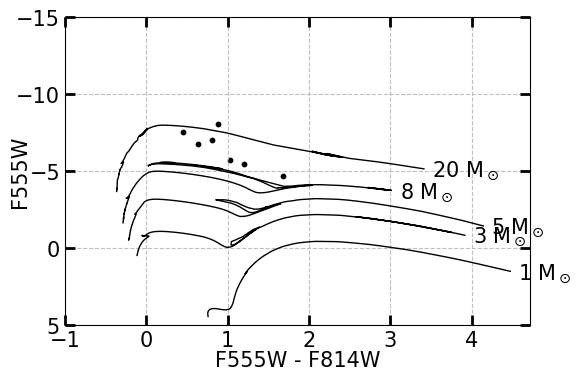

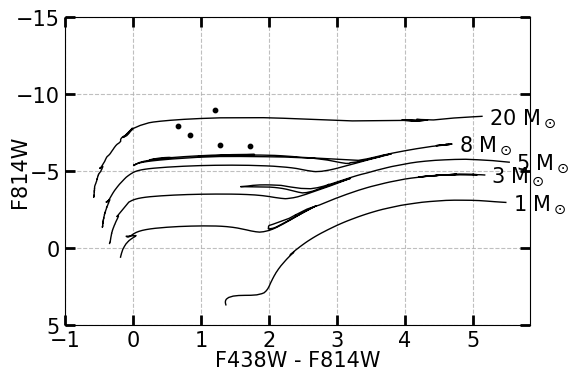

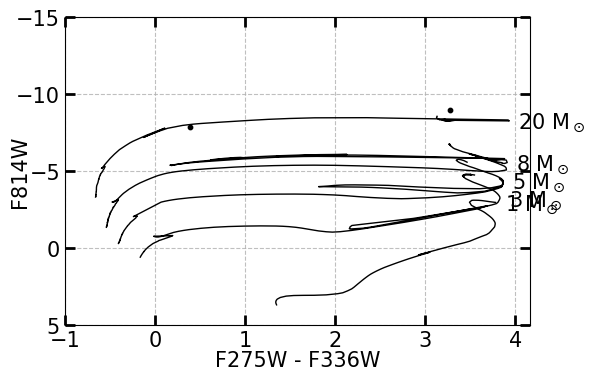

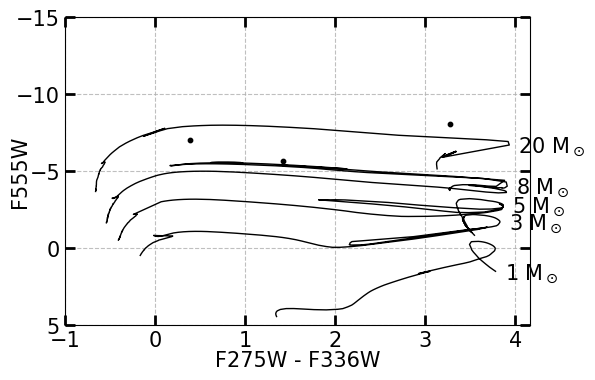

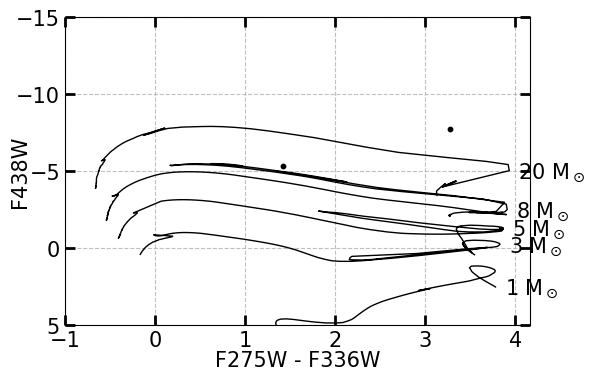

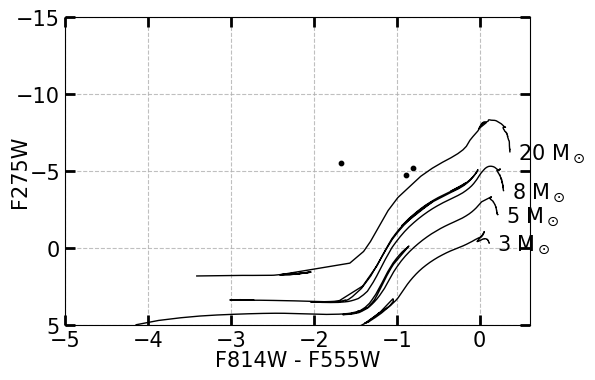

In [ ]:
MakeCMD(HMXBPhots, xcolor=["F555W", "F814W"], ycolor="F555W", 
        instrument="WFC3", ylim=(5,-15), xlim=-1)

MakeCMD(HMXBPhots, xcolor=["F438W", "F814W"], ycolor="F814W", 
        instrument="WFC3", ylim=(5,-15), xlim=-1)

MakeCMD(HMXBPhots, xcolor=['F275W', 'F336W'], ycolor="F814W", 
        instrument="WFC3", ylim=(5,-15), xlim=-1)

MakeCMD(HMXBPhots, xcolor=['F275W', 'F336W'], ycolor="F555W", 
        instrument="WFC3", ylim=(5,-15), xlim=-1)

MakeCMD(HMXBPhots, xcolor=['F275W', 'F336W'], ycolor="F438W", 
        instrument="WFC3", ylim=(5,-15), xlim=-1)

MakeCMD(HMXBPhots, xcolor=['F814W', 'F555W'], ycolor="F275W", 
        instrument="WFC3", ylim=(5,-15), xlim=-5)

## Clusters

In [ ]:
clusters = Find(M66_notes,
                criteria=['Class != Nucleus',
                          'Class != Foreground Star',
                          'Class != LMXB',
                          'Class != HMXB'])
clusters = clusters.loc[:, ~clusters.columns.str.contains('^Unnamed')]
clusters.insert(loc=5, column='Phangs-WFC3 Cluster ID', value='')
clusters.insert(loc=6, column='Phangs-WFC3 Compact Assoc ID (16 pc)', value='')
clusters.insert(loc=7, column='Phangs-ACS Compact Assoc', value='')
clusters.to_csv(chandra_hst_dir+'M66_XRB_clusters.txt', index=False)
display(clusters)

,CSC ID,ID,Class,Best Star,Mass,Phangs-WFC3 Cluster ID,Phangs-WFC3 Compact Assoc ID (16 pc),Phangs-ACS Compact Assoc,Notes
0,2CXO J112015.0+125928,CXO002,Compact Association,1.0,NaN,,,,PHANGS-WFC3 Compact Assoc 16 pc ID 2733
1,2CXO J112015.7+125845,CXO025,Compact Association,1.0,NaN,,,,(1) PHANGS-WFC3 Compact Assoc 16 pc ID 1698
2,2CXO J112017.6+125856,CXO029,Cluster,6.0,NaN,,,,(1) PHANGS-WFC3 Cluster ID 5530
3,2CXO J112018.8+125932,CXO033,Compact Association,2.0,NaN,,,,PHANGS-ACS Compact Assoc ID 4302
4,2CXO J112018.3+125900,CXO034,Cluster,1.0,NaN,,,,(1) PHANGS-WFC3 Cluster ID 5876
5,2CXO J112013.4+130026,CXO040,Cluster,1.0,NaN,,,,PHANGS-WFC3 Cluster ID 9731
6,2CXO J112019.1+125947,CXO042,Compact Association,4.0,NaN,,,,(1) PHANGS-WFC3 Compact Assoc 16 pc ID 2954 (2...
7,2CXO J112013.2+130035,CXO046,Compact Association,5.0,NaN,,,,(1) PHANGS-WFC3 Compact Assoc 16pc ID 3999 (2)...
8,2CXO J112018.9+130135,CXO067,Globular Cluster,1.0,NaN,,,,Self identified as cluster as it is not in PHA...


In [ ]:
clusters = pd.read_csv(chandra_hst_dir+'M66_XRB_clusters.txt')
clusters

,CSC ID,ID,Class,Best Star,Mass,Phangs-WFC3 Cluster ID,Phangs-WFC3 Compact Assoc ID (16 pc),Phangs-ACS Compact Assoc,Notes
0,2CXO J112015.0+125928,CXO002,Compact Association,1.0,NaN,NaN,NaN,NaN,PHANGS-WFC3 Compact Assoc 16 pc ID 2733
1,2CXO J112015.7+125845,CXO025,Compact Association,1.0,NaN,NaN,NaN,NaN,(1) PHANGS-WFC3 Compact Assoc 16 pc ID 1698
2,2CXO J112017.6+125856,CXO029,Cluster,6.0,NaN,NaN,NaN,NaN,(1) PHANGS-WFC3 Cluster ID 5530
3,2CXO J112018.8+125932,CXO033,Compact Association,2.0,NaN,NaN,NaN,NaN,PHANGS-ACS Compact Assoc ID 4302
4,2CXO J112018.3+125900,CXO034,Cluster,1.0,NaN,NaN,NaN,NaN,(1) PHANGS-WFC3 Cluster ID 5876
5,2CXO J112013.4+130026,CXO040,Cluster,1.0,NaN,NaN,NaN,NaN,PHANGS-WFC3 Cluster ID 9731
6,2CXO J112019.1+125947,CXO042,Compact Association,4.0,NaN,NaN,NaN,NaN,(1) PHANGS-WFC3 Compact Assoc 16 pc ID 2954 (2...
7,2CXO J112013.2+130035,CXO046,Compact Association,5.0,NaN,NaN,NaN,NaN,(1) PHANGS-WFC3 Compact Assoc 16pc ID 3999 (2)...
8,2CXO J112018.9+130135,CXO067,Globular Cluster,1.0,NaN,NaN,NaN,NaN,Self identified as cluster as it is not in PHA...


In [ ]:
# Get Photometry of clusters

# The same procedure as the one I performed with HMXBs
cluster_df = BuildFrame(headers=DaoCleanMatch.columns.tolist())
for index1, row1 in DaoCleanMatch.iterrows():
    for index2, row2 in clusters.iterrows():
        if DaoCleanMatch['CSC ID'][index1] == clusters['CSC ID'][index2]:
            if DaoCleanMatch['StarID'][index1] == clusters['Best Star'][index2]:
                cluster_df = cluster_df._append(DaoCleanMatch.iloc[index1], ignore_index=True)

display(cluster_df)

dist = 11.32e6 # units pc from https://iopscience.iop.org/article/10.3847/1538-4357/ace162/meta#apjace162s2
dmod = 5 * np.log10(dist) - 5
cd(hstdir)
clusterPhots = GetDaoPhots(cluster_df, 
                        photfiles=['photometry_M66_f555w_wfc3_extended.ecsv',
                                    'photometry_M66_f438w_wfc3_extended.ecsv',
                                    'photometry_M66_f814w_wfc3_extended.ecsv',
                                    'photometry_M66_f275w_wfc3_extended.ecsv',
                                    'photometry_M66_f336w_wfc3_extended.ecsv'],
                        idheads=['F555W ID', 'F438W ID', 'F814W ID', 'F275W ID', 'F336W ID'],
                        filters=['F555W', 'F438W', 'F814W', 'F275W', 'F336W'],
                        magheader='aperture_mag_corr', dmod=dmod)

clusterPhots['ID'] = cluster_df['StarID']
display(clusterPhots)

,X,Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,RA,Dec,CSC ID,StarID
0,3690.922608,5713.903685,18254,NaN,95118.0,34583.0,NaN,170.062890,12.991310,2CXO J112015.0+125928,1
1,3470.638926,4624.306397,9260,NaN,73613.0,21521.0,8708.0,170.065377,12.979318,2CXO J112015.7+125845,1
2,2760.635455,4897.088811,11581,NaN,77504.0,24692.0,10815.0,170.073396,12.982320,2CXO J112017.6+125856,6
3,2320.992830,5792.282146,18870,NaN,97028.0,35527.0,17936.0,170.078363,12.992172,2CXO J112018.8+125932,2
4,2505.543551,5010.300555,12590,NaN,79727.0,26196.0,11697.0,170.076278,12.983566,2CXO J112018.3+125900,1
5,4309.756069,7154.619682,30890,NaN,134261.0,53284.0,29703.0,170.055900,13.007166,2CXO J112013.4+130026,1
6,2190.213719,6174.760583,21763,NaN,NaN,40147.0,NaN,170.079840,12.996381,2CXO J112019.1+125947,4
7,4363.615697,7398.711500,32768,NaN,140112.0,55821.0,NaN,170.055292,13.009852,2CXO J112013.2+130035,5
8,2253.377834,8911.615949,35145,NaN,162170.0,60333.0,33337.0,170.079129,13.026502,2CXO J112018.9+130135,1


Searching photometry_M66_f555w_wfc3_extended.ecsv
Searching photometry_M66_f438w_wfc3_extended.ecsv
Searching photometry_M66_f814w_wfc3_extended.ecsv
Searching photometry_M66_f275w_wfc3_extended.ecsv
Searching photometry_M66_f336w_wfc3_extended.ecsv


,X,Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,RA,Dec,CSC ID,...,F555W Err,F438W,F438W Err,F814W,F814W Err,F275W,F275W Err,F336W,F336W Err,ID
0,3690.922608,5713.903685,18254,NaN,95118.0,34583.0,NaN,170.062890,12.991310,2CXO J112015.0+125928,...,-0.110582,-10.796225,-0.115614,NaN,NaN,NaN,NaN,-9.863160,-0.158430,1
1,3470.638926,4624.306397,9260,NaN,73613.0,21521.0,8708.0,170.065377,12.979318,2CXO J112015.7+125845,...,-0.254163,-7.000105,-0.252748,-8.842726,-0.323400,NaN,NaN,-6.549096,-0.287759,1
2,2760.635455,4897.088811,11581,NaN,77504.0,24692.0,10815.0,170.073396,12.982320,2CXO J112017.6+125856,...,-0.028204,-9.563463,-0.017672,-10.288601,-0.047358,NaN,NaN,-10.398337,-0.010664,6
3,2320.992830,5792.282146,18870,NaN,97028.0,35527.0,17936.0,170.078363,12.992172,2CXO J112018.8+125932,...,-0.013167,-9.763992,-0.011883,-10.381503,-0.023179,NaN,NaN,-10.632190,-0.009020,2
4,2505.543551,5010.300555,12590,NaN,79727.0,26196.0,11697.0,170.076278,12.983566,2CXO J112018.3+125900,...,-0.099039,-7.379582,-0.118778,-9.156919,-0.092875,NaN,NaN,-6.637343,-0.299929,1
5,4309.756069,7154.619682,30890,NaN,134261.0,53284.0,29703.0,170.055900,13.007166,2CXO J112013.4+130026,...,-0.019678,-11.006236,-0.015199,-11.622600,-0.030660,NaN,NaN,-11.971363,-0.009529,1
6,2190.213719,6174.760583,21763,NaN,NaN,40147.0,NaN,170.079840,12.996381,2CXO J112019.1+125947,...,-0.026072,-7.426880,-0.033538,NaN,NaN,NaN,NaN,NaN,NaN,4
7,4363.615697,7398.711500,32768,NaN,140112.0,55821.0,NaN,170.055292,13.009852,2CXO J112013.2+130035,...,-0.083229,-7.736671,-0.089380,NaN,NaN,NaN,NaN,-8.422764,-0.067493,5
8,2253.377834,8911.615949,35145,NaN,162170.0,60333.0,33337.0,170.079129,13.026502,2CXO J112018.9+130135,...,-0.011208,-7.259385,-0.009314,-9.401141,-0.013225,NaN,NaN,-7.594576,-0.014502,1


### Clusters CCDs

Plotting without extinction
Plotting reddening arrow for V-I vs. B-V
Plotting with extinction
Plotting reddening arrow for V-I vs. B-V
Plotting reddening arrow for V-I vs. B-V


<module 'matplotlib.pyplot' from '/Users/undergradstudent/anaconda3/envs/stenv/lib/python3.12/site-packages/matplotlib/pyplot.py'>

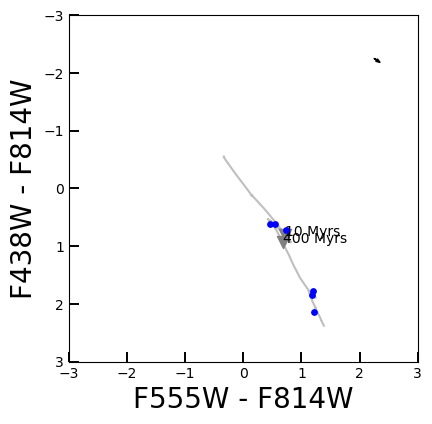

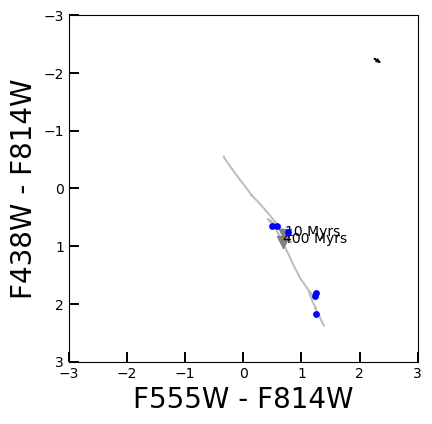

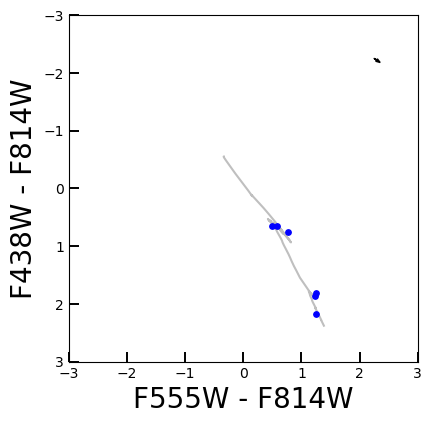

In [ ]:
# CCD of all the sources
EBV = (0.122 - 0.093)

print("Plotting without extinction")
MakeCCD(clusterPhots, color="blue", E_BV=EBV, correct_ext=False,
        xcolor=['F555W', 'F814W'], ycolor=['F438W', 'F814W'],
        instrument='wfc3', label_ages=True)

print("Plotting with extinction")
MakeCCD(clusterPhots, color="blue", E_BV=EBV, correct_ext=True,
        xcolor=['F555W', 'F814W'], ycolor=['F438W', 'F814W'],
        instrument='wfc3', label_ages=True)

MakeCCD(clusterPhots, color="blue", E_BV=EBV, correct_ext=True,
xcolor=['F555W', 'F814W'], ycolor=['F438W', 'F814W'],
instrument='wfc3', label_ages=False)

Plotting reddening arrow for V-I vs. B-V
Plotting reddening arrow for V-I vs. B-V
Plotting reddening arrow for V-I vs. B-V
Plotting reddening arrow for V-I vs. B-V


<module 'matplotlib.pyplot' from '/Users/undergradstudent/anaconda3/envs/stenv/lib/python3.12/site-packages/matplotlib/pyplot.py'>

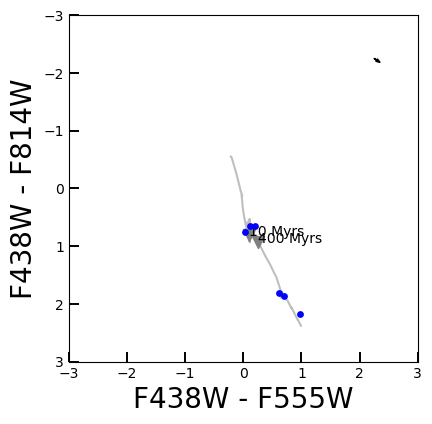

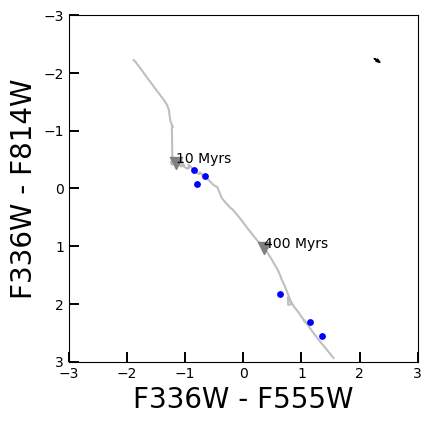

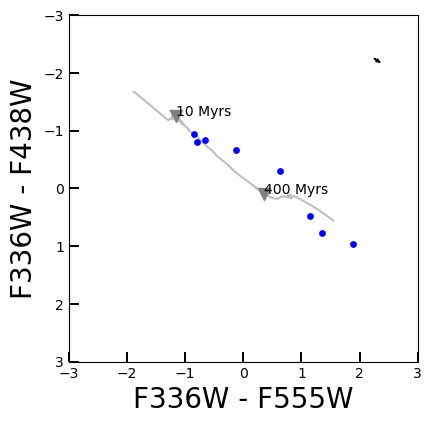

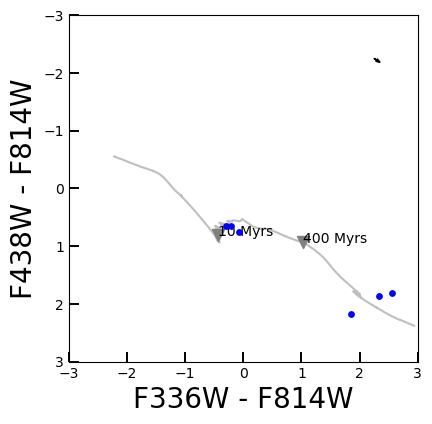

In [ ]:
# Some more fancy permutations of filters
MakeCCD(clusterPhots, color="blue", E_BV=EBV, correct_ext=True,
        xcolor=['F438W', 'F555W'], ycolor=['F438W', 'F814W'],
        instrument='wfc3', label_ages=True)

MakeCCD(clusterPhots, color="blue", E_BV=EBV, correct_ext=True,
        xcolor=['F336W', 'F555W'], ycolor=['F336W', 'F814W'],
        instrument='wfc3', label_ages=True)

MakeCCD(clusterPhots, color="blue", E_BV=EBV, correct_ext=True,
        xcolor=['F336W', 'F555W'], ycolor=['F336W', 'F438W'],
        instrument='wfc3', label_ages=True)

MakeCCD(clusterPhots, color="blue", E_BV=EBV, correct_ext=True,
        xcolor=['F336W', 'F814W'], ycolor=['F438W', 'F814W'],
        instrument='wfc3', label_ages=True)

#### PHANGS cluster and compact association catalogs

In [ ]:
# Importing Phangs catalogs for clusters and compact associations
phangs_cluster_cat = LoadSources(chandra_hst_dir+"M66_cluster_catalog.frame")
phangs_compact_assoc_wfc3 = LoadSources(chandra_hst_dir+'assoc_catalog_ws16pc.frame')
phangs_compact_assoc_acs = LoadSources(chandra_hst_dir+'M66_assoc_catalog_acs-uvis.frame')

Reading in sources from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_cluster_catalog.frame...
Reading in sources from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/assoc_catalog_ws16pc.frame...
Reading in sources from /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_assoc_catalog_acs-uvis.frame...


Plotting with extinction
Plotting reddening arrow for V-I vs. B-V
Plotting reddening arrow for V-I vs. B-V
Plotting reddening arrow for V-I vs. B-V
Plotting reddening arrow for V-I vs. B-V
Plotting reddening arrow for V-I vs. B-V


<module 'matplotlib.pyplot' from '/Users/undergradstudent/anaconda3/envs/stenv/lib/python3.12/site-packages/matplotlib/pyplot.py'>

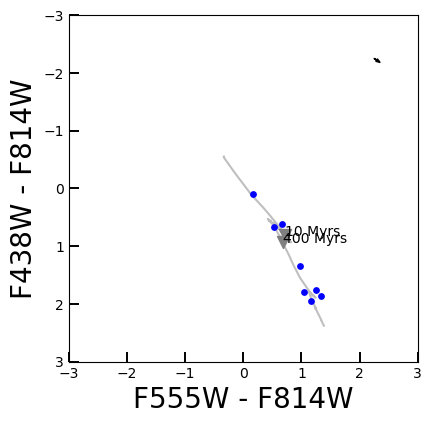

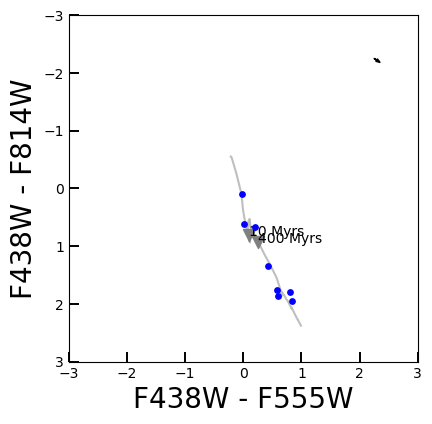

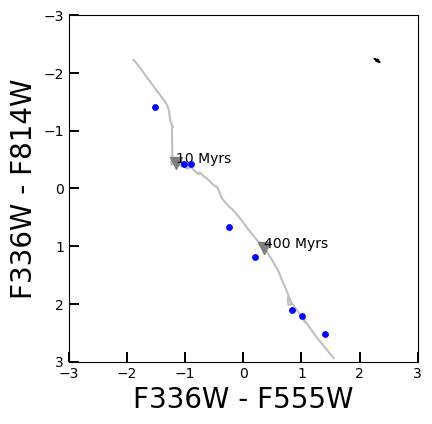

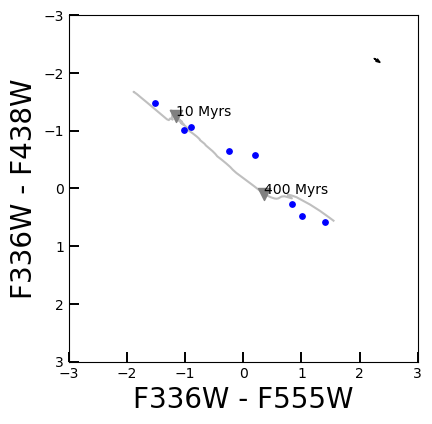

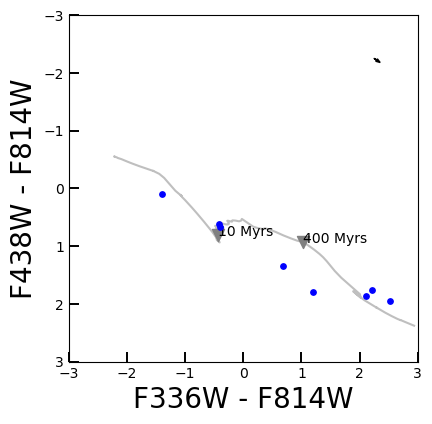

In [ ]:
EBV = (0.122 - 0.093)

# dataframe containing only the photometric information for the sources of interest. 
# The code for creating the dataframe had been committed to github so 
# it may be reverted to reference that code
PhangsPhots = pd.read_csv(M66_dir+"M66_XRB_phangs_clusters_photometry.frame")
print("Plotting with extinction")
MakeCCD(PhangsPhots, color="blue", E_BV=EBV, correct_ext=True,
        xcolor=['F555W', 'F814W'], ycolor=['F438W', 'F814W'],
        instrument='wfc3', label_ages=True)

MakeCCD(PhangsPhots, color="blue", E_BV=EBV, correct_ext=True,
        xcolor=['F438W', 'F555W'], ycolor=['F438W', 'F814W'],
        instrument='wfc3', label_ages=True)

MakeCCD(PhangsPhots, color="blue", E_BV=EBV, correct_ext=True,
        xcolor=['F336W', 'F555W'], ycolor=['F336W', 'F814W'],
        instrument='wfc3', label_ages=True)

MakeCCD(PhangsPhots, color="blue", E_BV=EBV, correct_ext=True,
        xcolor=['F336W', 'F555W'], ycolor=['F336W', 'F438W'],
        instrument='wfc3', label_ages=True)

MakeCCD(PhangsPhots, color="blue", E_BV=EBV, correct_ext=True,
        xcolor=['F336W', 'F814W'], ycolor=['F438W', 'F814W'],
        instrument='wfc3', label_ages=True)

### Individual CCDs

Here, I am comparing my work with the work of Phangs individually. 

Note: As expected the SED fitting on compact association sources does not work very well. 

In [ ]:
def PlotCCDs(xrbid, phangs,
             info=False,
             cscids=False,
             show_more=False,
             EBV=(0.122 - 0.093),
             show_all=False,
             sed=False):
    '''A convenience function to plot CCDs and do SED fitting
    
    This function will first spit out the ages and the masses from the Phangs catalog. 
    It will then plot the CCD with the XRBID work, SED plot if set to True, and the CCD
    with the Phangs data.
    PARAMETERS
    ----------
    xrbid : pd.DataFrame, the sources in my work.
    phangs : pd.DataFrame, the sources in PHANGS collab.
    info : bool, Print the mass and ages of the cluster. This is specifically to extract this
           this information from the Phangs cluster catalog.
    show_more : bool, If True, prints some more combinations of CCDs.'''

    for ids in cscids:
        print('###############################################################################')
        print(f'########################    {ids}    ##############################')
        if info:
            for index, row in phangs.iterrows():
                if phangs['CSC ID'][index] == ids:
                    print("Extracting mass and age from the Phangs catalog...")
                    print(f"Age: {phangs.loc[index]['Age']} +- {phangs.loc[index]['Age Err']}")
                    print(f"Mass: {phangs.loc[index]['Mass']} +- {phangs.loc[index]['Mass Err']}")
        dataframe = [xrbid, phangs]
        for df in dataframe:

            if df.equals(xrbid):
                print(f"This is the XRBID work...")
            if df.equals(phangs): 
                print('This is the PHANGS work...')

            df = Find(df, f'CSC ID = {ids}')
            MakeCCD(df, color='blue', E_BV=EBV, correct_ext=True,
                    xcolor=['F336W', 'F438W'], ycolor=['F438W', 'F555W'],
                    instrument='wfc3', label_ages=True)
            plt.show()
            if show_all:
                MakeCCD(df, color="blue", E_BV=EBV, correct_ext=True,
                    xcolor=['F336W', 'F555W'], ycolor=['F336W', 'F814W'],
                    instrument='wfc3', label_ages=True)
                plt.show()

                MakeCCD(df,
                    color="blue", E_BV=EBV, correct_ext=True,
                    xcolor=['F336W', 'F555W'], ycolor=['F336W', 'F438W'],
                    instrument='wfc3', label_ages=True)
                plt.show()

                MakeCCD(df, color="blue", E_BV=EBV, correct_ext=True,
                    xcolor=['F336W', 'F814W'], ycolor=['F438W', 'F814W'],

                    instrument='wfc3', label_ages=True)
                plt.show()

                MakeCCD(df, 
                    color="blue", E_BV=EBV, correct_ext=True,
                    xcolor=['F438W', 'F555W'], ycolor=['F336W', 'F555W'],
                    instrument='wfc3', label_ages=True)
                plt.show()
            
            if sed:
                bestfit = FitSED(df=df, instrument='wfc3', min_models=10, idheader='CSC ID', showHR=True)
            print("#########################################################################")

In [ ]:
display(clusterPhots)
display(PhangsPhots)

,X,Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,RA,Dec,CSC ID,...,F555W Err,F438W,F438W Err,F814W,F814W Err,F275W,F275W Err,F336W,F336W Err,ID
0,3690.922608,5713.903685,18254,NaN,95118.0,34583.0,NaN,170.062890,12.991310,2CXO J112015.0+125928,...,-0.110582,-10.796225,-0.115614,NaN,NaN,NaN,NaN,-9.863160,-0.158430,1
1,3470.638926,4624.306397,9260,NaN,73613.0,21521.0,8708.0,170.065377,12.979318,2CXO J112015.7+125845,...,-0.254163,-7.000105,-0.252748,-8.842726,-0.323400,NaN,NaN,-6.549096,-0.287759,1
2,2760.635455,4897.088811,11581,NaN,77504.0,24692.0,10815.0,170.073396,12.982320,2CXO J112017.6+125856,...,-0.028204,-9.563463,-0.017672,-10.288601,-0.047358,NaN,NaN,-10.398337,-0.010664,6
3,2320.992830,5792.282146,18870,NaN,97028.0,35527.0,17936.0,170.078363,12.992172,2CXO J112018.8+125932,...,-0.013167,-9.763992,-0.011883,-10.381503,-0.023179,NaN,NaN,-10.632190,-0.009020,2
4,2505.543551,5010.300555,12590,NaN,79727.0,26196.0,11697.0,170.076278,12.983566,2CXO J112018.3+125900,...,-0.099039,-7.379582,-0.118778,-9.156919,-0.092875,NaN,NaN,-6.637343,-0.299929,1
5,4309.756069,7154.619682,30890,NaN,134261.0,53284.0,29703.0,170.055900,13.007166,2CXO J112013.4+130026,...,-0.019678,-11.006236,-0.015199,-11.622600,-0.030660,NaN,NaN,-11.971363,-0.009529,1
6,2190.213719,6174.760583,21763,NaN,NaN,40147.0,NaN,170.079840,12.996381,2CXO J112019.1+125947,...,-0.026072,-7.426880,-0.033538,NaN,NaN,NaN,NaN,NaN,NaN,4
7,4363.615697,7398.711500,32768,NaN,140112.0,55821.0,NaN,170.055292,13.009852,2CXO J112013.2+130035,...,-0.083229,-7.736671,-0.089380,NaN,NaN,NaN,NaN,-8.422764,-0.067493,5
8,2253.377834,8911.615949,35145,NaN,162170.0,60333.0,33337.0,170.079129,13.026502,2CXO J112018.9+130135,...,-0.011208,-7.259385,-0.009314,-9.401141,-0.013225,NaN,NaN,-7.594576,-0.014502,1


,RA,Dec,PHANGS ID,Best Star,CSC ID,Class,F555W,F555W Err,F814W,F814W Err,...,F275W Err,PHANGS CI,Age,Age Err,Mass,Mass Err,EBV,EBV Err,Reduced Minchisq,438W Err
0,170.073410,12.982327,5530.0,6.0,2CXO J112017.6+125856,Cluster,21.049498,0.020141,20.431970,0.028296,...,0.026688,1.568222,32.0,25.0,2.570643e+04,18119.891745,0.00,0.12,0.908746,NaN
1,170.076285,12.983565,5876.0,1.0,2CXO J112018.3+125900,Cluster,22.183718,0.022256,20.979712,0.019148,...,0.430212,1.766174,375.0,193.0,1.147344e+05,1217.751594,0.40,0.15,0.298006,NaN
2,170.055875,13.007270,9731.0,1.0,2CXO J112013.4+130026,Cluster,17.377963,0.003610,16.887860,0.003823,...,0.004123,1.390906,1.0,0.0,1.489712e+06,177087.635508,0.51,0.03,0.637159,NaN
3,170.062904,12.991299,2733.0,1.0,2CXO J112015.0+125928,Compact Association,18.801160,0.003535,17.680627,0.004018,...,0.032157,NaN,770.0,0.0,2.665800e+06,299516.664000,0.34,0.03,0.946981,0.006576
4,170.065378,12.979325,1698.0,1.0,2CXO J112015.7+125845,Compact Association,22.888432,0.024387,21.598970,0.021826,...,0.182153,NaN,158.0,11.0,4.507385e+04,5696.928000,0.55,0.06,0.062204,0.043842
5,170.079847,12.996394,2954.0,4.0,2CXO J112019.1+125947,Compact Association,21.977155,0.022306,20.975225,0.022332,...,0.080565,NaN,2.0,1.0,5.527068e+04,24944.930000,1.00,0.05,1.334639,0.041036
6,170.055303,13.009844,3999.0,5.0,2CXO J112013.2+130035,Compact Association,21.368606,0.018632,20.440105,0.019348,...,0.042031,NaN,6.0,4.0,1.416200e+04,45160.805000,0.56,0.25,0.382810,0.026088
7,170.078358,12.992318,4302.0,2.0,2CXO J112018.8+125932,Compact Association,20.847687,0.022519,20.727226,0.038916,...,0.014451,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


###############################################################################
########################    2CXO J112017.6+125856    ##############################
Extracting mass and age from the Phangs catalog...
Age: 32.0 +- 25.0
Mass: 25706.43281727997 +- 18119.891744899185
This is the XRBID work...
Plotting reddening arrow for V-I vs. B-V


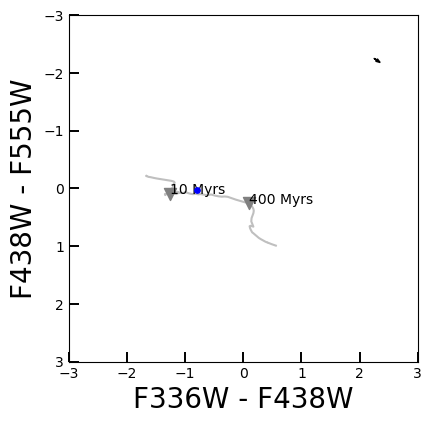

#########################################################################
This is the PHANGS work...
Plotting reddening arrow for V-I vs. B-V


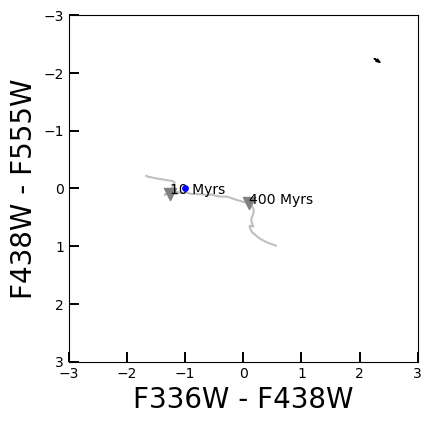

#########################################################################
###############################################################################
########################    2CXO J112018.3+125900    ##############################
Extracting mass and age from the Phangs catalog...
Age: 375.0 +- 193.0
Mass: 114734.38528347318 +- 1217.7515941574238
This is the XRBID work...
Plotting reddening arrow for V-I vs. B-V


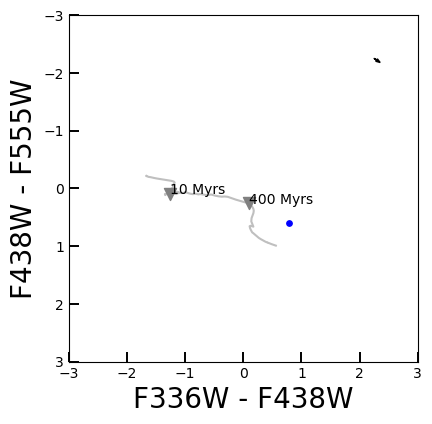

#########################################################################
This is the PHANGS work...
Plotting reddening arrow for V-I vs. B-V


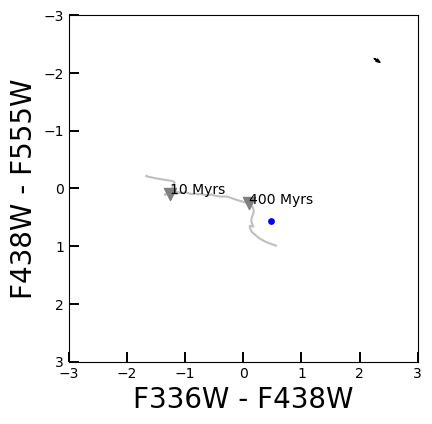

#########################################################################
###############################################################################
########################    2CXO J112013.4+130026    ##############################
Extracting mass and age from the Phangs catalog...
Age: 1.0 +- 0.0
Mass: 1489712.1645434874 +- 177087.63550812122
This is the XRBID work...
Plotting reddening arrow for V-I vs. B-V


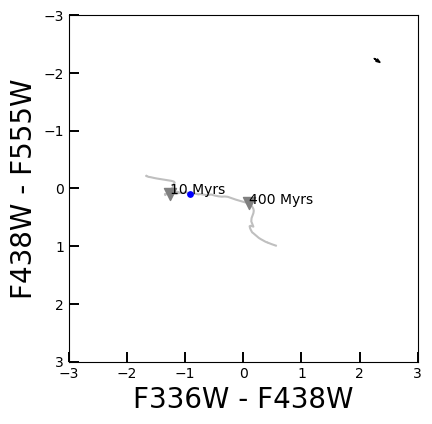

#########################################################################
This is the PHANGS work...
Plotting reddening arrow for V-I vs. B-V


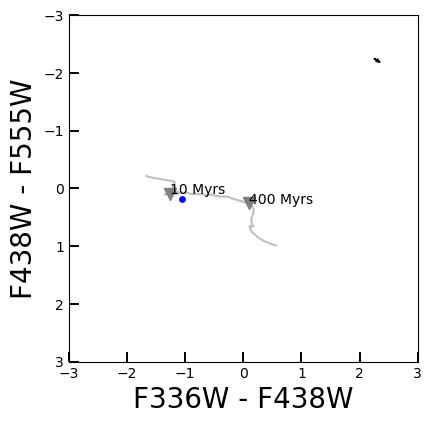

#########################################################################
###############################################################################
########################    2CXO J112015.0+125928    ##############################
Extracting mass and age from the Phangs catalog...
Age: 770.0 +- 0.0
Mass: 2665800.2202640623 +- 299516.664
This is the XRBID work...
Plotting reddening arrow for V-I vs. B-V


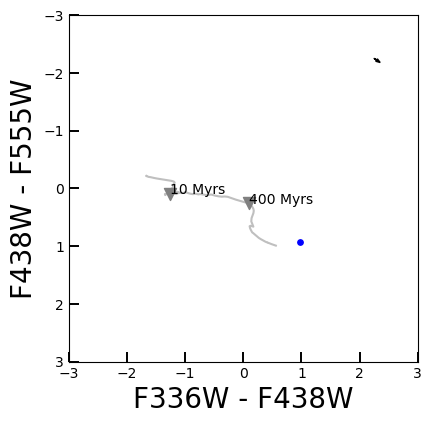

#########################################################################
This is the PHANGS work...
Plotting reddening arrow for V-I vs. B-V


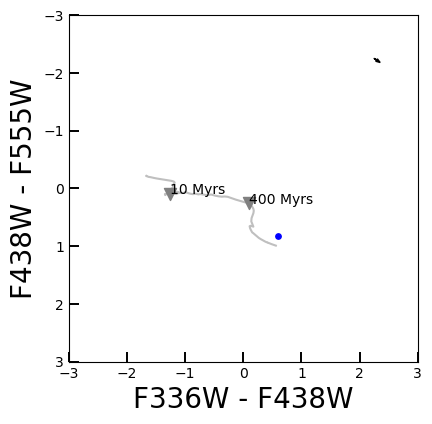

#########################################################################
###############################################################################
########################    2CXO J112015.7+125845    ##############################
Extracting mass and age from the Phangs catalog...
Age: 158.0 +- 11.0
Mass: 45073.85380802911 +- 5696.928
This is the XRBID work...
Plotting reddening arrow for V-I vs. B-V


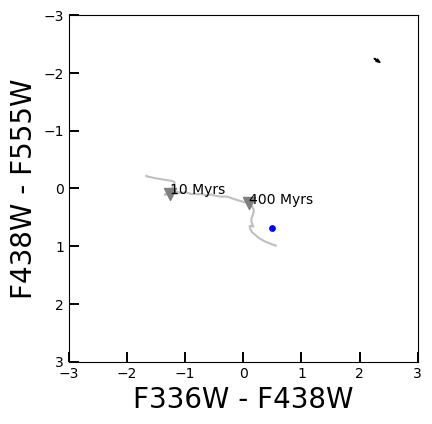

#########################################################################
This is the PHANGS work...
Plotting reddening arrow for V-I vs. B-V


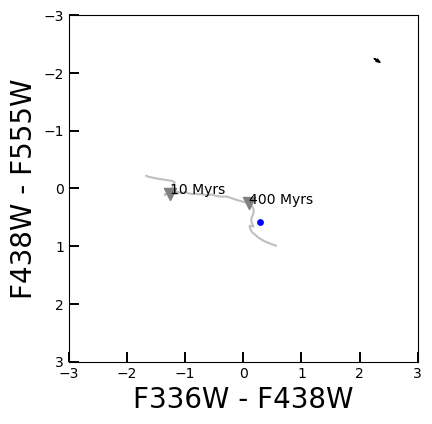

#########################################################################
###############################################################################
########################    2CXO J112019.1+125947    ##############################
Extracting mass and age from the Phangs catalog...
Age: 2.0 +- 1.0
Mass: 55270.68277448304 +- 24944.93
This is the XRBID work...
Plotting reddening arrow for V-I vs. B-V


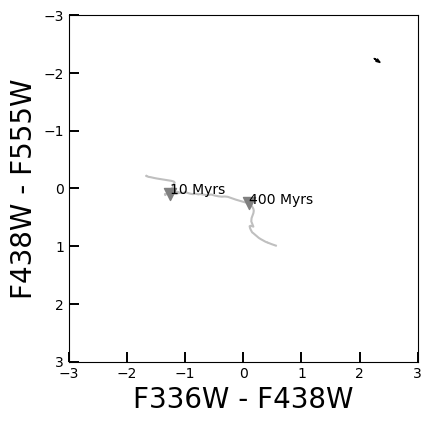

#########################################################################
This is the PHANGS work...
Plotting reddening arrow for V-I vs. B-V


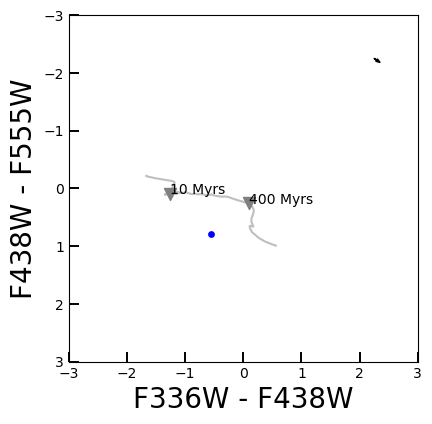

#########################################################################
###############################################################################
########################    2CXO J112013.2+130035    ##############################
Extracting mass and age from the Phangs catalog...
Age: 6.0 +- 4.0
Mass: 14162.000277752486 +- 45160.805
This is the XRBID work...
Plotting reddening arrow for V-I vs. B-V


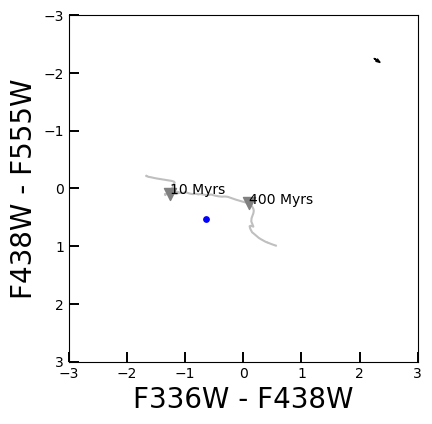

#########################################################################
This is the PHANGS work...
Plotting reddening arrow for V-I vs. B-V


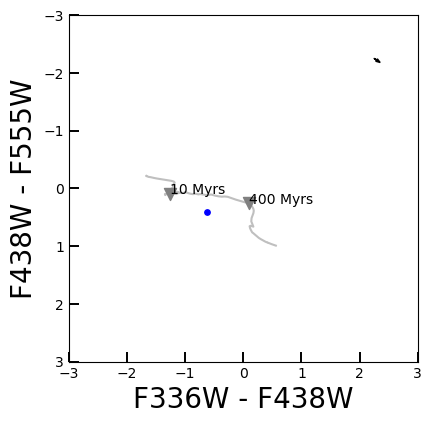

#########################################################################
###############################################################################
########################    2CXO J112018.8+125932    ##############################
Extracting mass and age from the Phangs catalog...
Age: nan +- nan
Mass: nan +- nan
This is the XRBID work...
Plotting reddening arrow for V-I vs. B-V


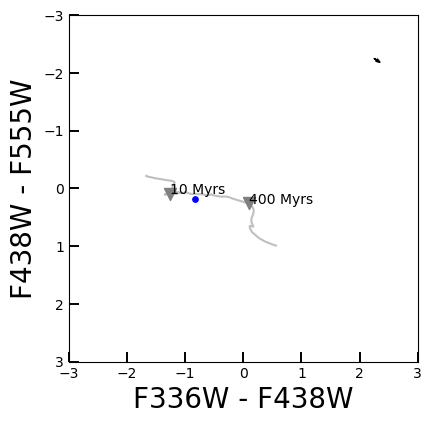

#########################################################################
This is the PHANGS work...
Plotting reddening arrow for V-I vs. B-V


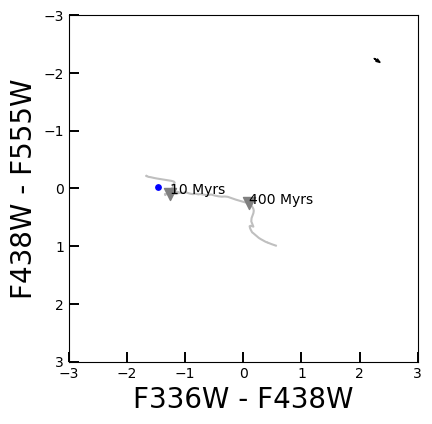

#########################################################################


In [ ]:
PlotCCDs(xrbid=clusterPhots, phangs=PhangsPhots, 
         cscids=PhangsPhots['CSC ID'].tolist(), info=True, sed=False)

##################    CSC ID 2CXO J112018.9+130135    ######################
Plotting reddening arrow for V-I vs. B-V


<module 'matplotlib.pyplot' from '/Users/undergradstudent/anaconda3/envs/stenv/lib/python3.12/site-packages/matplotlib/pyplot.py'>

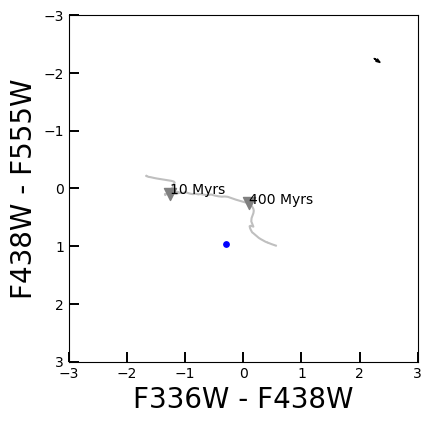

In [ ]:
print("##################    CSC ID 2CXO J112018.9+130135    ######################")
MakeCCD(Find(clusterPhots, 'CSC ID = 2CXO J112018.9+130135'),
        color='blue', E_BV=EBV, correct_ext=True,
        xcolor=['F336W', 'F438W'], ycolor=['F438W', 'F555W'],
        instrument='wfc3', label_ages=True)

## Trying out SED fitting with dust extinction

Finding best-fit model(s)...
DONE


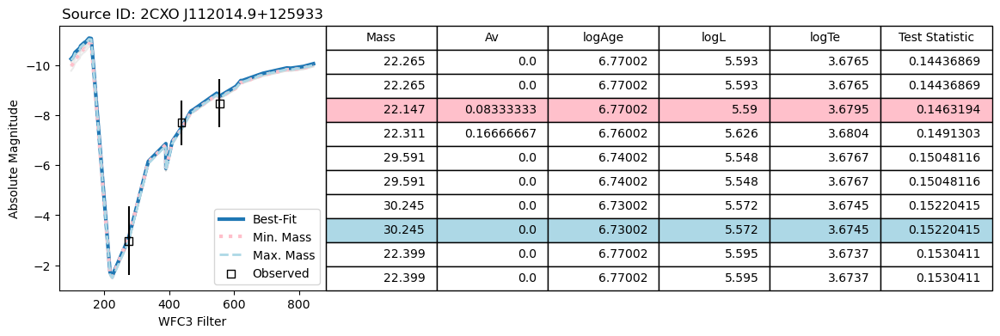

No best-fit model available for Source ID 2CXO J112015.0+125936.
No best-fit model available for Source ID 2CXO J112015.0+125921.


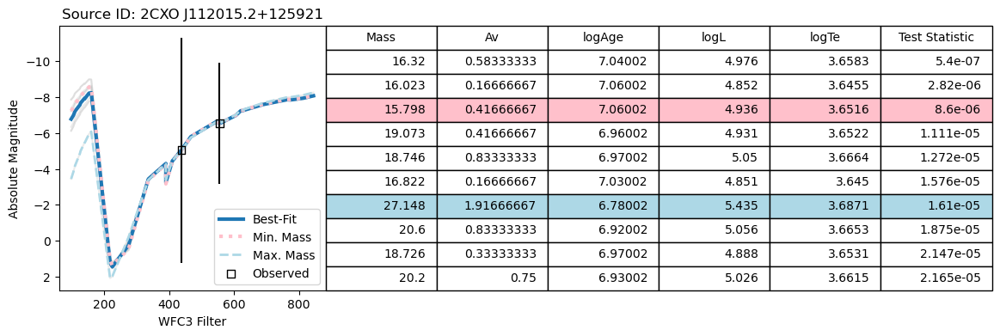

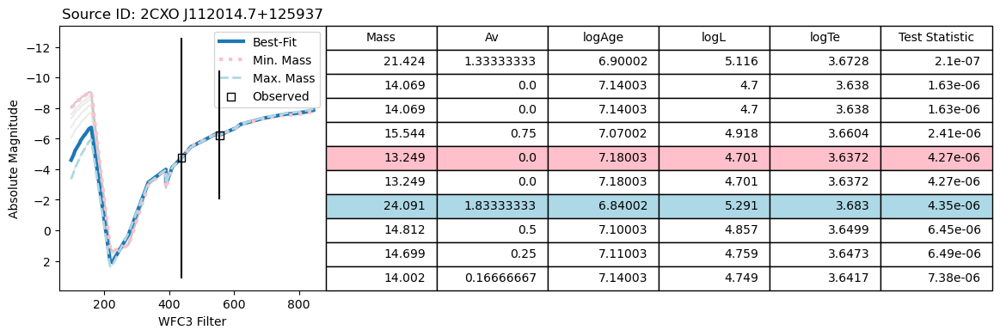

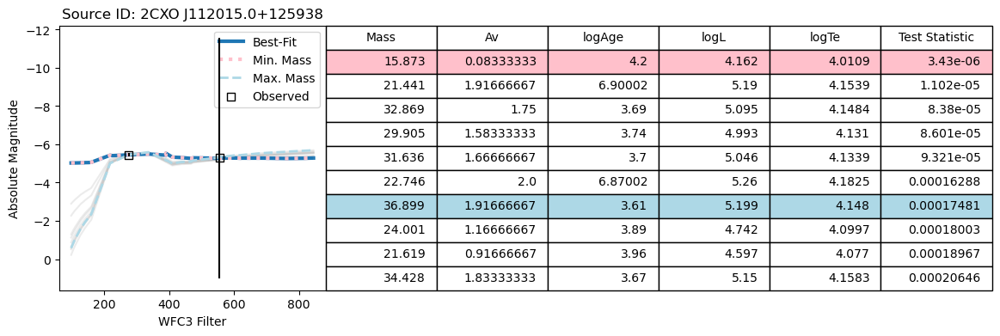

No best-fit model available for Source ID 2CXO J112015.3+125944.


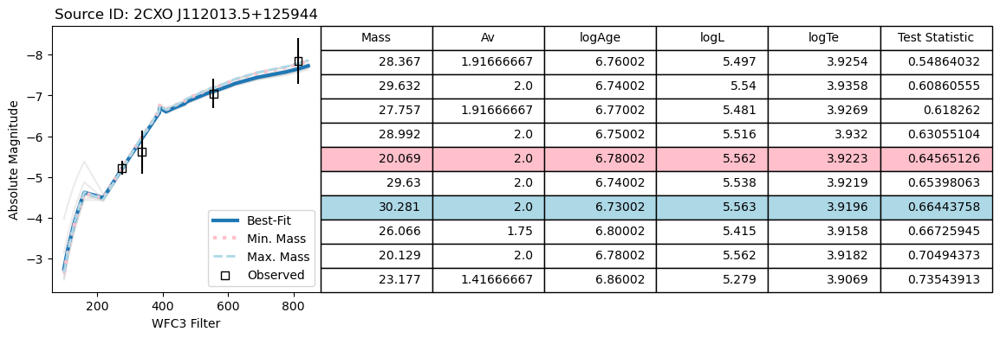

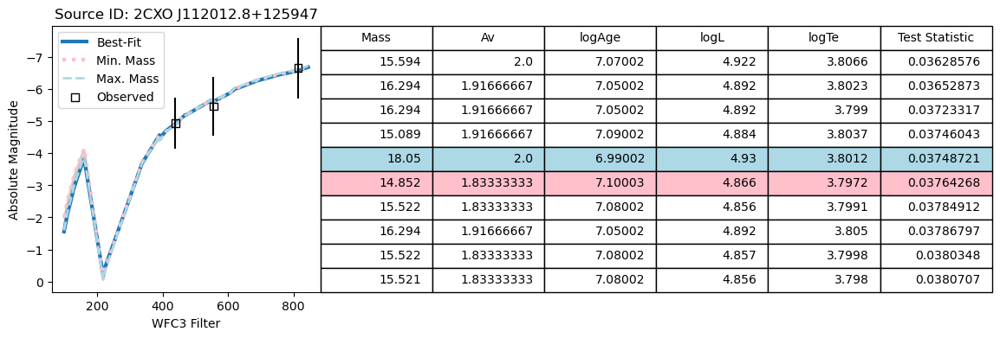

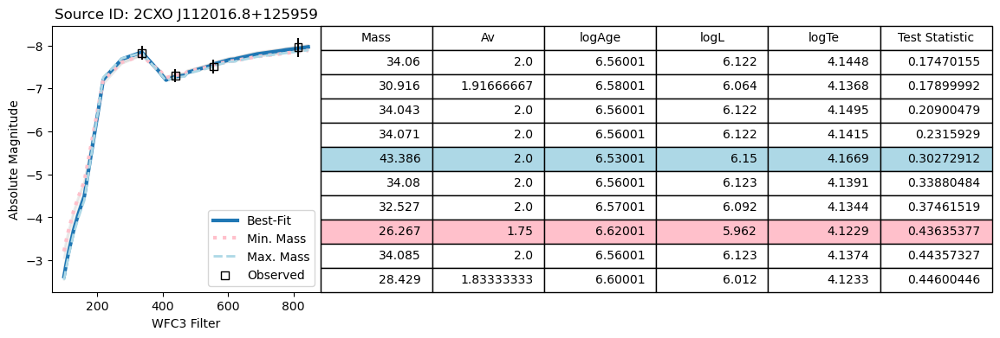

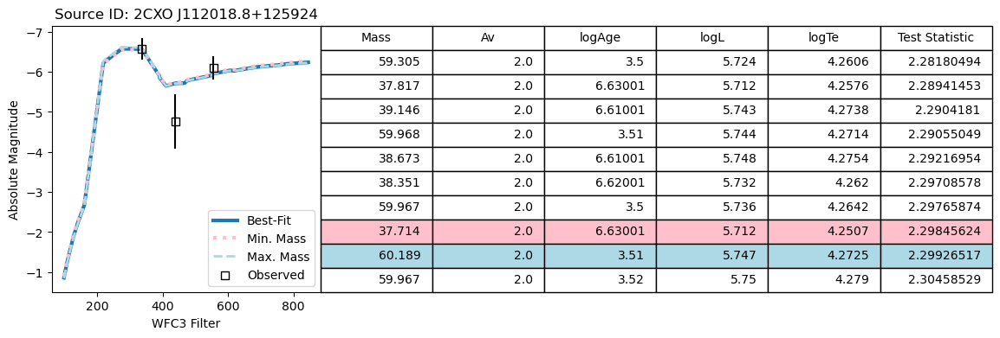

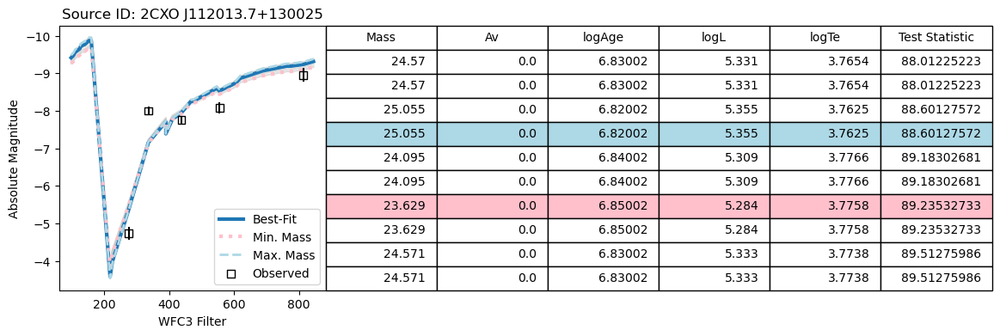

...

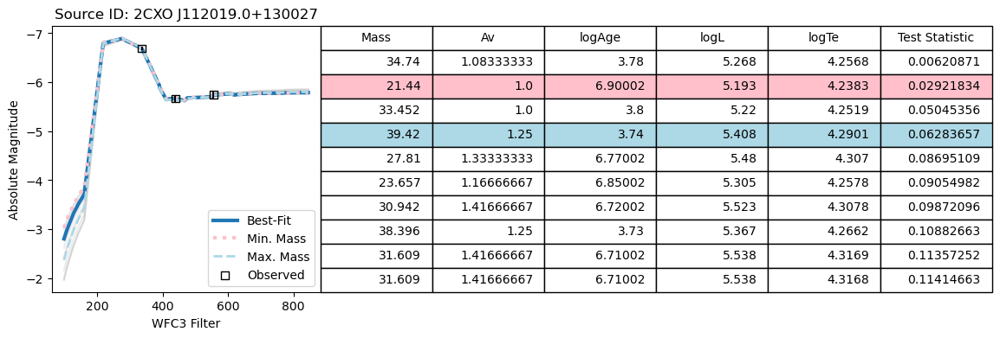

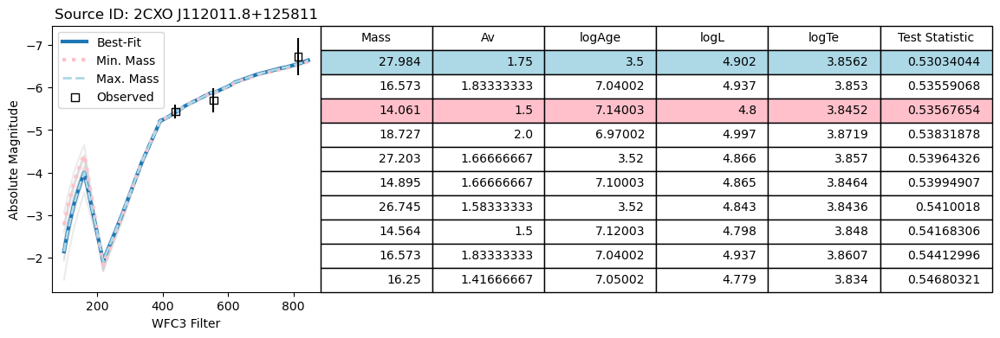

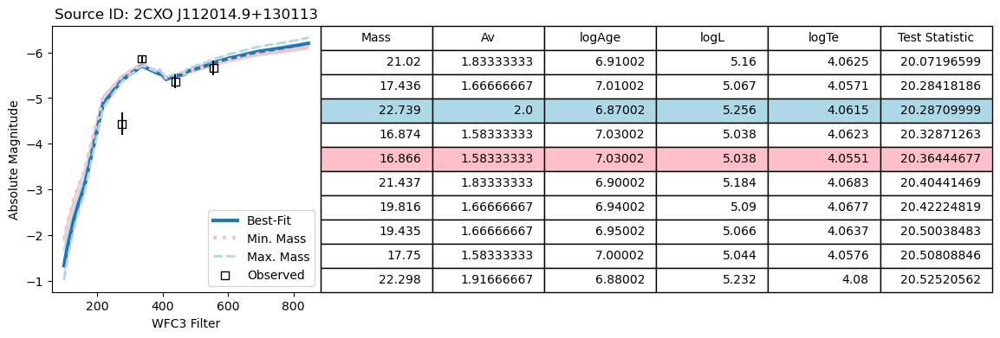

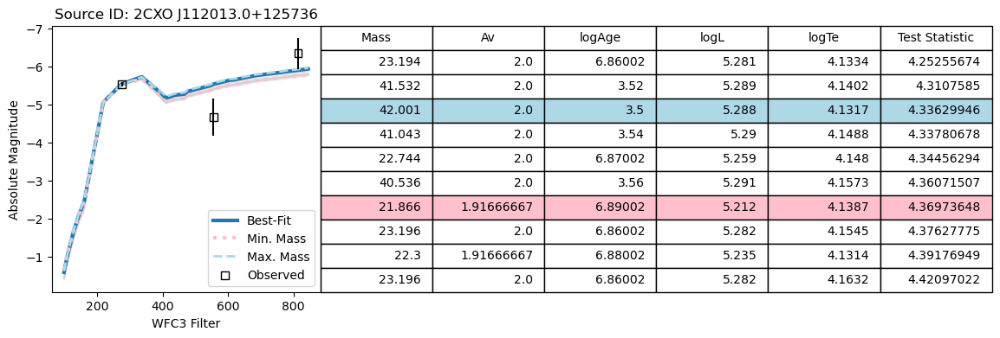

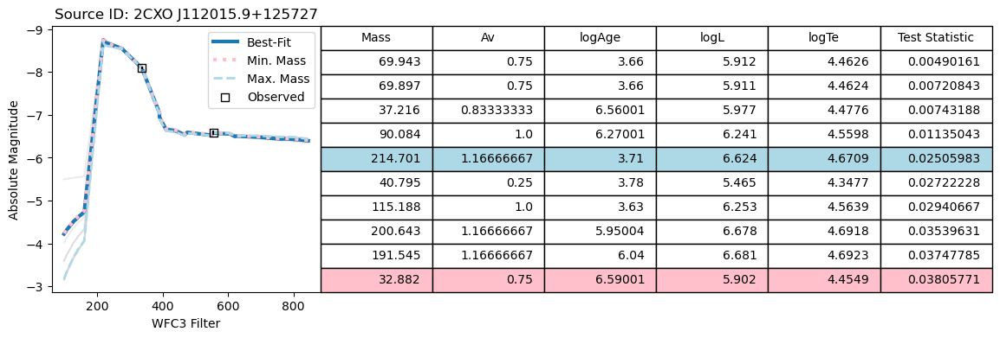

,Zini,MH,logAge,Mini,int_IMF,Mass,logL,logTe,logg,label,...,F689M,F763M,F845M,F098M,F127M,F139M,F153M,Av,Test Statistic,CSC ID
0,0.0152,0.01508,6.90002,22.185715,2.631074,21.424,5.116,3.6728,0.296,1,...,-7.333222,-7.631708,-7.877828,-4.603005,-5.874111,-6.244935,-6.654809,1.333333,2.096291e-07,2CXO J112014.7+125937
1,0.0152,0.01508,7.04002,17.746626,2.630110,16.320,4.976,3.6583,0.260,3,...,-7.581785,-7.854122,-8.071112,-6.774752,-7.669548,-7.926222,-8.217479,0.583333,5.386878e-07,2CXO J112015.2+125921
2,0.0152,0.01508,7.14003,14.447449,2.628936,14.069,4.700,3.6380,0.391,1,...,-7.305000,-7.573000,-7.780000,-8.038000,-8.664000,-8.842000,-9.051000,0.000000,1.626648e-06,2CXO J112014.7+125937
3,0.0152,0.01508,7.14003,14.447449,2.628936,14.069,4.700,3.6380,0.391,1,...,-7.305000,-7.573000,-7.780000,-8.038000,-8.664000,-8.842000,-9.051000,0.000000,1.626648e-06,2CXO J112014.7+125937
4,0.0152,0.01508,7.07002,16.805555,2.629828,15.544,4.918,3.6604,0.305,3,...,-7.300437,-7.579586,-7.803716,-6.068253,-7.050562,-7.334714,-7.653330,0.750000,2.406067e-06,2CXO J112014.7+125937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,0.0152,0.01508,3.63000,115.294502,2.633602,115.188,6.253,4.5639,3.454,0,...,-6.501916,-6.465781,-6.421621,-3.594004,-4.018083,-4.137952,-4.271107,1.000000,2.940667e-02,2CXO J112015.9+125727
156,0.0152,0.01508,6.27001,109.374084,2.633578,90.084,6.241,4.5598,3.343,0,...,-6.499916,-6.463781,-6.420621,-3.593004,-4.016083,-4.135952,-4.269107,1.000000,1.135043e-02,2CXO J112015.9+125727
157,0.0152,0.01508,3.71000,215.388641,2.633619,214.701,6.624,4.6709,3.782,0,...,-6.514569,-6.483245,-6.435224,-3.172504,-3.681097,-3.827444,-3.986958,1.166667,2.505983e-02,2CXO J112015.9+125727
158,0.0152,0.01508,5.95004,237.691055,2.633619,200.643,6.678,4.6918,3.782,0,...,-6.498569,-6.466245,-6.418224,-3.153504,-3.661097,-3.806444,-3.966958,1.166667,3.539631e-02,2CXO J112015.9+125727


In [ ]:
fit_hmxb = FitSED(df=HMXBPhots, instrument='wfc3', idheader='CSC ID',
                  min_models=10, plotSED=True, showHR=False, model_ext=True)

display(fit_hmxb)

##################################################################
##################  CSC ID 2CXO J112014.9+125933   ##########################
Finding best-fit model(s)...
DONE


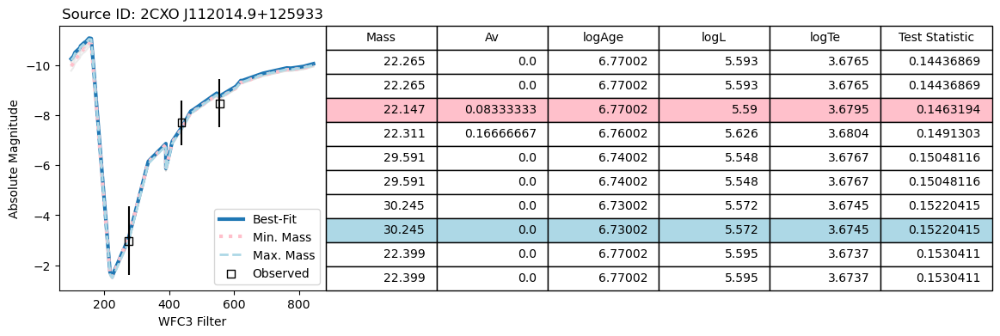

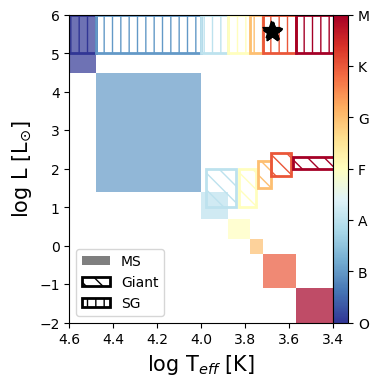

##################################################################
##################  CSC ID 2CXO J112015.0+125936   ##########################
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112015.0+125936.
##################################################################
##################  CSC ID 2CXO J112015.0+125921   ##########################
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112015.0+125921.
##################################################################
##################  CSC ID 2CXO J112015.2+125921   ##########################
Finding best-fit model(s)...
DONE


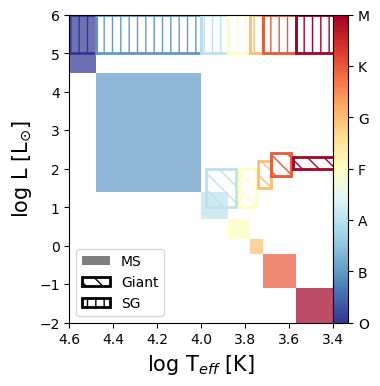

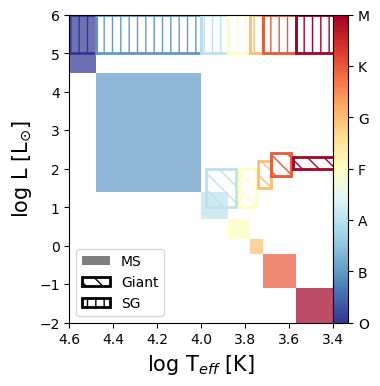

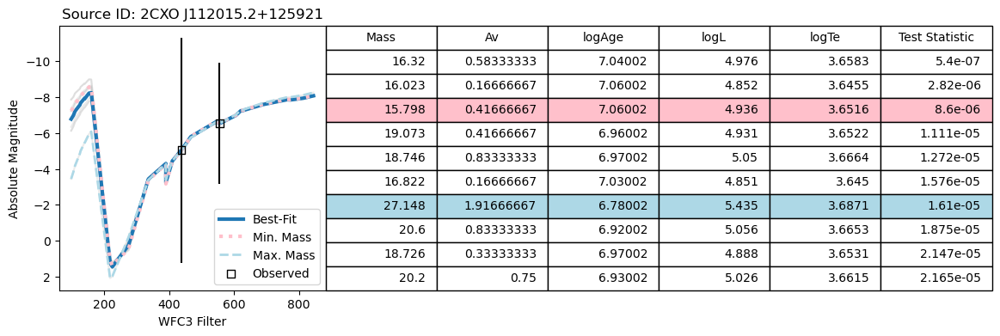

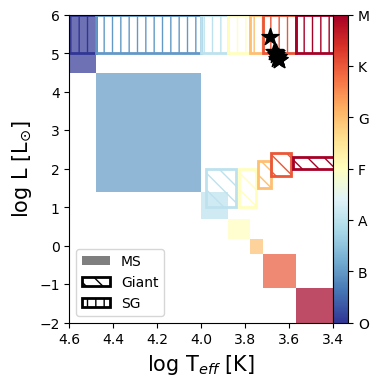

##################################################################
##################  CSC ID 2CXO J112014.7+125937   ##########################
Finding best-fit model(s)...
DONE


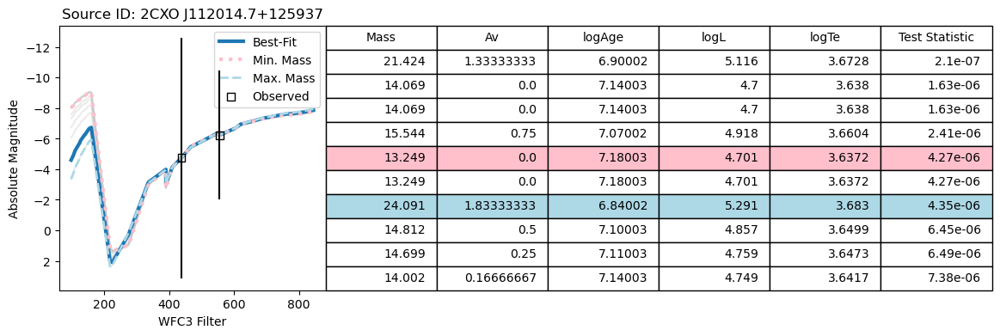

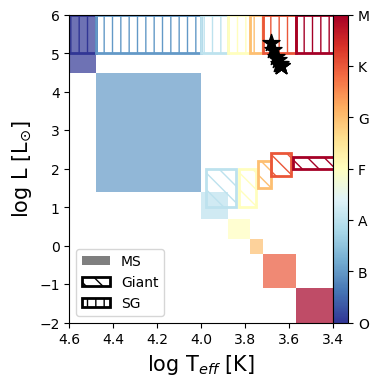

##################################################################
##################  CSC ID 2CXO J112015.0+125938   ##########################
Finding best-fit model(s)...
DONE


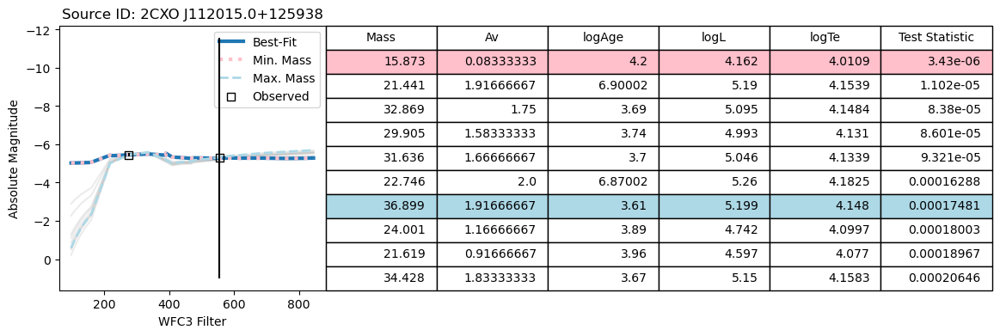

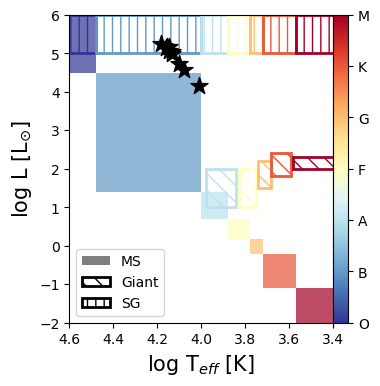

##################################################################
##################  CSC ID 2CXO J112015.3+125944   ##########################
Finding best-fit model(s)...
DONE
No best-fit model available for Source ID 2CXO J112015.3+125944.
##################################################################
##################  CSC ID 2CXO J112013.5+125944   ##########################
Finding best-fit model(s)...
DONE


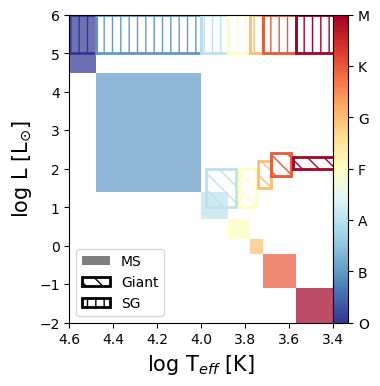

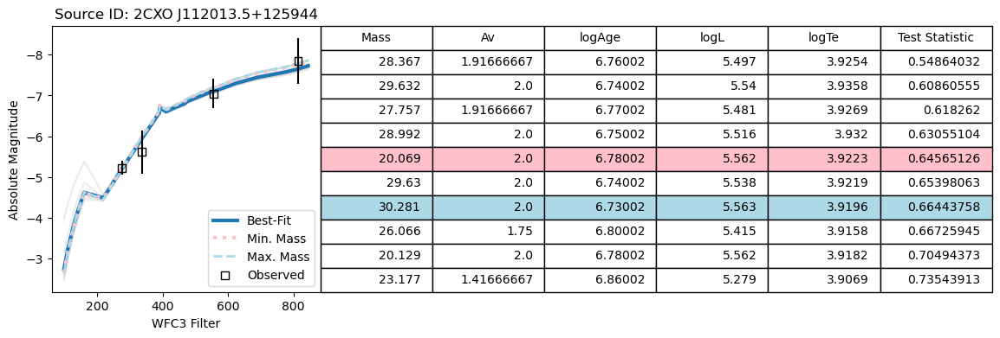

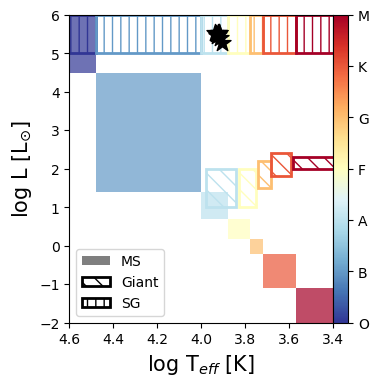

##################################################################
##################  CSC ID 2CXO J112012.8+125947   ##########################
Finding best-fit model(s)...
DONE


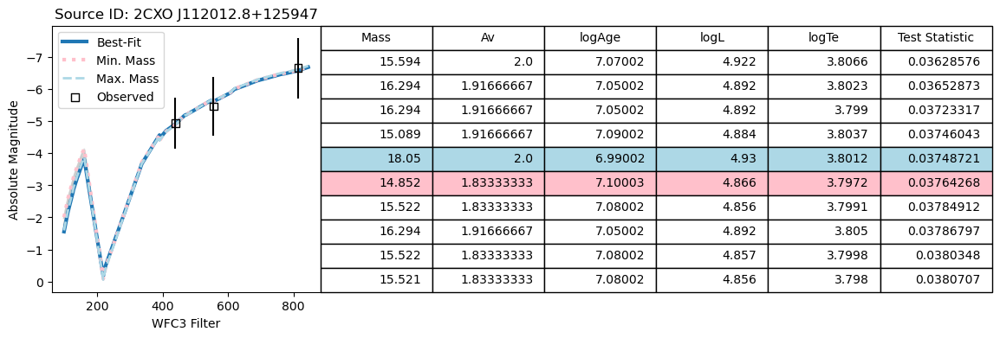

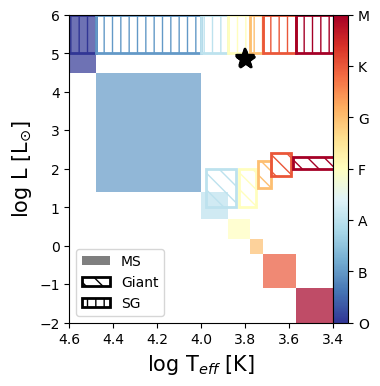

##################################################################
##################  CSC ID 2CXO J112016.8+125959   ##########################
Finding best-fit model(s)...
DONE


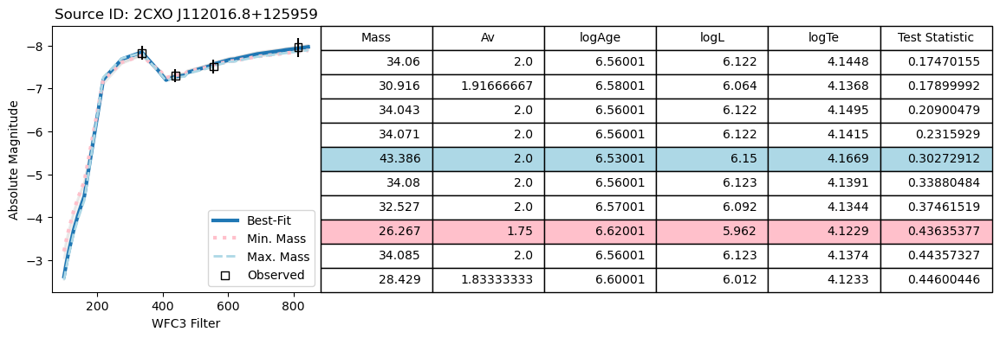

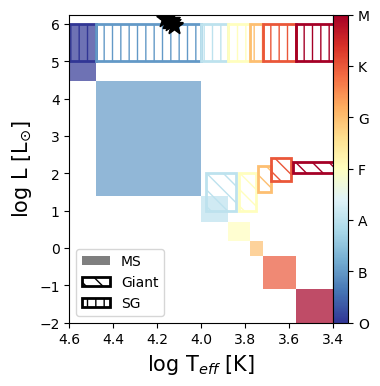

##################################################################
##################  CSC ID 2CXO J112018.8+125924   ##########################
Finding best-fit model(s)...
DONE


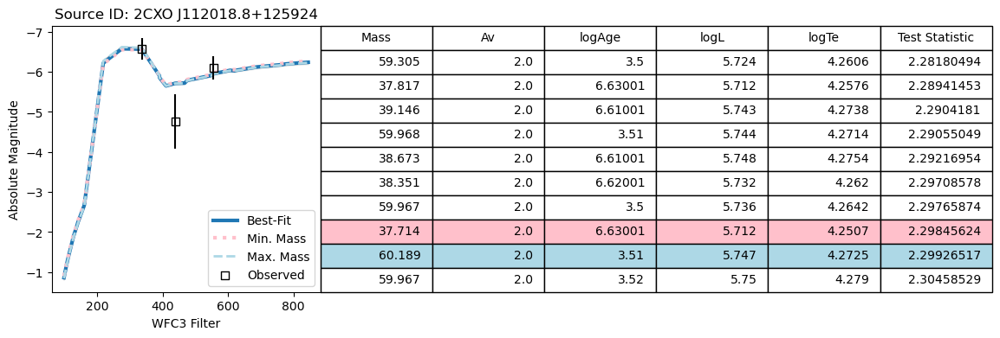

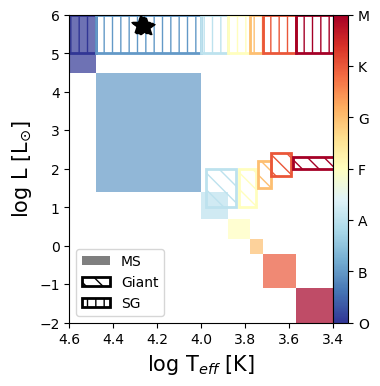

##################################################################
##################  CSC ID 2CXO J112013.7+130025   ##########################
Finding best-fit model(s)...
DONE


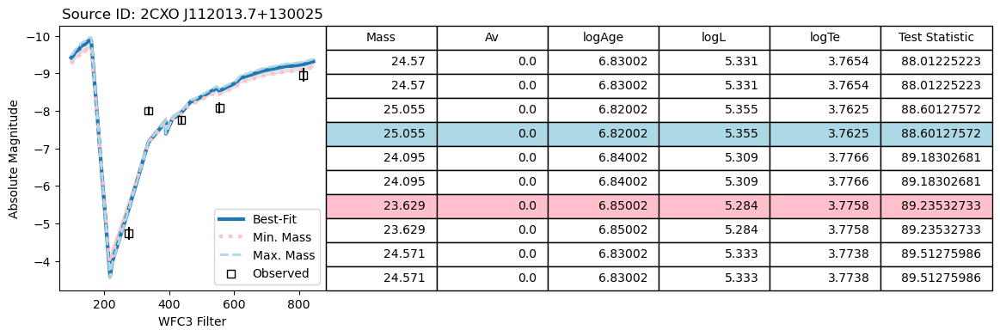

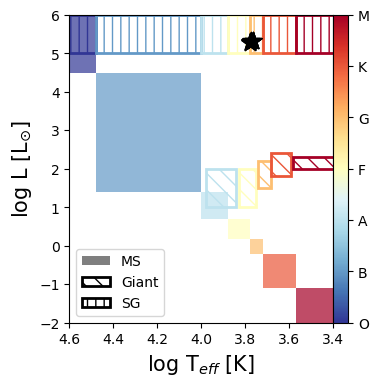

##################################################################
##################  CSC ID 2CXO J112016.7+125830   ##########################
Finding best-fit model(s)...
DONE


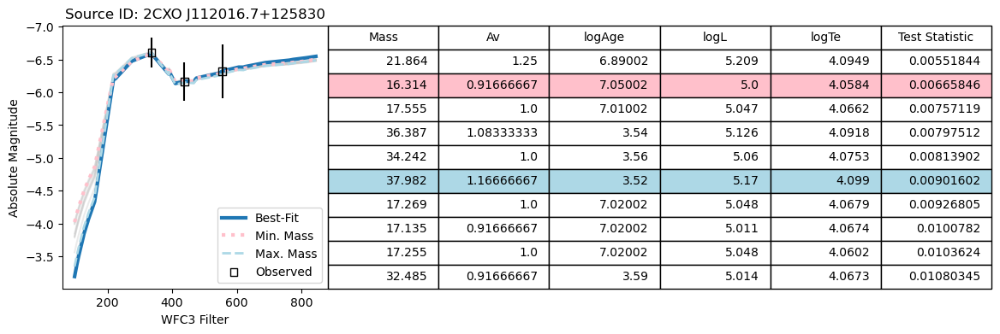

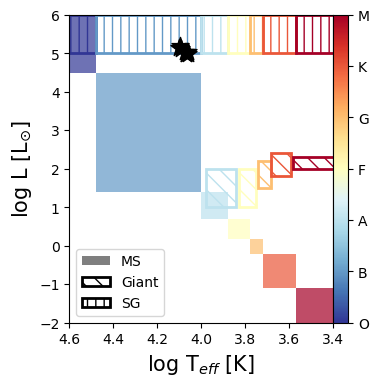

##################################################################
##################  CSC ID 2CXO J112019.5+125958   ##########################
Finding best-fit model(s)...
DONE


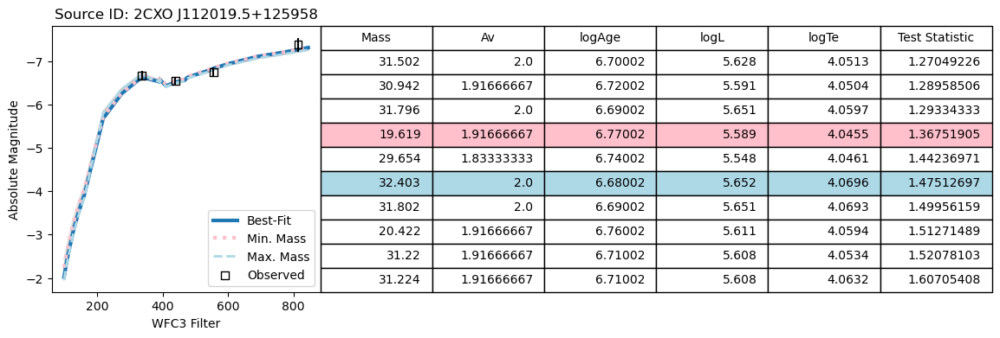

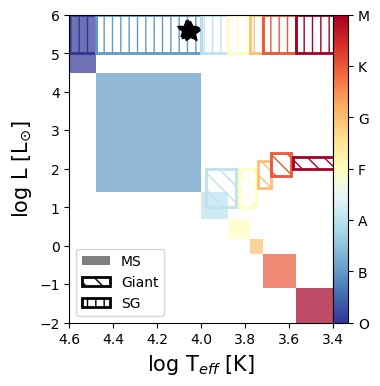

##################################################################
##################  CSC ID 2CXO J112019.0+130027   ##########################
Finding best-fit model(s)...
DONE


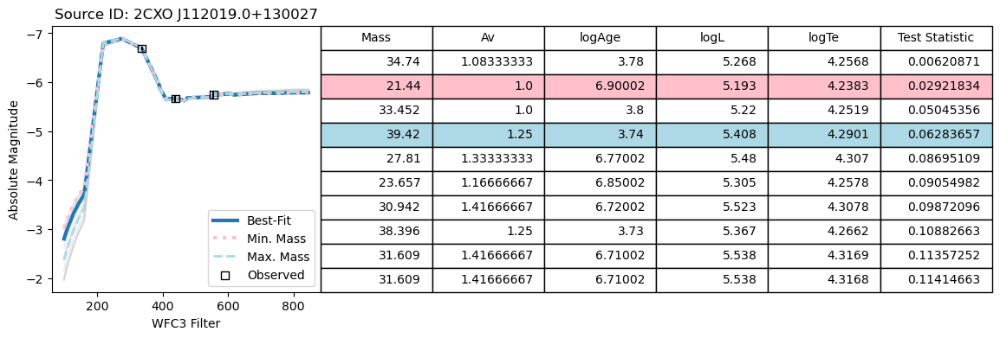

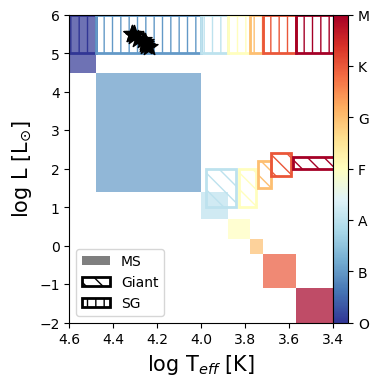

##################################################################
##################  CSC ID 2CXO J112011.8+125811   ##########################
Finding best-fit model(s)...
DONE


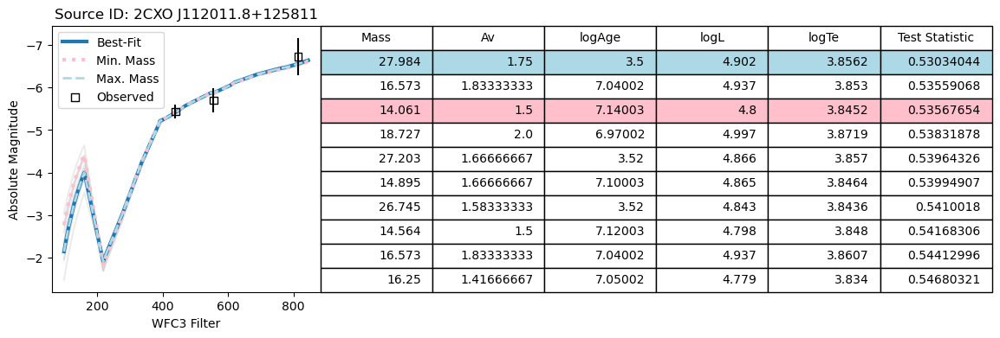

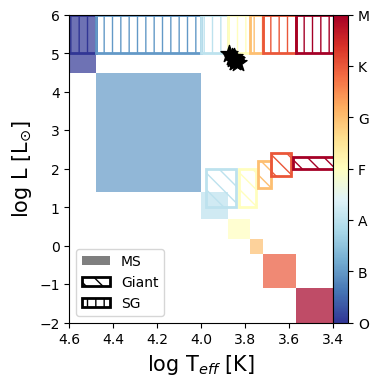

##################################################################
##################  CSC ID 2CXO J112014.9+130113   ##########################
Finding best-fit model(s)...
DONE


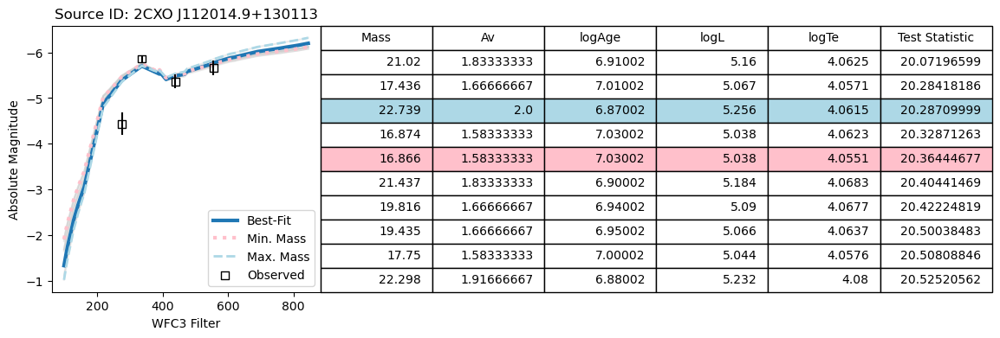

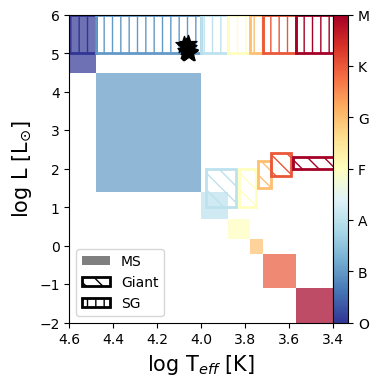

##################################################################
##################  CSC ID 2CXO J112013.0+125736   ##########################
Finding best-fit model(s)...
DONE


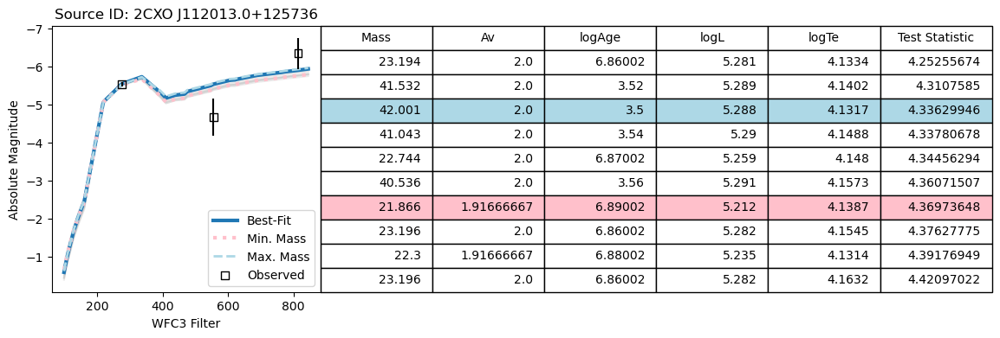

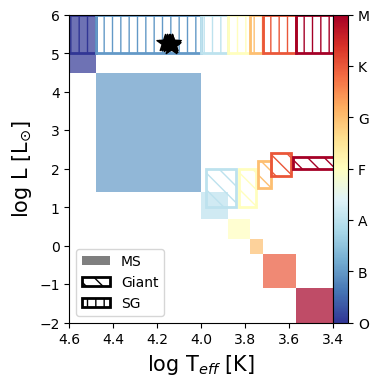

##################################################################
##################  CSC ID 2CXO J112015.9+125727   ##########################
Finding best-fit model(s)...
DONE


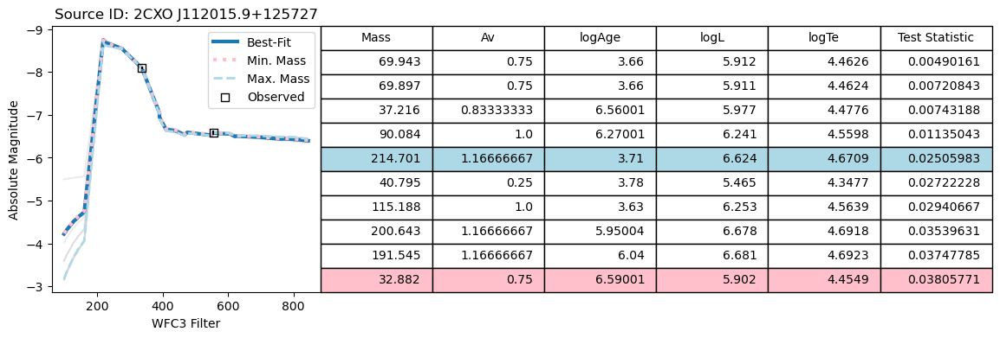

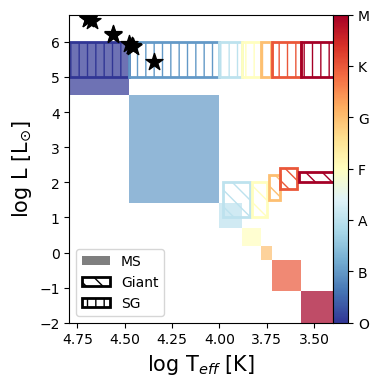

In [ ]:
for id in hmxbs['CSC ID'].tolist():
    try:
        print("##################################################################")
        print(f"##################  CSC ID {id}   ##########################")
        FitSED(df=Find(HMXBPhots, [f'CSC ID = {id}']),
               instrument='wfc3', idheader='CSC ID',
               min_models=10, plotSED=True, showHR=True, model_ext=True)
        plt.show()
        # print("##################################################################")
    except:
        # print("##################################################################")
        pass

# fit_hmxb = FitSED(df=HMXBPhots, instrument='wfc3', idheader='CSC ID',
#                   min_models=10, plotSED=True, showHR=False, model_ext=True)

## Investigatin Dust Extinction in M66

In this section, I am creating a regions file with the Av as the label for the regions. 

Note: The dataframe that I have created here does not contain 2 hmxb sources as they do not have the best fit models

In [ ]:
absorption = pd.DataFrame()
for id in hmxbs['CSC ID'].tolist():
    Temp = Find(fit_hmxb, f'CSC ID = {id}')
    if Temp.empty == False:
        Temp = Find(Temp, f"Test Statistic = {min(Temp['Test Statistic'])}")
        absorption = pd.concat([absorption, Temp])
    else:
        # Keep the code running if there are no models for a source
        pass

# # Manually delete the rows that are not required
# absorption = absorption.loc[:, ~absorption.columns.str.contains('^Unnamed')]
# absorption = absorption.reset_index(drop=True)
# absorption = absorption.drop(absorption.index[2:13], axis=0)
# absorption = absorption.reset_index(drop=True)
# absorption = absorption.drop(absorption.index[9], axis=0) 
# display(absorption)
absorption = absorption.reset_index(drop=True)

cols = ['Mass', 'Av', 'logL', 'logAge', 'logTe', 'Test Statistic', 'CSC ID']
absorption = absorption[cols]
absorption.to_csv(chandra_hst_dir+"M66_dust_extinction_hmxbs.frame", index=False)
display(absorption)

,Mass,Av,logL,logAge,logTe,Test Statistic,CSC ID
0,22.265,0.000000,5.593,6.77002,3.6765,1.443687e-01,2CXO J112014.9+125933
1,22.265,0.000000,5.593,6.77002,3.6765,1.443687e-01,2CXO J112014.9+125933
2,16.320,0.583333,4.976,7.04002,3.6583,5.386878e-07,2CXO J112015.2+125921
3,21.424,1.333333,5.116,6.90002,3.6728,2.096291e-07,2CXO J112014.7+125937
4,15.873,0.083333,4.162,4.20000,4.0109,3.428541e-06,2CXO J112015.0+125938
5,28.367,1.916667,5.497,6.76002,3.9254,5.486403e-01,2CXO J112013.5+125944
6,15.594,2.000000,4.922,7.07002,3.8066,3.628576e-02,2CXO J112012.8+125947
7,34.060,2.000000,6.122,6.56001,4.1448,1.747015e-01,2CXO J112016.8+125959
8,59.305,2.000000,5.724,3.50000,4.2606,2.281805e+00,2CXO J112018.8+125924
9,24.570,0.000000,5.331,6.83002,3.7654,8.801225e+01,2CXO J112013.7+130025


In [ ]:
dust_ext = pd.read_csv(chandra_hst_dir+'M66_dust_extinction_hmxbs.frame')
dust_ext['X'] = ''
dust_ext['Y'] = ''
dust_ext['RA'] = ''
dust_ext['Dec'] = ''
for index1, row1 in HMXBPhots.iterrows():
    for index2, row2 in dust_ext.iterrows():
        if HMXBPhots['CSC ID'][index1] == dust_ext['CSC ID'][index2]:
            dust_ext['X'][index2] = HMXBPhots['X'][index1]
            dust_ext['Y'][index2] = HMXBPhots['Y'][index1]
            dust_ext['RA'][index2] = HMXBPhots['RA'][index1]
            dust_ext['Dec'][index2] = HMXBPhots['Dec'][index1]

dust_ext.to_csv('M66_dust_extinction_hmxbs.frame') 
dust_ext 

,Mass,Av,logL,logAge,logTe,Test Statistic,CSC ID,X,Y,RA,Dec
0,22.265,0.000000,5.593,6.77002,3.6765,1.443687e-01,2CXO J112014.9+125933,3743.843919,5833.507868,170.062292,12.992626
1,22.265,0.000000,5.593,6.77002,3.6765,1.443687e-01,2CXO J112014.9+125933,3743.843919,5833.507868,170.062292,12.992626
2,16.320,0.583333,4.976,7.04002,3.6583,5.386878e-07,2CXO J112015.2+125921,3652.013236,5540.798551,170.063329,12.989405
3,21.424,1.333333,5.116,6.90002,3.6728,2.096291e-07,2CXO J112014.7+125937,3834.343555,5918.287693,170.06127,12.993559
4,15.873,0.083333,4.162,4.20000,4.0109,3.428541e-06,2CXO J112015.0+125938,3694.780748,5952.563551,170.062846,12.993936
5,28.367,1.916667,5.497,6.76002,3.9254,5.486403e-01,2CXO J112013.5+125944,4265.222965,6110.760032,170.056403,12.995677
6,15.594,2.000000,4.922,7.07002,3.8066,3.628576e-02,2CXO J112012.8+125947,4518.077121,6197.146311,170.053547,12.996628
7,34.060,2.000000,6.122,6.56001,4.1448,1.747015e-01,2CXO J112016.8+125959,3042.724778,6490.637342,170.070211,12.999858
8,59.305,2.000000,5.724,3.50000,4.2606,2.281805e+00,2CXO J112018.8+125924,2312.165203,5616.540985,170.078462,12.990238
9,24.570,0.000000,5.331,6.83002,3.7654,8.801225e+01,2CXO J112013.7+130025,4177.240381,7137.975463,170.057397,13.006982


In [ ]:
WriteReg(sources=dust_ext, outfile=chandra_hst_dir+'M66_dust_extinction_hmxbs.reg',
         coordsys='fk5', coordheads=['RA', 'Dec'], idheader='Av', color='#FE6100',
         radius=0.09, radunit='arcsec', fontsize=20)

dust_ext['Av'] = dust_ext['Av'].round(2)
# Regions with the Av values rounded to 2 decimals
WriteReg(sources=dust_ext, outfile=chandra_hst_dir+'M66_dust_extinction_hmxbs_rounded.reg',
         coordsys='fk5', coordheads=['RA', 'Dec'], idheader='Av', color='#FE6100',
         radius=0.09, radunit='arcsec', fontsize=20)

Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_dust_extinction_hmxbs.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_dust_extinction_hmxbs.reg saved!
Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_dust_extinction_hmxbs_rounded.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-HST/M66_dust_extinction_hmxbs_rounded.reg saved!


## Redoing SED fitting and choosing the best stars depending upon their SED fitting

In [ ]:
M66_notes = remove_unnamed(pd.read_csv(chandra_hst_dir+"M66_XRB_notes.txt"))
daoclean = remove_unnamed(pd.read_csv(chandra_hst_dir+'M66_daoclean_matches.frame'))
# Remove the unwanted source
daoclean = daoclean.query('`CSC ID` != "2CXO J112015.2+125932X"').reset_index(drop=True)

In [ ]:
dist = 11.32e6 # units pc from https://iopscience.iop.org/article/10.3847/1538-4357/ace162/meta#apjace162s2
dmod = 5 * np.log10(dist) - 5
cd(hstdir)
photometry = GetDaoPhots(daoclean, 
                        photfiles=['photometry_M66_f555w_wfc3_sources.ecsv',
                                    'photometry_M66_f438w_wfc3_sources.ecsv',
                                    'photometry_M66_f814w_wfc3_sources.ecsv',
                                    'photometry_M66_f275w_wfc3_sources.ecsv',
                                    'photometry_M66_f336w_wfc3_sources.ecsv'],
                        idheads=['F555W ID', 'F438W ID', 'F814W ID', 'F275W ID', 'F336W ID'],
                        filters=['F555W', 'F438W', 'F814W', 'F275W', 'F336W'],
                        magheader='aperture_mag_corr', dmod=dmod)
photometry['Star ID'] = daoclean['StarID']
photometry['ID'] = photometry['CSC ID'] + '-' + photometry['Star ID'].astype(str)
photometry
display(photometry) 

Searching photometry_M66_f555w_wfc3_sources.ecsv
Searching photometry_M66_f438w_wfc3_sources.ecsv
Searching photometry_M66_f814w_wfc3_sources.ecsv
Searching photometry_M66_f275w_wfc3_sources.ecsv
Searching photometry_M66_f336w_wfc3_sources.ecsv


,X,Y,F555W ID,F275W ID,F336W ID,F438W ID,F814W ID,RA,Dec,CSC ID,...,F438W,F438W Err,F814W,F814W Err,F275W,F275W Err,F336W,F336W Err,Star ID,ID
0,3728.392237,5731.691614,18393,NaN,95500.0,34799.0,17413.0,170.062466,12.991505,2CXO J112014.9+125929,...,-11.454558,-0.038940,-13.658174,-0.046098,NaN,NaN,-10.801667,-0.046133,1,2CXO J112014.9+125929-1
1,3730.382900,5734.693669,18431,NaN,NaN,NaN,17413.0,170.062444,12.991539,2CXO J112014.9+125929,...,NaN,NaN,-13.658174,-0.046098,NaN,NaN,NaN,NaN,2,2CXO J112014.9+125929-2
2,3690.922608,5713.903685,18254,NaN,95118.0,34583.0,NaN,170.062890,12.991310,2CXO J112015.0+125928,...,-9.467780,-0.221970,NaN,NaN,NaN,NaN,-8.591881,-0.309419,1,2CXO J112015.0+125928-1
3,3693.339708,5721.089782,18303,NaN,NaN,NaN,NaN,170.062862,12.991389,2CXO J112015.0+125928,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2CXO J112015.0+125928-2
4,3746.714500,5828.653600,19206,NaN,NaN,35989.0,NaN,170.062260,12.992573,2CXO J112014.9+125933,...,-7.846164,-0.811469,NaN,NaN,NaN,NaN,NaN,NaN,1,2CXO J112014.9+125933-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,3768.771693,8363.063045,34886,203812.0,157738.0,59483.0,NaN,170.062011,13.020465,2CXO J112014.9+130113,...,-5.363488,-0.148391,NaN,NaN,-4.437602,-0.252669,-5.861260,-0.073280,1,2CXO J112014.9+130113-1
92,4463.710840,2888.783967,1804,48203.0,NaN,NaN,1718.0,170.054162,12.960218,2CXO J112013.0+125736,...,NaN,NaN,-6.341185,-0.407560,-5.529296,-0.067507,NaN,NaN,1,2CXO J112013.0+125736-1
93,3375.849092,2661.999469,1476,NaN,25603.0,5443.0,1413.0,170.066447,12.957722,2CXO J112015.9+125727,...,-6.645948,-0.042113,-6.286217,-0.206731,NaN,NaN,-6.952726,-0.063543,1,2CXO J112015.9+125727-1
94,3375.849092,2661.999469,1476,NaN,25753.0,NaN,NaN,170.066447,12.957722,2CXO J112015.9+125727,...,NaN,NaN,NaN,NaN,NaN,NaN,-8.089256,-0.024830,2,2CXO J112015.9+125727-2


In [ ]:
photometry.to_csv(chandra_hst_dir+"M66_daoclean_matches_photometry.csv")

Performing SED fitting on all of these sources

Finding best-fit model(s)...
DONE


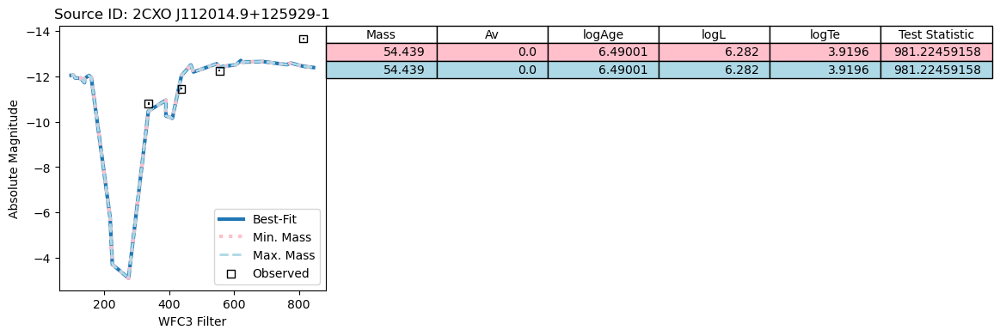

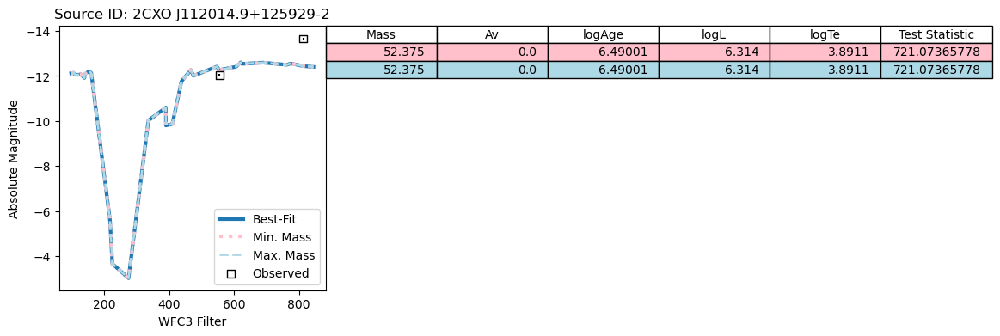

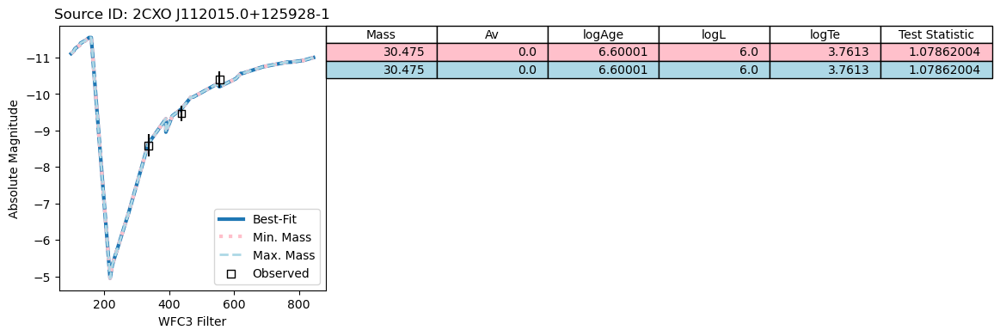

No best-fit model available for Source ID 2CXO J112015.0+125928-2.


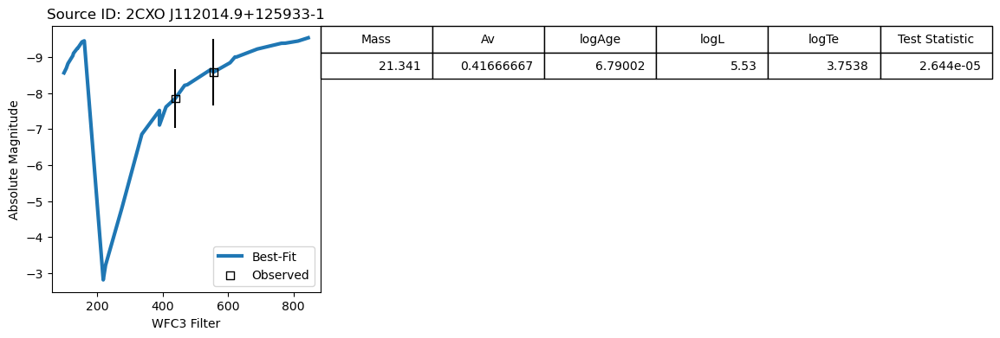

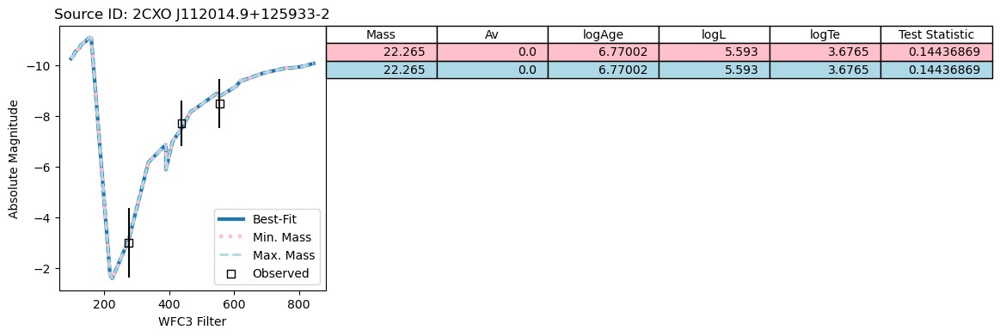

No best-fit model available for Source ID 2CXO J112015.0+125936-1.
No best-fit model available for Source ID 2CXO J112015.0+125921-1.


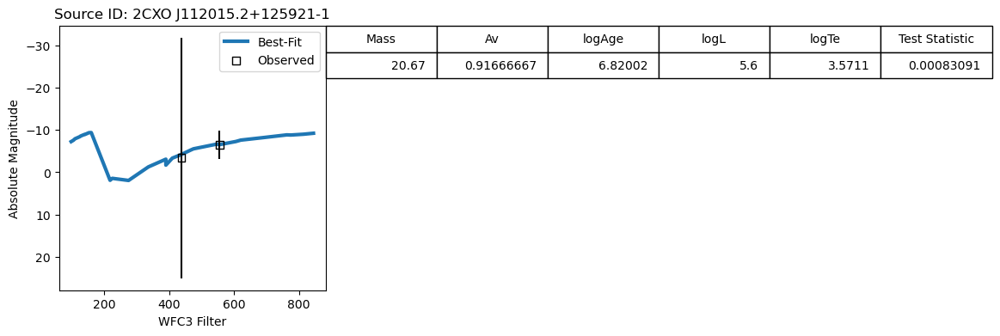

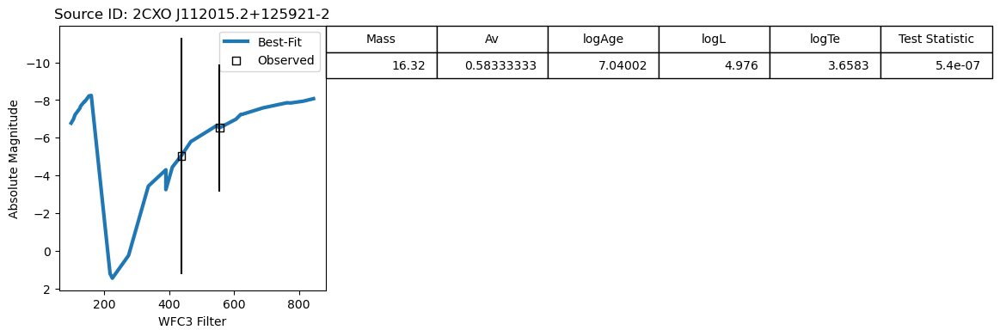

No best-fit model available for Source ID 2CXO J112015.2+125921-3.


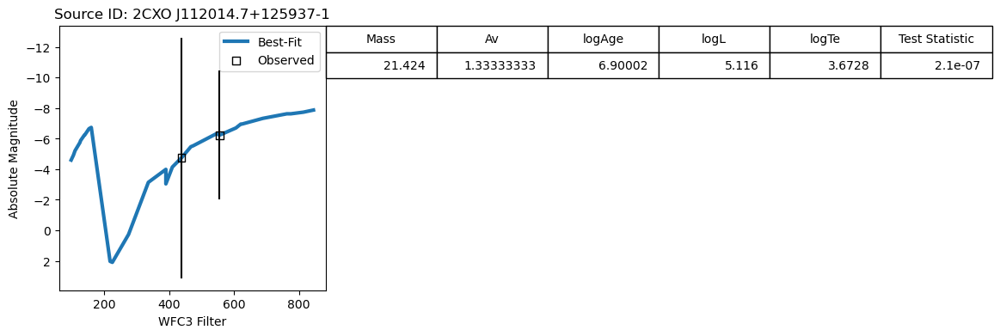

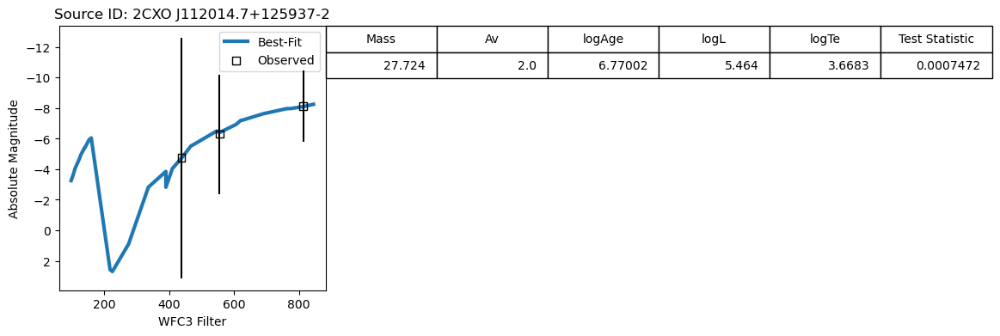

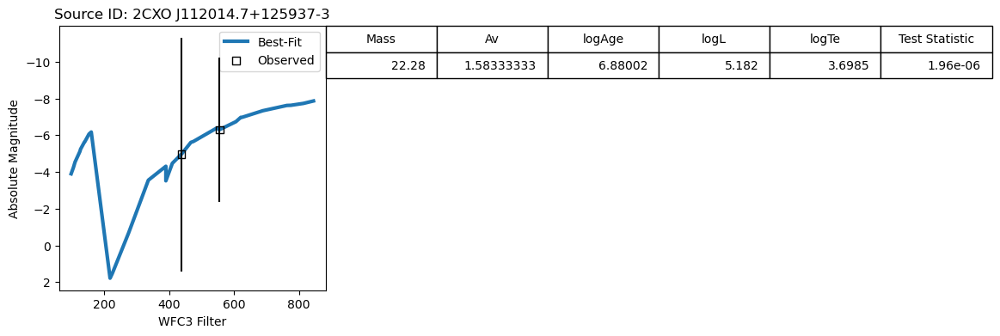

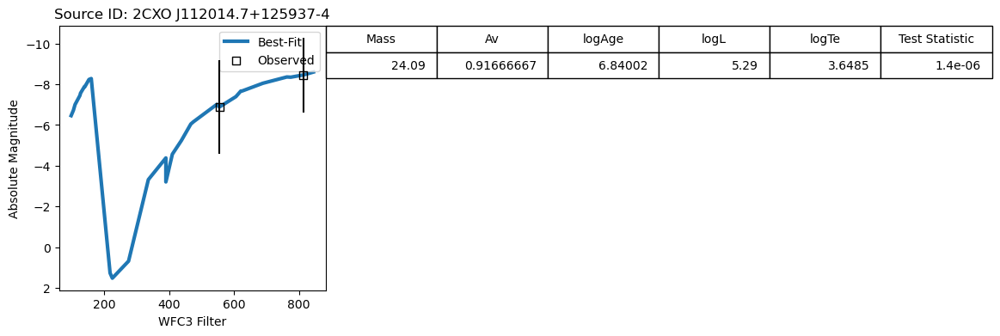

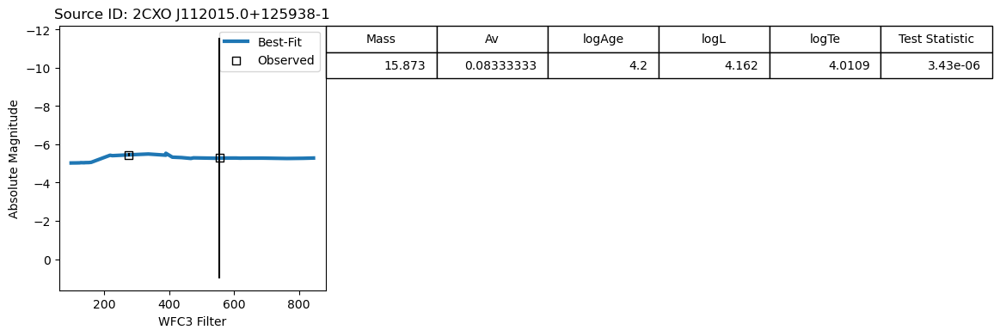

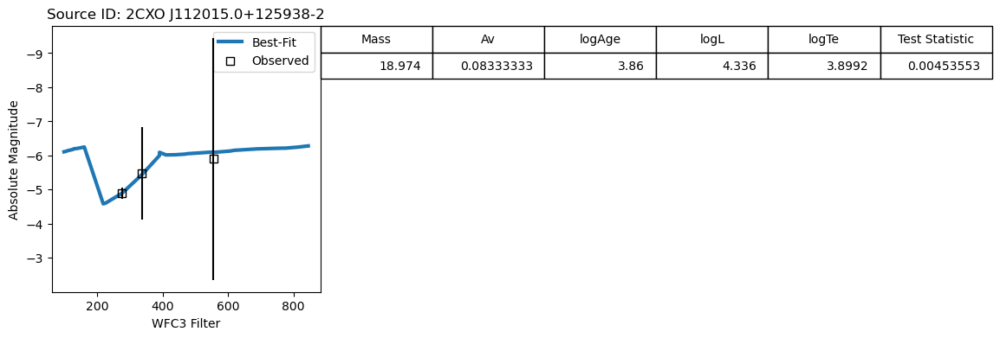

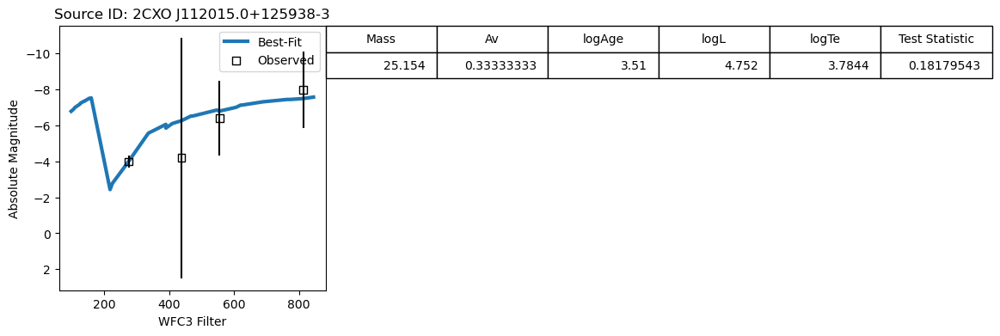

No best-fit model available for Source ID 2CXO J112015.3+125944-1.


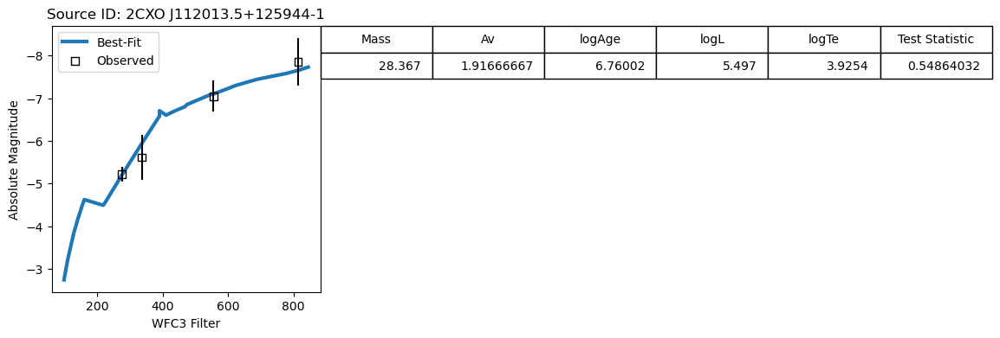

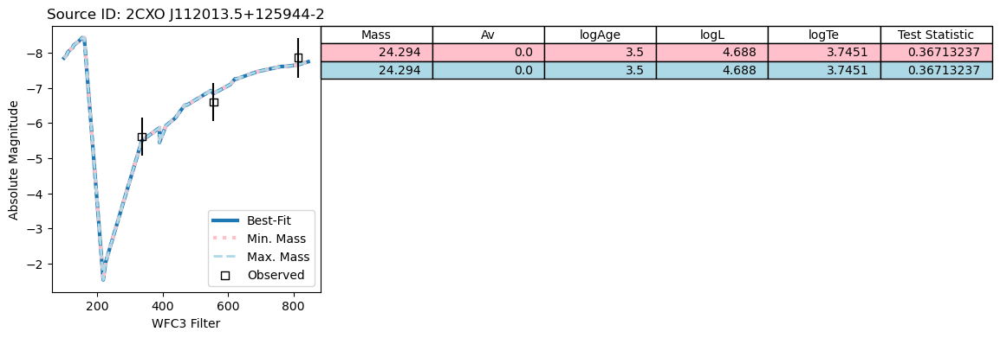

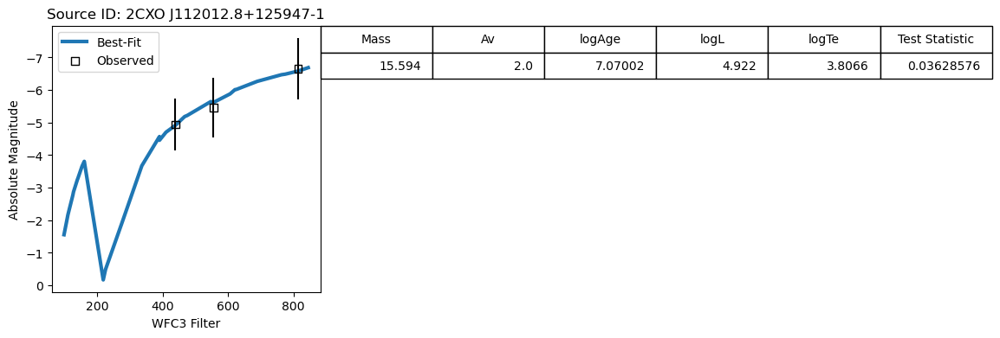

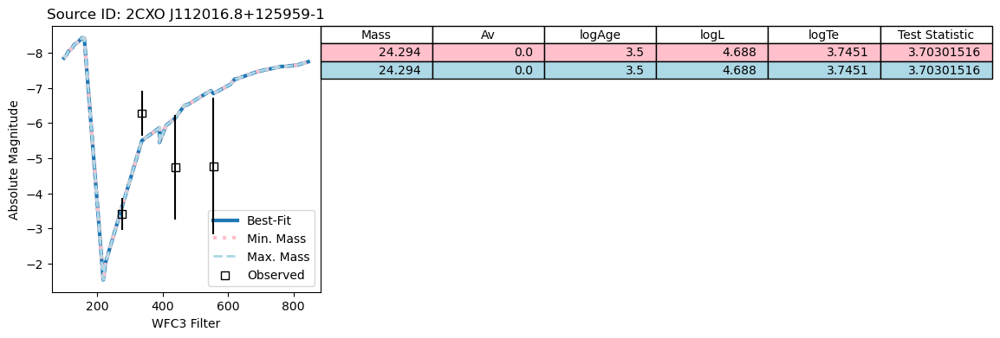

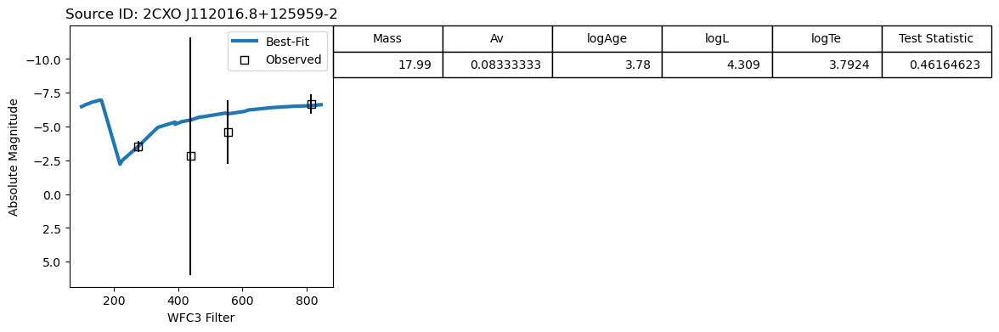

...

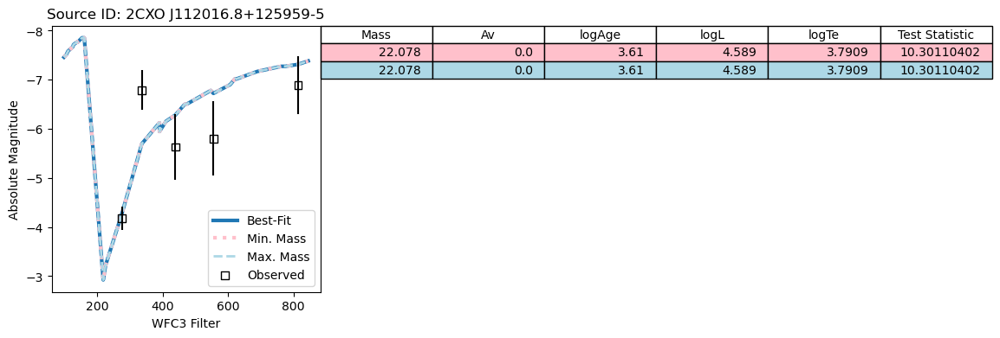

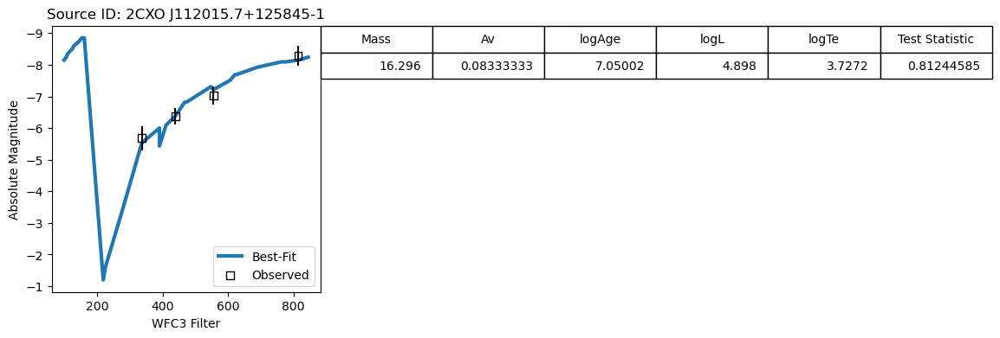

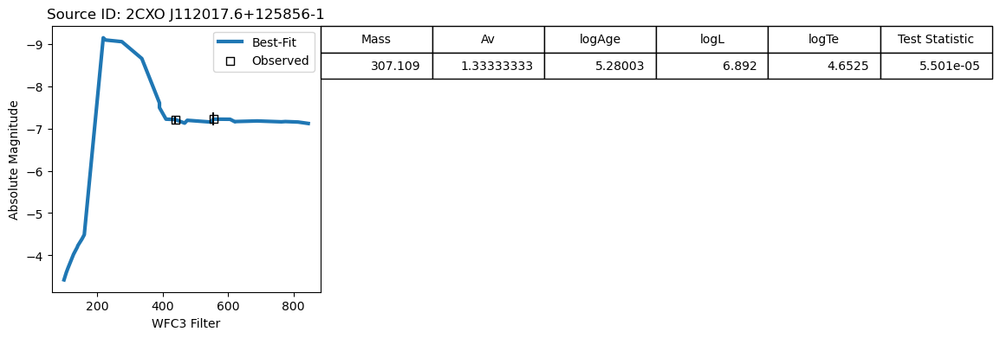

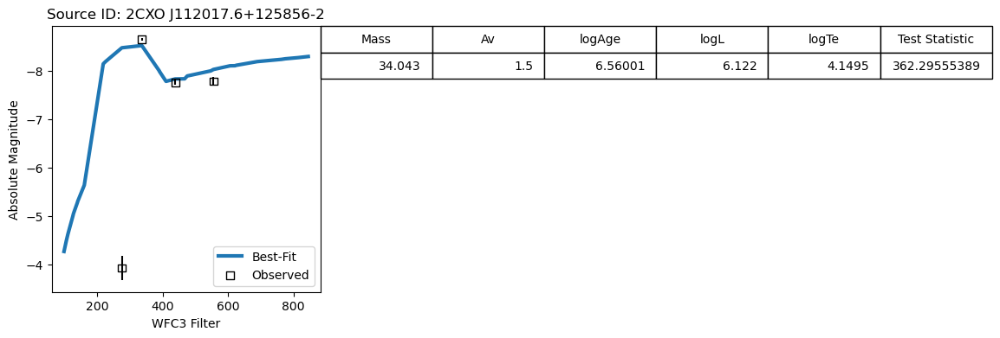

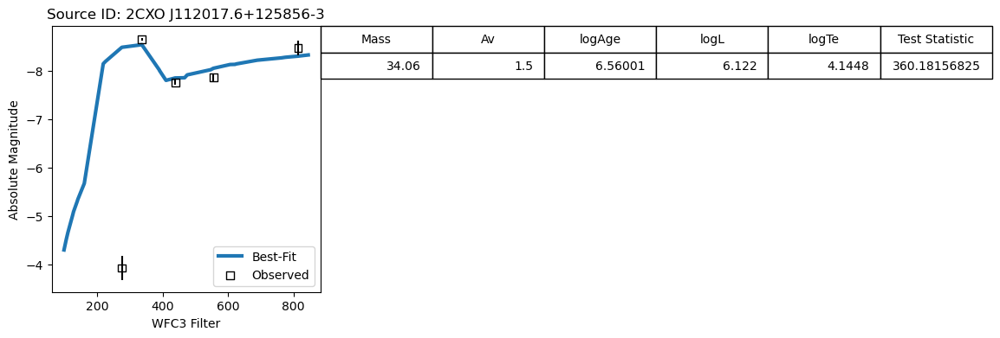

No best-fit model available for Source ID 2CXO J112017.6+125856-4.


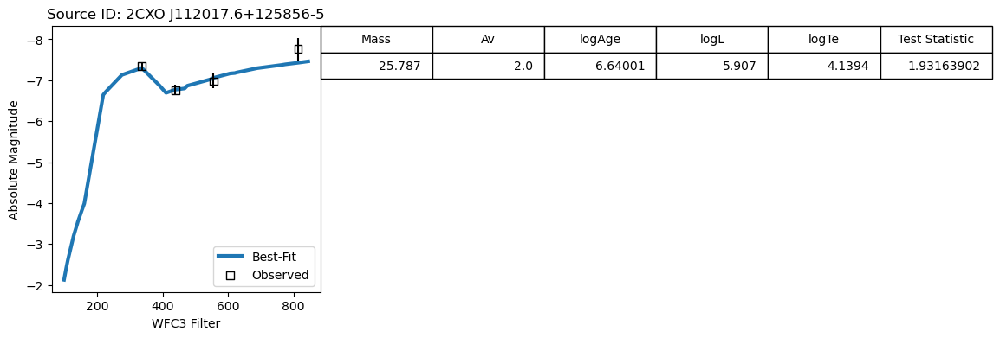

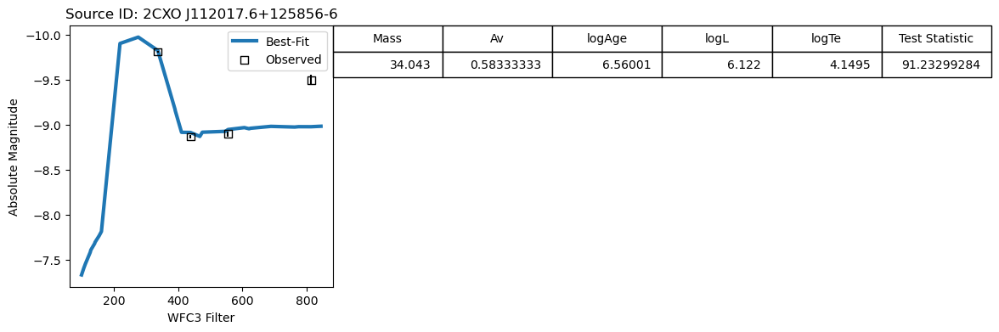

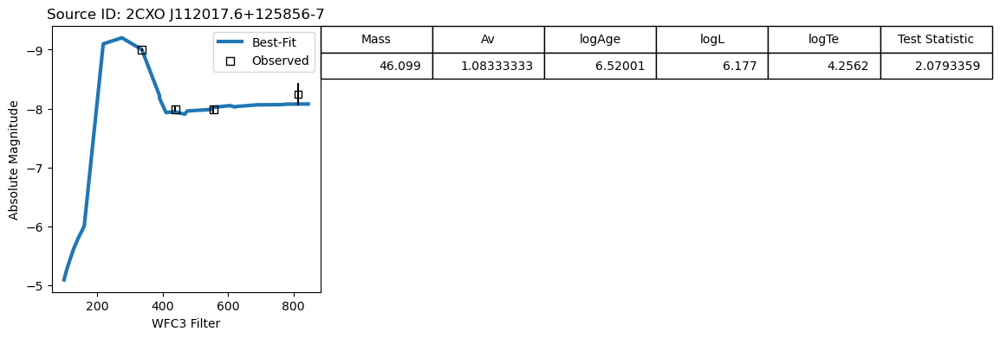

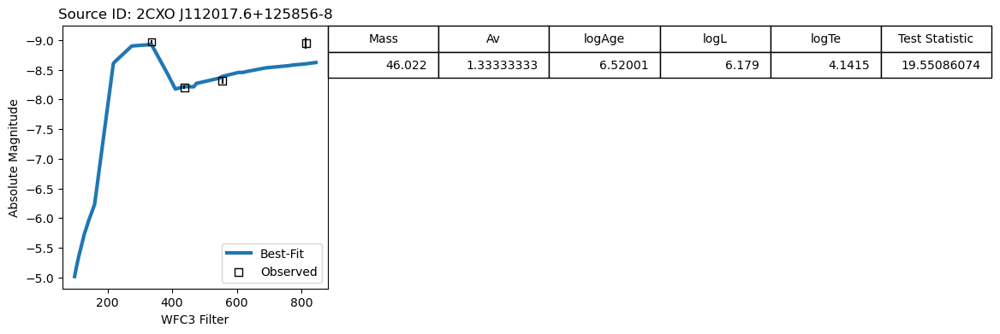

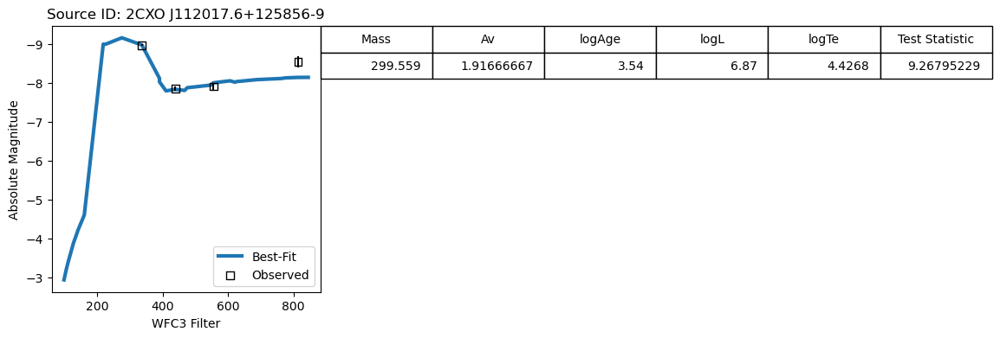

...

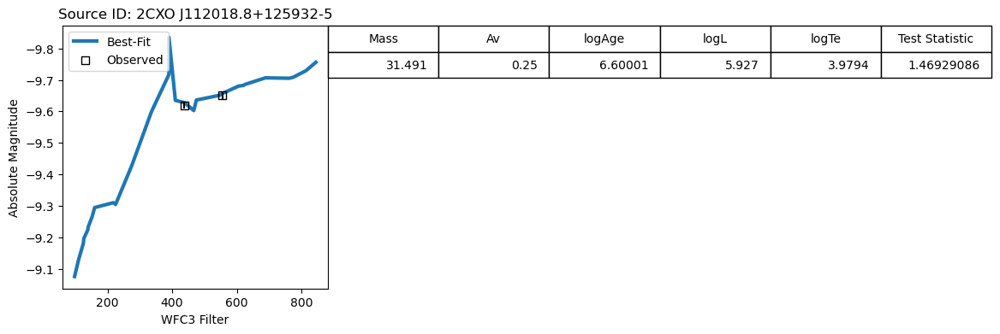

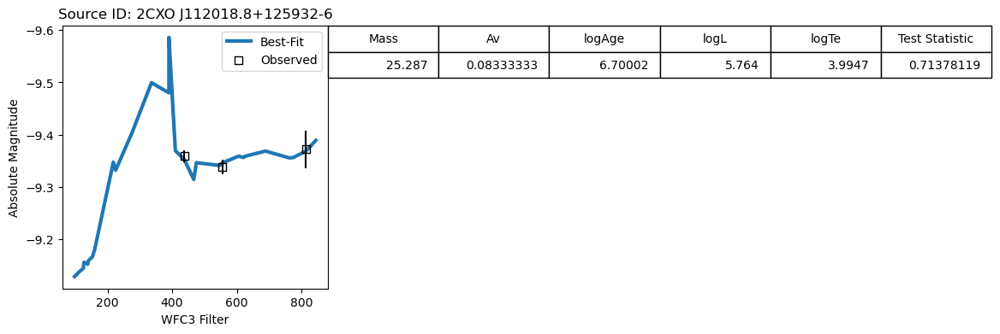

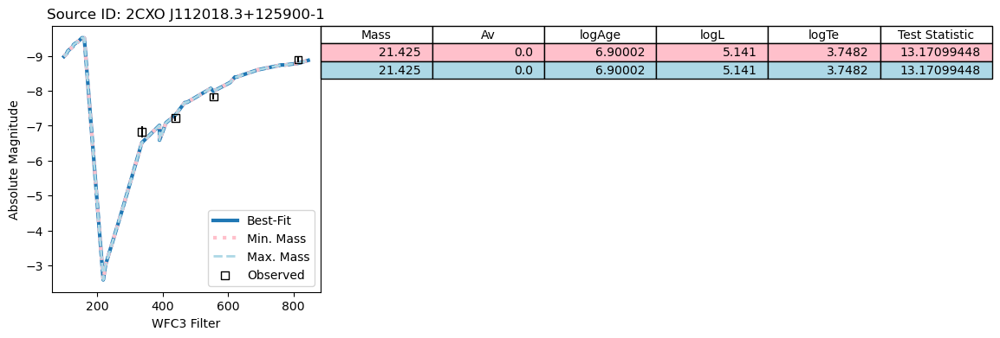

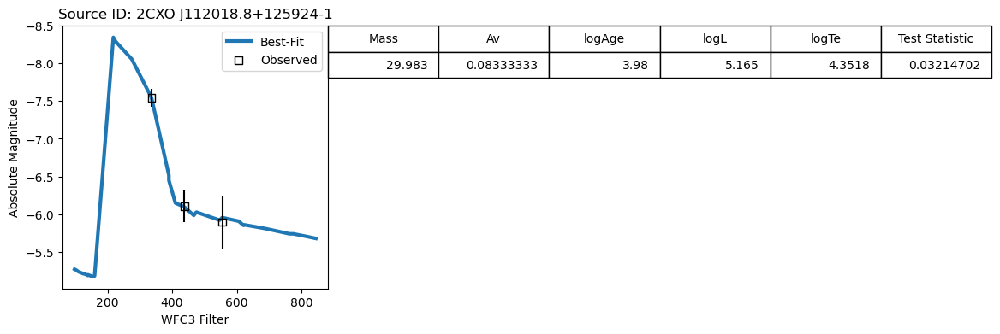

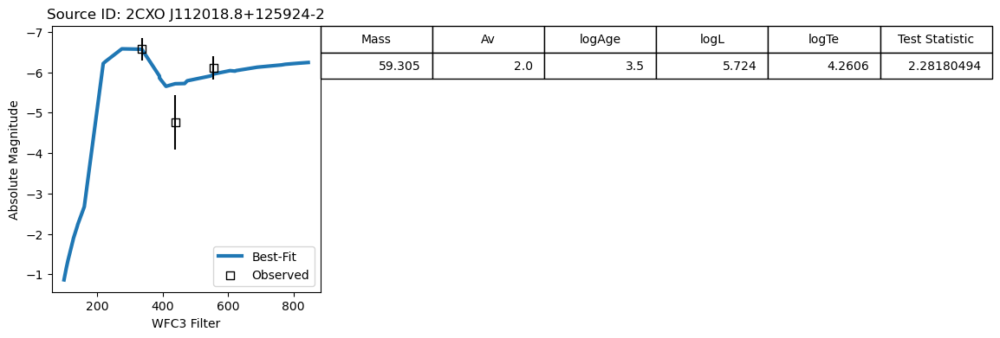

No best-fit model available for Source ID 2CXO J112013.7+130025-1.


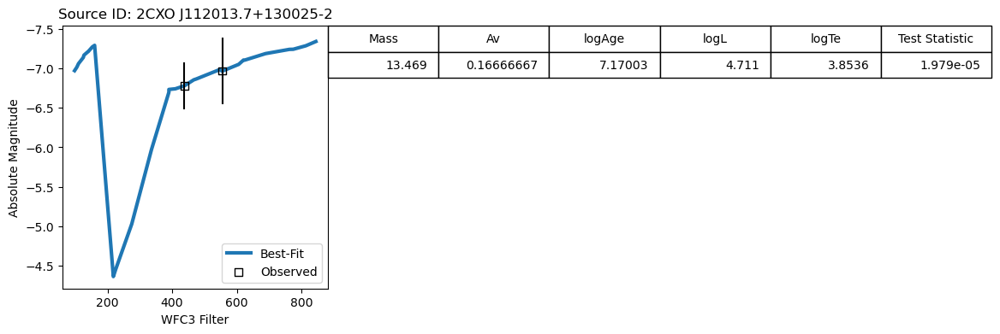

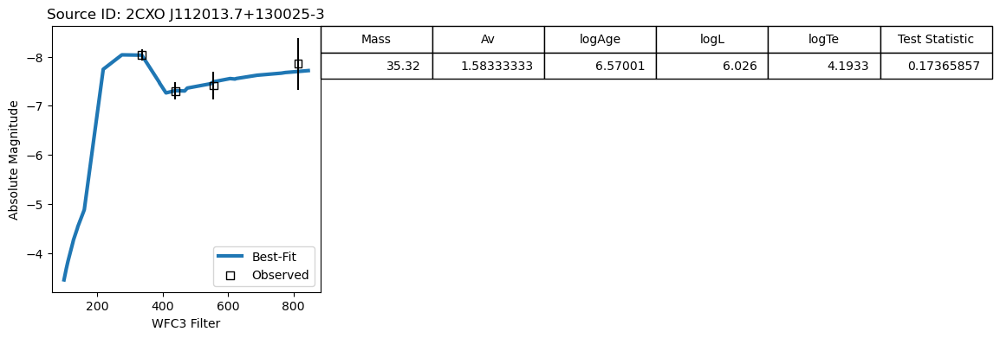

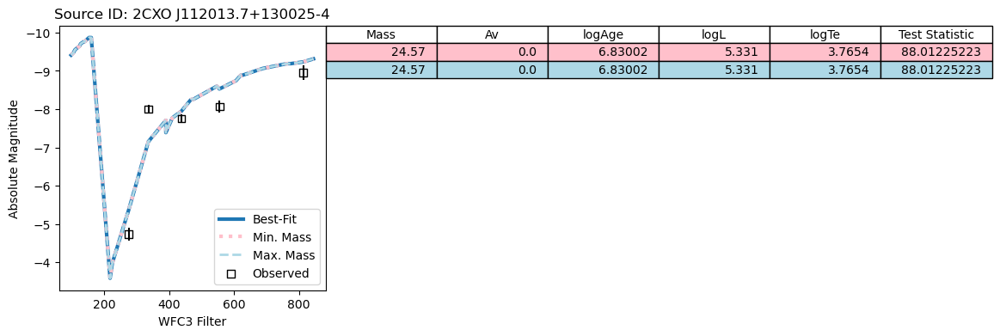

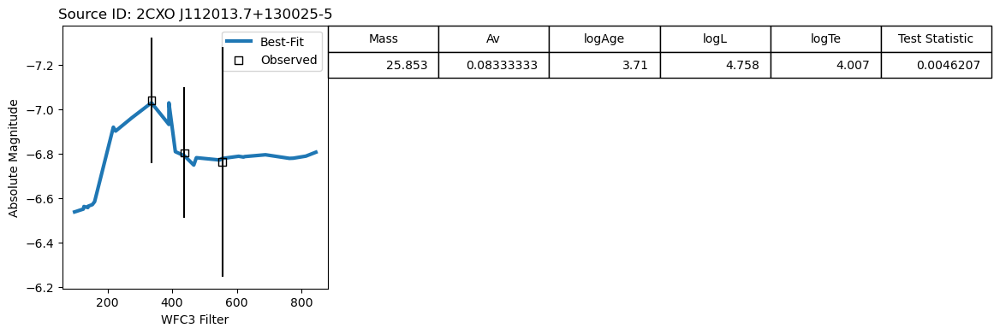

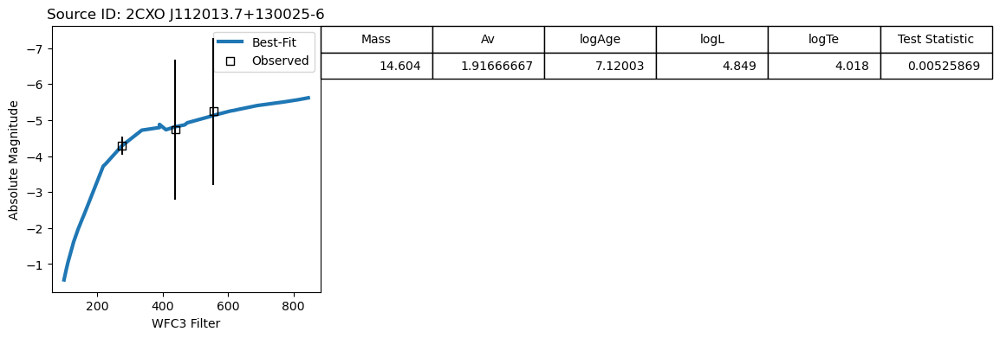

...

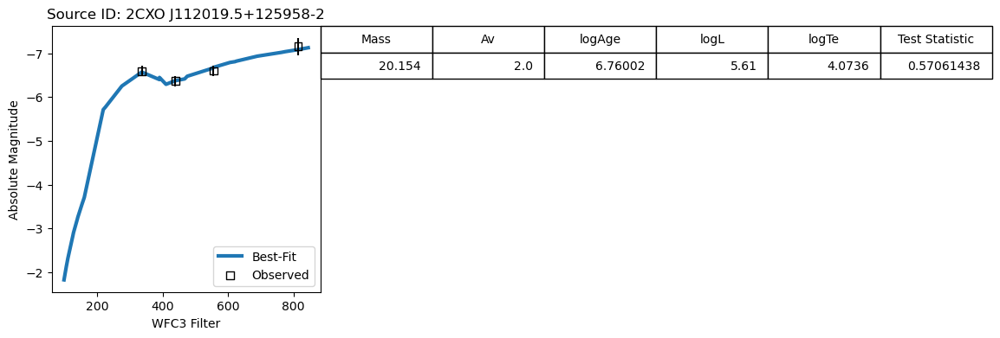

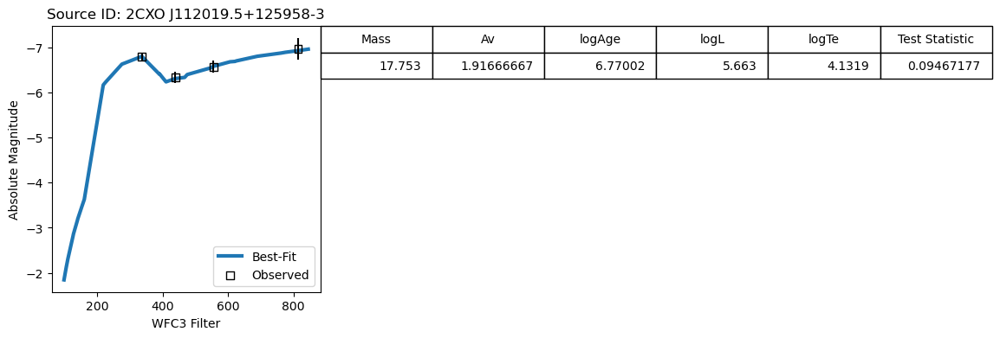

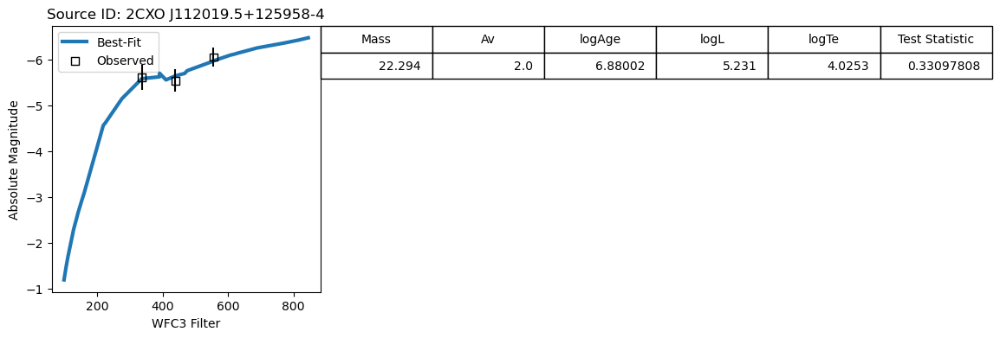

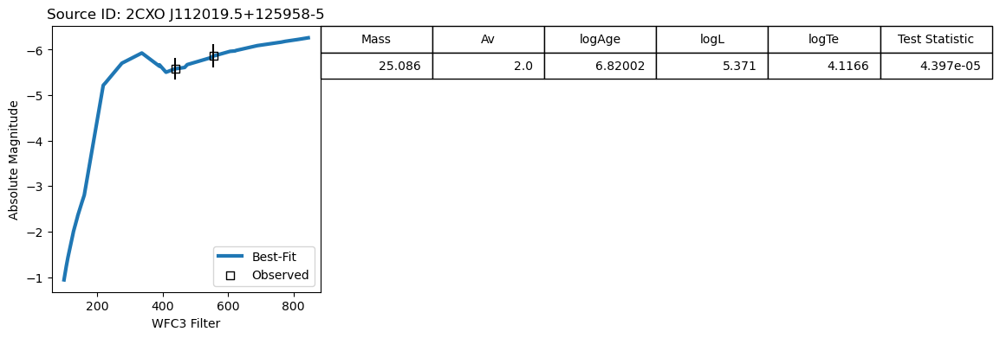

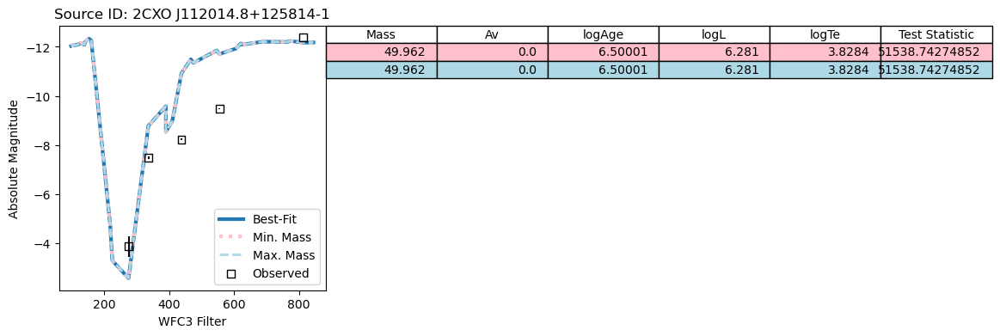

No best-fit model available for Source ID 2CXO J112019.0+130027-1.
No best-fit model available for Source ID 2CXO J112019.0+130027-2.


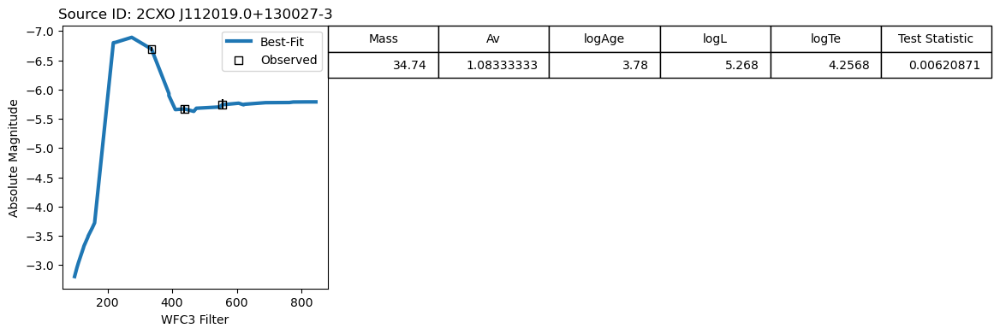

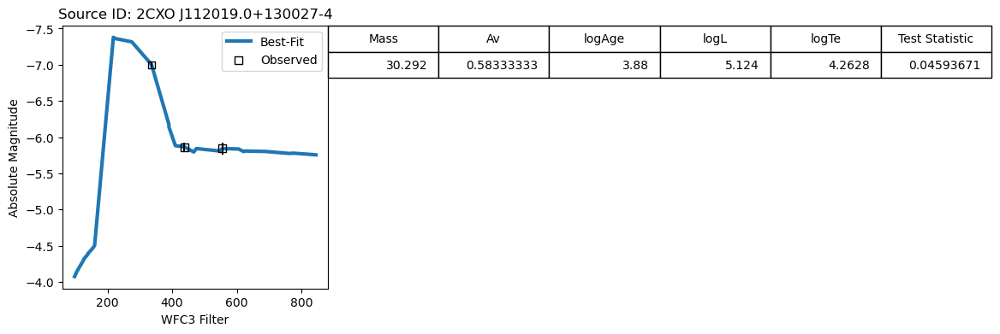

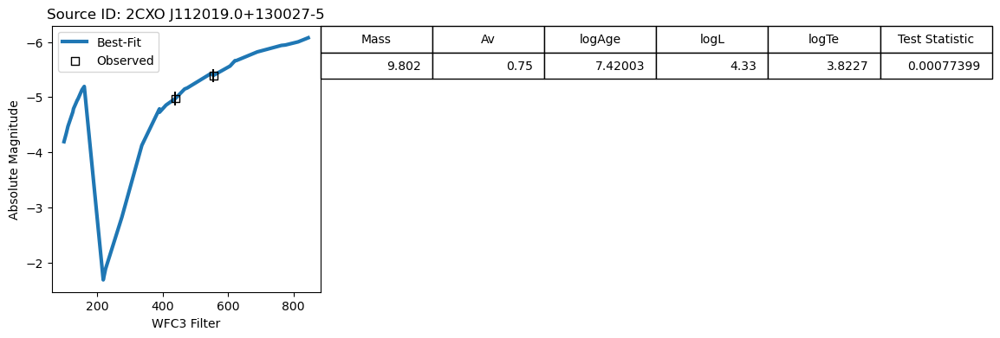

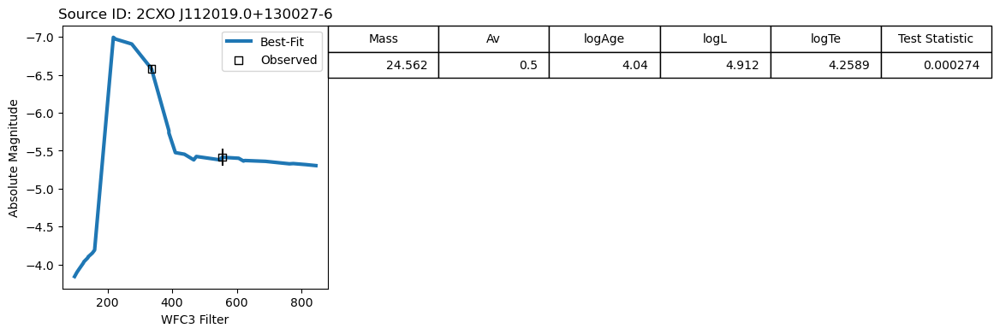

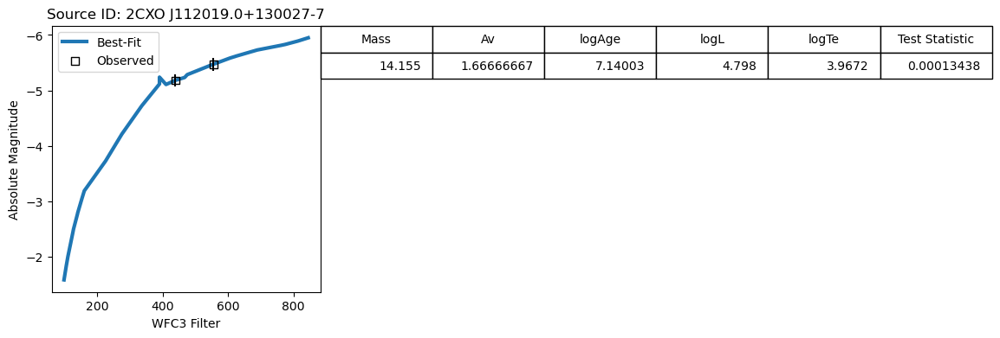

...

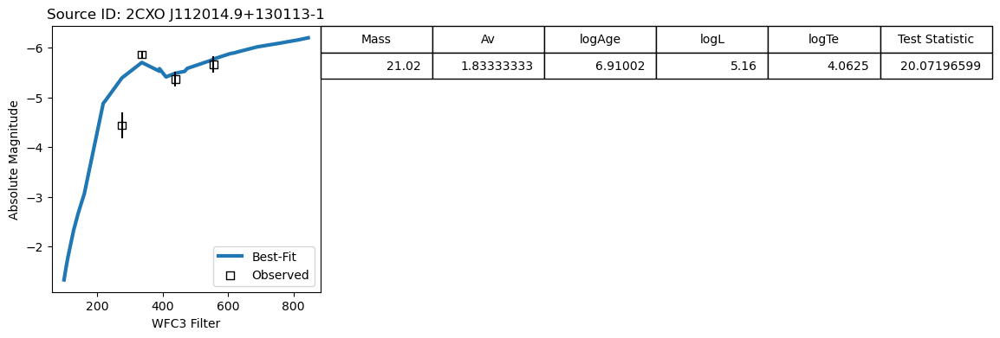

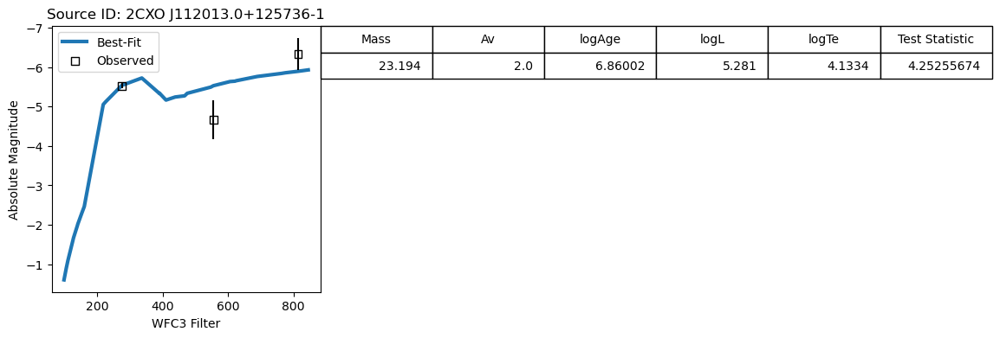

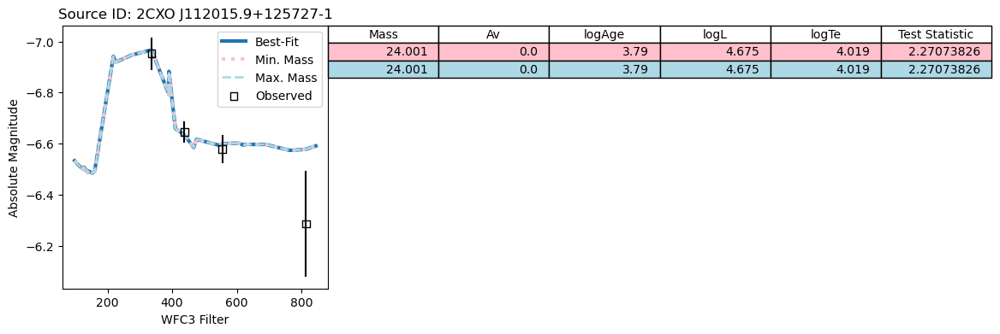

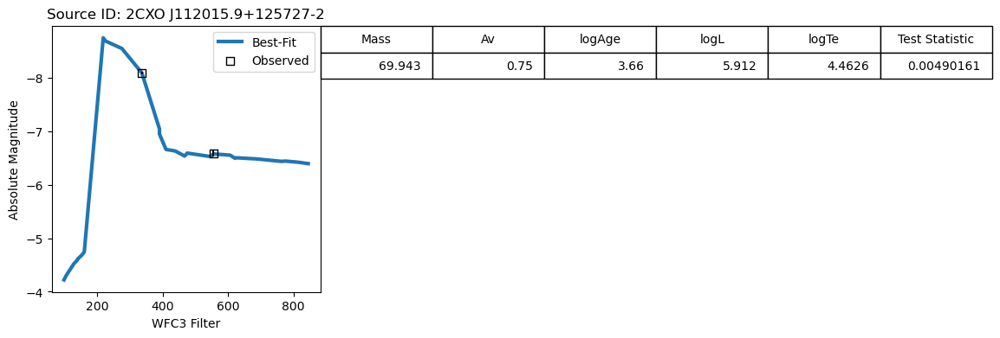

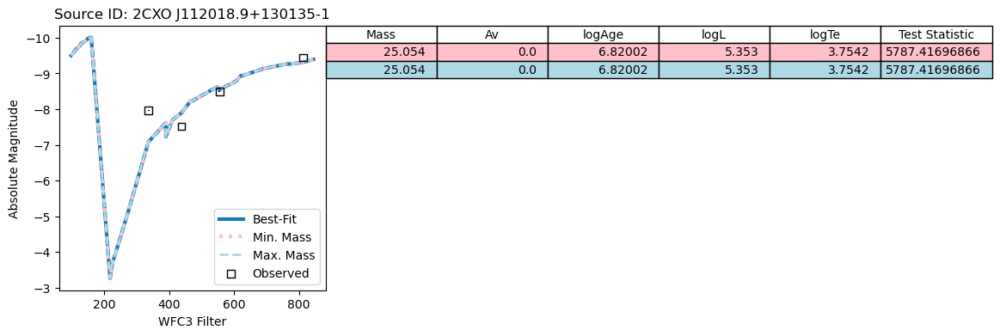

,Zini,MH,logAge,Mini,int_IMF,Mass,logL,logTe,logg,label,...,F689M,F763M,F845M,F098M,F127M,F139M,F153M,Av,Test Statistic,ID
0,0.0152,0.01508,6.90002,22.185715,2.631074,21.424,5.116,3.6728,0.296,1,...,-7.333222,-7.631708,-7.877828,-4.603005,-5.874111,-6.244935,-6.654809,1.333333,2.096291e-07,2CXO J112014.7+125937-1
1,0.0152,0.01508,7.04002,17.746626,2.630110,16.320,4.976,3.6583,0.260,3,...,-7.581785,-7.854122,-8.071112,-6.774752,-7.669548,-7.926222,-8.217479,0.583333,5.386878e-07,2CXO J112015.2+125921-2
2,0.0152,0.01508,6.84002,25.442499,2.631541,24.090,5.290,3.6485,0.076,1,...,-8.050090,-8.359049,-8.601319,-6.458753,-7.565576,-7.887206,-8.236181,0.916667,1.403130e-06,2CXO J112014.7+125937-4
3,0.0152,0.01508,6.88002,23.172636,2.631232,22.280,5.182,3.6985,0.350,1,...,-7.334701,-7.620903,-7.864733,-3.900756,-5.239631,-5.631173,-6.063585,1.583333,1.964288e-06,2CXO J112014.7+125937-3
4,0.0152,0.01508,4.20000,15.871589,2.629511,15.873,4.162,4.0109,2.472,0,...,-5.280826,-5.261732,-5.285302,-5.026250,-5.043507,-5.038746,-5.048926,0.083333,3.428541e-06,2CXO J112015.0+125938-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97,0.0152,0.01508,6.50001,86.169403,2.633447,49.962,6.281,3.8284,0.121,1,...,-12.208000,-12.198000,-12.176000,-12.032000,-12.158000,-12.075000,-12.328000,0.000000,5.153874e+04,2CXO J112014.8+125814-1
98,0.0152,0.01508,6.50001,86.169403,2.633447,49.962,6.281,3.8284,0.121,1,...,-12.208000,-12.198000,-12.176000,-12.032000,-12.158000,-12.075000,-12.328000,0.000000,5.153874e+04,2CXO J112014.8+125814-1
99,0.0152,0.01508,6.51001,81.597450,2.633411,48.903,6.207,4.2267,1.779,1,...,-12.369180,-11.916099,-11.544638,-5.736507,-5.829152,-5.515411,-6.363362,1.833333,2.537485e+05,2CXO J112013.4+130026-4
100,0.0152,0.01508,6.82002,26.709871,2.631688,25.054,5.353,3.7542,0.452,1,...,-9.130000,-9.266000,-9.395000,-9.503000,-9.822000,-9.898000,-10.006000,0.000000,5.787417e+03,2CXO J112018.9+130135-1


In [ ]:
best_fit = FitSED(
    df=photometry,
    idheader='ID',
    min_models=1,
    instrument='wfc3',
    plotSED=True,
    model_ext=True
)

display(best_fit)

In [ ]:
best_fit.to_csv(chandra_hst_dir+"M66_daoclean_matches_sed_fitting.csv")

# Quantifying the ejection rate of X-ray Binaries

In this section, I am performing the following actions:

1. Crossreference between different cluster catalogs with a search radius of 1000 pc
2. Get Separation between the clusters and XRBs
    - Using the selected stars within the 2 sig for HMXBs
    - Using the positions of the Chandra sources for LMXBs
3. Get the velocities of ejection
4. Make distance and velocity plots

**Convert 2Sig from arcsec to pc

## Cluster Catalog

In [234]:
M66_notes = remove_unnamed(pd.read_csv(chandra_hst_dir+'M66_XRB_notes.txt'))
M66_photometry = remove_unnamed(pd.read_csv(chandra_hst_dir+"M66_daoclean_matches_photometry.csv"))
M66_best = remove_unnamed(pd.read_csv(chandra_hst_dir+"M66_csc_bestrads.frame"))
best_fit = FindUnique(remove_unnamed(pd.read_csv(chandra_hst_dir+"M66_daoclean_matches_sed_fitting.csv")), header='ID')
M66_notes = M66_notes.drop(columns=['Mass', 'Notes'])
M66_hmxbs = M66_notes.query('Class == "HMXB"').reset_index(drop=True)
M66_lmxbs = M66_notes.query('Class == "LMXB"').reset_index(drop=True)

In [235]:
temp = M66_best[['CSC ID', '2Sig']]
M66_hmxbs = M66_hmxbs.merge(temp, on='CSC ID', how='left')
M66_hmxbs['Main ID'] = M66_hmxbs['CSC ID'] + '-' + M66_hmxbs['Best Star'].astype(int).astype(str)
temp = M66_photometry[['X', 'Y', 'RA', 'Dec', 'CSC ID', 'ID']]
M66_hmxbs = M66_hmxbs.merge(temp, left_on='Main ID', right_on='ID', how='left')
M66_hmxbs = M66_hmxbs.drop(['CSC ID_y', 'ID_y'], axis=1)
M66_hmxbs = M66_hmxbs.rename(columns={'CSC ID_x': 'CSC ID', 'ID_x': 'Auxiliary ID', 'Main ID': 'ID'})
temp_fit = best_fit[['ID', 'Mass', 'logAge']]
M66_hmxbs = M66_hmxbs.merge(temp_fit, on='ID', how='left')
M66_hmxbs

,CSC ID,Auxiliary ID,Class,Best Star,2Sig,ID,X,Y,RA,Dec,Mass,logAge
0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,2CXO J112014.9+125933-2,3743.843919,5833.507868,170.062292,12.992626,22.265,6.77002
1,2CXO J112015.0+125936,CXO006,HMXB,1.0,0.243913,2CXO J112015.0+125936-1,3700.317585,5908.701948,170.062784,12.993454,NaN,NaN
2,2CXO J112015.0+125921,CXO007,HMXB,1.0,0.467468,2CXO J112015.0+125921-1,3727.624318,5519.646556,170.062475,12.989172,NaN,NaN
3,2CXO J112015.2+125921,CXO008,HMXB,2.0,0.375305,2CXO J112015.2+125921-2,3652.013236,5540.798551,170.063329,12.989405,16.320,7.04002
4,2CXO J112014.7+125937,CXO009,HMXB,3.0,0.465134,2CXO J112014.7+125937-3,3835.805127,5920.614178,170.061253,12.993585,22.280,6.88002
5,2CXO J112015.0+125938,CXO010,HMXB,1.0,0.343588,2CXO J112015.0+125938-1,3694.780748,5952.563551,170.062846,12.993936,15.873,4.20000
6,2CXO J112015.3+125944,CXO014,HMXB,1.0,0.346187,2CXO J112015.3+125944-1,3595.444164,6102.186159,170.063968,12.995583,NaN,NaN
7,2CXO J112013.5+125944,CXO019,HMXB,1.0,0.303917,2CXO J112013.5+125944-1,4265.222965,6110.760032,170.056403,12.995677,28.367,6.76002
8,2CXO J112012.8+125947,CXO022,HMXB,1.0,0.277362,2CXO J112012.8+125947-1,4518.077121,6197.146311,170.053547,12.996628,15.594,7.07002
9,2CXO J112016.8+125959,CXO024,HMXB,3.0,0.502163,2CXO J112016.8+125959-3,3042.724778,6490.637342,170.070211,12.999858,34.060,6.56001


In [236]:
# Add X, Y, RA, Dec and 2Sig coordiantes to LMXBs
temp = M66_best[['X', 'Y', 'RA', 'Dec', '2Sig', 'CSC ID']].copy()
M66_lmxbs = M66_lmxbs.merge(temp, on='CSC ID', how='left')
M66_lmxbs['Mass'], M66_lmxbs['logAge'] = np.nan, np.nan
M66_lmxbs = M66_lmxbs.rename(columns={'ID' : "Auxiliary ID"})
M66_lmxbs['ID'] = M66_lmxbs['CSC ID']
M66_lmxbs

,CSC ID,Auxiliary ID,Class,Best Star,X,Y,RA,Dec,2Sig,Mass,logAge,ID
0,2CXO J112015.3+125932,CXO005,LMXB,NaN,3582.5679,5797.8225,170.064119,12.992230,0.345133,NaN,NaN,2CXO J112015.3+125932
1,2CXO J112014.2+125927,CXO011,LMXB,NaN,4002.0866,5674.7324,170.059380,12.990875,0.228792,NaN,NaN,2CXO J112014.2+125927
2,2CXO J112014.1+125923,CXO012,LMXB,NaN,4055.9474,5574.4439,170.058772,12.989771,0.361474,NaN,NaN,2CXO J112014.1+125923
3,2CXO J112014.3+125918,CXO013,LMXB,NaN,3973.0230,5447.7638,170.059709,12.988377,0.337231,NaN,NaN,2CXO J112014.3+125918
4,2CXO J112014.5+125946,CXO015,LMXB,NaN,3887.2202,6164.2749,170.060678,12.996263,0.245530,NaN,NaN,2CXO J112014.5+125946
5,2CXO J112015.8+125910,CXO016,LMXB,NaN,3417.5319,5253.3350,170.065983,12.986237,0.364787,NaN,NaN,2CXO J112015.8+125910
6,2CXO J112013.9+125913,CXO017,LMXB,NaN,4120.0244,5317.0384,170.058048,12.986939,0.246783,NaN,NaN,2CXO J112013.9+125913
7,2CXO J112013.4+125928,CXO018,LMXB,NaN,4308.3671,5695.5862,170.055921,12.991105,0.265307,NaN,NaN,2CXO J112013.4+125928
8,2CXO J112015.5+125955,CXO020,LMXB,NaN,3522.8785,6374.9440,170.064793,12.998581,0.377741,NaN,NaN,2CXO J112015.5+125955
9,2CXO J112015.8+125904,CXO021,LMXB,NaN,3424.5852,5088.2655,170.065903,12.984421,0.471858,NaN,NaN,2CXO J112015.8+125904


In [237]:
# Concatenating the 2 dataframes together
M66_xrbs = pd.concat([M66_hmxbs, M66_lmxbs]).reset_index(drop=True)
M66_xrbs

,CSC ID,Auxiliary ID,Class,Best Star,2Sig,ID,X,Y,RA,Dec,Mass,logAge
0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,2CXO J112014.9+125933-2,3743.843919,5833.507868,170.062292,12.992626,22.265,6.77002
1,2CXO J112015.0+125936,CXO006,HMXB,1.0,0.243913,2CXO J112015.0+125936-1,3700.317585,5908.701948,170.062784,12.993454,NaN,NaN
2,2CXO J112015.0+125921,CXO007,HMXB,1.0,0.467468,2CXO J112015.0+125921-1,3727.624318,5519.646556,170.062475,12.989172,NaN,NaN
3,2CXO J112015.2+125921,CXO008,HMXB,2.0,0.375305,2CXO J112015.2+125921-2,3652.013236,5540.798551,170.063329,12.989405,16.320,7.04002
4,2CXO J112014.7+125937,CXO009,HMXB,3.0,0.465134,2CXO J112014.7+125937-3,3835.805127,5920.614178,170.061253,12.993585,22.280,6.88002
5,2CXO J112015.0+125938,CXO010,HMXB,1.0,0.343588,2CXO J112015.0+125938-1,3694.780748,5952.563551,170.062846,12.993936,15.873,4.20000
6,2CXO J112015.3+125944,CXO014,HMXB,1.0,0.346187,2CXO J112015.3+125944-1,3595.444164,6102.186159,170.063968,12.995583,NaN,NaN
7,2CXO J112013.5+125944,CXO019,HMXB,1.0,0.303917,2CXO J112013.5+125944-1,4265.222965,6110.760032,170.056403,12.995677,28.367,6.76002
8,2CXO J112012.8+125947,CXO022,HMXB,1.0,0.277362,2CXO J112012.8+125947-1,4518.077121,6197.146311,170.053547,12.996628,15.594,7.07002
9,2CXO J112016.8+125959,CXO024,HMXB,3.0,0.502163,2CXO J112016.8+125959-3,3042.724778,6490.637342,170.070211,12.999858,34.060,6.56001


In [238]:
# 2Sig values are in arcsec. Need to convert to pc
# 45.4 pc/arcsec for ngc 3627
import astropy.units as u
M66_xrbs['2 Sig (pc)'] = M66_xrbs['2Sig'].values * 45.4 # pc
M66_xrbs['2 Sig (km)'] = M66_xrbs['2 Sig (pc)'] * u.pc.to(u.km)
# Convert logAge to Age in Myrs
logage = M66_xrbs['logAge'].values
age_yr = 10 ** logage 
age_Myr = age_yr / 1000000
M66_xrbs['Age (Myr)'] = age_Myr 
M66_xrbs

,CSC ID,Auxiliary ID,Class,Best Star,2Sig,ID,X,Y,RA,Dec,Mass,logAge,2 Sig (pc),2 Sig (km),Age (Myr)
0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,2CXO J112014.9+125933-2,3743.843919,5833.507868,170.062292,12.992626,22.265,6.77002,10.687848,3.297925e+14,5.888708
1,2CXO J112015.0+125936,CXO006,HMXB,1.0,0.243913,2CXO J112015.0+125936-1,3700.317585,5908.701948,170.062784,12.993454,NaN,NaN,11.073631,3.416965e+14,NaN
2,2CXO J112015.0+125921,CXO007,HMXB,1.0,0.467468,2CXO J112015.0+125921-1,3727.624318,5519.646556,170.062475,12.989172,NaN,NaN,21.223034,6.548744e+14,NaN
3,2CXO J112015.2+125921,CXO008,HMXB,2.0,0.375305,2CXO J112015.2+125921-2,3652.013236,5540.798551,170.063329,12.989405,16.320,7.04002,17.038838,5.257636e+14,10.965287
4,2CXO J112014.7+125937,CXO009,HMXB,3.0,0.465134,2CXO J112014.7+125937-3,3835.805127,5920.614178,170.061253,12.993585,22.280,6.88002,21.117072,6.516048e+14,7.586125
5,2CXO J112015.0+125938,CXO010,HMXB,1.0,0.343588,2CXO J112015.0+125938-1,3694.780748,5952.563551,170.062846,12.993936,15.873,4.20000,15.598888,4.813314e+14,0.015849
6,2CXO J112015.3+125944,CXO014,HMXB,1.0,0.346187,2CXO J112015.3+125944-1,3595.444164,6102.186159,170.063968,12.995583,NaN,NaN,15.716878,4.849722e+14,NaN
7,2CXO J112013.5+125944,CXO019,HMXB,1.0,0.303917,2CXO J112013.5+125944-1,4265.222965,6110.760032,170.056403,12.995677,28.367,6.76002,13.797826,4.257564e+14,5.754664
8,2CXO J112012.8+125947,CXO022,HMXB,1.0,0.277362,2CXO J112012.8+125947-1,4518.077121,6197.146311,170.053547,12.996628,15.594,7.07002,12.592248,3.885562e+14,11.749517
9,2CXO J112016.8+125959,CXO024,HMXB,3.0,0.502163,2CXO J112016.8+125959-3,3042.724778,6490.637342,170.070211,12.999858,34.060,6.56001,22.798208,7.034792e+14,3.630864


In [239]:
M66_xrbs.to_csv(chandra_hst_dir+"M66_XRBs_quantifying_ejection_rates.txt")

### Crossreferencing with cluster catalog

This cluster catalog is downloaded from [here](https://archive.stsci.edu/hlsp/phangs/phangs-cat). There exists another cluster catalog [here](https://archive.stsci.edu/hlsp/phangs.html#hst_image_products_table) and it is exactly the same as the first one.

In [240]:
hdu = fits.open(M66_dir+'ngc3627_cluster_catalog/cluster/hlsp_phangs-cat_hst_wfc3_ngc3627_multi_v1_cluster-human-class12.fits')
hdu.info()
tbl = Table(hdu[1].data)
clustercat = tbl.to_pandas()
clustercat

Filename: /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/ngc3627_cluster_catalog/cluster/hlsp_phangs-cat_hst_wfc3_ngc3627_multi_v1_cluster-human-class12.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU     84   774R x 38C   [K, K, D, D, D, D, D, K, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D]   


,INDEX,ID_PHANGS_CLUSTERS,PHANGS_X,PHANGS_Y,PHANGS_RA,PHANGS_DEC,PHANGS_CLUSTER_CLASS_HUMAN,PHANGS_CLUSTER_CLASS_ML_VGG,PHANGS_CLUSTER_CLASS_ML_VGG_QUAL,PHANGS_F275W_VEGA_TOT,...,PHANGS_F814W_mJy_TOT_ERR,PHANGS_CI,PHANGS_AGE_MINCHISQ,PHANGS_AGE_MINCHISQ_ERR,PHANGS_MASS_MINCHISQ,PHANGS_MASS_MINCHISQ_ERR,PHANGS_EBV_MINCHISQ,PHANGS_EBV_MINCHISQ_ERR,PHANGS_REDUCED_MINCHISQ,NO_DETECTION_FLAG
0,1,14,6614.89,3239.51,170.066136,12.939566,1.0,2,0.9,20.644782,...,0.000124,1.440696,1.0,1.0,8719.629994,2694.287932,0.31,0.04,0.155719,0.0
1,2,46,7284.40,3396.34,170.058575,12.941292,1.0,1,0.8,24.105332,...,0.000155,1.652545,2440.0,1412.0,435789.158150,132243.181503,0.15,0.17,0.675790,0.0
2,3,55,6620.99,3457.63,170.066067,12.941966,1.0,1,1.0,22.281919,...,0.000105,1.554934,182.0,28.0,17467.385090,2360.828542,0.00,0.01,0.798219,0.0
3,4,68,6698.34,3482.21,170.065193,12.942237,1.0,1,1.0,20.826262,...,0.000156,1.723422,210.0,0.0,80145.110419,9281.609214,0.01,0.03,0.181574,0.0
4,5,90,6745.89,3520.91,170.064656,12.942663,1.0,1,1.0,22.925218,...,0.000124,1.869660,500.0,151.0,55569.664342,1130.107884,0.00,0.10,0.702583,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
769,770,10586,6948.57,10474.60,170.062368,13.019192,1.0,1,1.0,24.035996,...,0.000209,1.918178,2440.0,1903.0,313359.153368,166080.309093,0.05,0.02,0.552583,0.0
770,771,10588,7652.35,10475.41,170.054418,13.019201,1.0,1,1.0,-999.000000,...,0.000151,1.766977,577.0,313.0,78050.953887,14334.049089,0.25,0.06,1.785513,1.0
771,772,10604,7564.38,10544.56,170.055412,13.019962,1.0,1,1.0,22.309889,...,0.000146,1.554051,182.0,35.0,16453.259019,2658.032012,0.00,0.00,2.090234,0.0
772,773,10665,6132.20,10861.57,170.071589,13.023451,1.0,1,1.0,24.321418,...,0.000137,1.658193,667.0,50.0,40800.976507,6367.856392,0.00,0.03,1.468957,0.0


The RA and declination are provided in ICRS frame. Need to convert them to the Fk5 frame.

In [241]:
ra, dec = clustercat['PHANGS_RA'].values, clustercat['PHANGS_DEC'].values
fk5 = SkyCoord(ra=ra, dec=dec, unit='deg', frame='icrs').transform_to(FK5)
ra_fk5, dec_fk5 = fk5.ra.deg, fk5.dec.deg
clustercat['RA'], clustercat['Dec'] = ra_fk5, dec_fk5
clustercat.to_csv(M66_dir+"ngc3627_cluster_catalog/M66_phangs_wfc3_cluster_catalog.frame")

In [242]:
clustercat

,INDEX,ID_PHANGS_CLUSTERS,PHANGS_X,PHANGS_Y,PHANGS_RA,PHANGS_DEC,PHANGS_CLUSTER_CLASS_HUMAN,PHANGS_CLUSTER_CLASS_ML_VGG,PHANGS_CLUSTER_CLASS_ML_VGG_QUAL,PHANGS_F275W_VEGA_TOT,...,PHANGS_AGE_MINCHISQ,PHANGS_AGE_MINCHISQ_ERR,PHANGS_MASS_MINCHISQ,PHANGS_MASS_MINCHISQ_ERR,PHANGS_EBV_MINCHISQ,PHANGS_EBV_MINCHISQ_ERR,PHANGS_REDUCED_MINCHISQ,NO_DETECTION_FLAG,RA,Dec
0,1,14,6614.89,3239.51,170.066136,12.939566,1.0,2,0.9,20.644782,...,1.0,1.0,8719.629994,2694.287932,0.31,0.04,0.155719,0.0,170.066141,12.939562
1,2,46,7284.40,3396.34,170.058575,12.941292,1.0,1,0.8,24.105332,...,2440.0,1412.0,435789.158150,132243.181503,0.15,0.17,0.675790,0.0,170.058580,12.941288
2,3,55,6620.99,3457.63,170.066067,12.941966,1.0,1,1.0,22.281919,...,182.0,28.0,17467.385090,2360.828542,0.00,0.01,0.798219,0.0,170.066072,12.941963
3,4,68,6698.34,3482.21,170.065193,12.942237,1.0,1,1.0,20.826262,...,210.0,0.0,80145.110419,9281.609214,0.01,0.03,0.181574,0.0,170.065198,12.942233
4,5,90,6745.89,3520.91,170.064656,12.942663,1.0,1,1.0,22.925218,...,500.0,151.0,55569.664342,1130.107884,0.00,0.10,0.702583,0.0,170.064661,12.942659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
769,770,10586,6948.57,10474.60,170.062368,13.019192,1.0,1,1.0,24.035996,...,2440.0,1903.0,313359.153368,166080.309093,0.05,0.02,0.552583,0.0,170.062373,13.019188
770,771,10588,7652.35,10475.41,170.054418,13.019201,1.0,1,1.0,-999.000000,...,577.0,313.0,78050.953887,14334.049089,0.25,0.06,1.785513,1.0,170.054423,13.019197
771,772,10604,7564.38,10544.56,170.055412,13.019962,1.0,1,1.0,22.309889,...,182.0,35.0,16453.259019,2658.032012,0.00,0.00,2.090234,0.0,170.055417,13.019958
772,773,10665,6132.20,10861.57,170.071589,13.023451,1.0,1,1.0,24.321418,...,667.0,50.0,40800.976507,6367.856392,0.00,0.03,1.468957,0.0,170.071595,13.023447


In [243]:
clustercat.columns

Index(['INDEX', 'ID_PHANGS_CLUSTERS', 'PHANGS_X', 'PHANGS_Y', 'PHANGS_RA',
       'PHANGS_DEC', 'PHANGS_CLUSTER_CLASS_HUMAN',
       'PHANGS_CLUSTER_CLASS_ML_VGG', 'PHANGS_CLUSTER_CLASS_ML_VGG_QUAL',
       'PHANGS_F275W_VEGA_TOT', 'PHANGS_F275W_VEGA_TOT_ERR',
       'PHANGS_F336W_VEGA_TOT', 'PHANGS_F336W_VEGA_TOT_ERR',
       'PHANGS_F438W_VEGA_TOT', 'PHANGS_F438W_VEGA_TOT_ERR',
       'PHANGS_F555W_VEGA_TOT', 'PHANGS_F555W_VEGA_TOT_ERR',
       'PHANGS_F814W_VEGA_TOT', 'PHANGS_F814W_VEGA_TOT_ERR',
       'PHANGS_F275W_mJy_TOT', 'PHANGS_F275W_mJy_TOT_ERR',
       'PHANGS_F336W_mJy_TOT', 'PHANGS_F336W_mJy_TOT_ERR',
       'PHANGS_F438W_mJy_TOT', 'PHANGS_F438W_mJy_TOT_ERR',
       'PHANGS_F555W_mJy_TOT', 'PHANGS_F555W_mJy_TOT_ERR',
       'PHANGS_F814W_mJy_TOT', 'PHANGS_F814W_mJy_TOT_ERR', 'PHANGS_CI',
       'PHANGS_AGE_MINCHISQ', 'PHANGS_AGE_MINCHISQ_ERR',
       'PHANGS_MASS_MINCHISQ', 'PHANGS_MASS_MINCHISQ_ERR',
       'PHANGS_EBV_MINCHISQ', 'PHANGS_EBV_MINCHISQ_ERR',
       'PHANGS

In [244]:
WriteReg(
    clustercat,
    outfile=M66_dir+"ngc3627_cluster_catalog/M66_phangs_cluster_catalog_wfc3_fk5.reg",
    coordsys='fk5',
    idheader='ID_PHANGS_CLUSTERS',
    coordheads=['RA', 'Dec'],
    radius=0.1,
    radunit='arcsec'
)

Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/ngc3627_cluster_catalog/M66_phangs_cluster_catalog_wfc3_fk5.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/ngc3627_cluster_catalog/M66_phangs_cluster_catalog_wfc3_fk5.reg saved!


In [245]:
# Change column names to usable names
columns = {
    'ID_PHANGS_CLUSTERS'       : 'Cluster ID',
    'PHANGS_AGE_MINCHISQ'      : 'Cluster Age (Myr)',
    'PHANGS_AGE_MINCHISQ_ERR'  : 'Cluster Age Err (Myr)',
    'PHANGS_MASS_MINCHISQ'     : 'Cluster Mass (M_sun)',
    'PHANGS_MASS_MINCHISQ_ERR' : 'Cluster Mass Err (M_sun)',
    'PHANGS_EBV_MINCHISQ'      : 'Cluster Extinction',
    'PHANGS_EBV_MINCHISQ_ERR'  : 'Cluster Extinction Err',
    'PHANGS_REDUCED_MINCHISQ'  : 'Cluster MinChiSqd'
}
# Only include the columns that I will be using in the dataframe
clustercat = clustercat.rename(columns=columns, inplace=False)
clustercat = clustercat[['Cluster ID', 'Cluster Age (Myr)',
                         'Cluster Age Err (Myr)', 'Cluster Mass (M_sun)',
                         'Cluster Mass Err (M_sun)', 'Cluster Extinction',
                         'Cluster Extinction Err', 'Cluster MinChiSqd']]

In [246]:
clustercat

,Cluster ID,Cluster Age (Myr),Cluster Age Err (Myr),Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster Extinction,Cluster Extinction Err,Cluster MinChiSqd
0,14,1.0,1.0,8719.629994,2694.287932,0.31,0.04,0.155719
1,46,2440.0,1412.0,435789.158150,132243.181503,0.15,0.17,0.675790
2,55,182.0,28.0,17467.385090,2360.828542,0.00,0.01,0.798219
3,68,210.0,0.0,80145.110419,9281.609214,0.01,0.03,0.181574
4,90,500.0,151.0,55569.664342,1130.107884,0.00,0.10,0.702583
...,...,...,...,...,...,...,...,...
769,10586,2440.0,1903.0,313359.153368,166080.309093,0.05,0.02,0.552583
770,10588,577.0,313.0,78050.953887,14334.049089,0.25,0.06,1.785513
771,10604,182.0,35.0,16453.259019,2658.032012,0.00,0.00,2.090234
772,10665,667.0,50.0,40800.976507,6367.856392,0.00,0.03,1.468957


In [247]:
# This is also a catalog present in the second website mentioned above. 
# However, the data in this fits file does not have the cluster ages and masses
# So, I will not be using it here.
hdu = fits.open('/Users/undergradstudent/Downloads/catalogs/hlsp_phangs-cat_hst_uvis_ngc3627_multi_v1_obs-human-cluster-class12.fits')
hdu.info()
tbl = Table(hdu[1].data)
clustercat2 = tbl.to_pandas()
clustercat2

Filename: /Users/undergradstudent/Downloads/catalogs/hlsp_phangs-cat_hst_uvis_ngc3627_multi_v1_obs-human-cluster-class12.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU    264   774R x 35C   [K, K, K, K, D, D, D, D, D, K, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, 7A]   


,INDEX,ID_PHANGS_CLUSTER,ID_PHANGS_CANDIDATE,ID_PHANGS_ALLSOURCES,PHANGS_X,PHANGS_Y,PHANGS_RA,PHANGS_DEC,PHANGS_CLUSTER_CLASS_HUMAN,PHANGS_CLUSTER_CLASS_ML_VGG,...,PHANGS_F438W_mJy,PHANGS_F438W_mJy_ERR,PHANGS_F555W_mJy,PHANGS_F555W_mJy_TOT_ERR,PHANGS_F814W_mJy,PHANGS_F814W_mJy_TOT_ERR,PHANGS_NON_DETECTION_FLAG,PHANGS_NO_COVERAGE_FLAG,PHANGS_CI,CC_CLASS
0,1,9,14,2875,6614.89,3239.51,170.066136,12.939566,1.0,4,...,0.005185,0.000150,0.004488,0.000070,0.003450,0.000124,0.0,0.0,1.440696,ycl
1,2,31,46,958,7284.40,3396.34,170.058575,12.941292,1.0,1,...,0.004047,0.000103,0.007869,0.000068,0.019730,0.000155,0.0,0.0,1.652545,outside
2,3,38,55,4336,6620.99,3457.63,170.066067,12.941966,1.0,1,...,0.004237,0.000106,0.003860,0.000052,0.003862,0.000105,0.0,0.0,1.554934,outside
3,4,47,68,737,6698.34,3482.21,170.065193,12.942237,1.0,1,...,0.016263,0.000161,0.015766,0.000094,0.016978,0.000156,0.0,0.0,1.723422,map
4,5,61,90,2823,6745.89,3520.91,170.064656,12.942663,1.0,1,...,0.005927,0.000121,0.006468,0.000073,0.008060,0.000124,0.0,0.0,1.869660,map
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
769,770,6138,10586,2963,6948.57,10474.60,170.062368,13.019192,1.0,1,...,0.004333,0.000112,0.007572,0.000111,0.016824,0.000209,0.0,0.0,1.918178,outside
770,771,6140,10588,5455,7652.35,10475.41,170.054418,13.019201,1.0,1,...,0.002808,0.000097,0.004103,0.000086,0.006772,0.000151,1.0,0.0,1.766977,outside
771,772,6150,10604,7971,7564.38,10544.56,170.055412,13.019962,1.0,1,...,0.004072,0.000104,0.003798,0.000083,0.003277,0.000146,0.0,0.0,1.554051,outside
772,773,6201,10665,5200,6132.20,10861.57,170.071589,13.023451,1.0,1,...,0.003248,0.000103,0.003982,0.000085,0.004966,0.000137,0.0,0.0,1.658193,map


### Calculate distances and velocity of ejection between XRBs and clusters

In [248]:
M66_xrbs = remove_unnamed(pd.read_csv(chandra_hst_dir+"M66_XRBs_quantifying_ejection_rates.txt"))

We need to use a search radius of 1000 pc and the parsec to arcsec conversion is 45.4 pc/arcsec.
 $$\begin{align}1^{\circ} = 3600 ''  \implies 1'' = \frac{1}{3600}^{\circ} \implies 45.5 pc = 3600^{\circ} \implies 1000 pc = \frac{3600^{\circ}}{45.4 pc} \times 1000\end{align}$$


In [314]:
search_radius = 1000 / (3600 * 45.4)
print(f'Using search radius: {search_radius}')

Using search radius: 0.006118453255017132


In [250]:
from helpers.analysis import calculate_distance
distances = calculate_distance(
    df=M66_xrbs,
    search_radius=search_radius,
    catalogs=['Cluster'],
    regions=[M66_dir+'ngc3627_cluster_catalog/M66_phangs_cluster_catalog_wfc3_fk5.reg'],
    sourceid='ID',
    imagefilename=f555w,
    instrument='wfc3',
)

distances

Finding cross-references between sources. This will take a few minutes. Please wait.. 
DONE WITH CLEANING. CREATING DATAFRAME...


,RA,Dec,ID,Cluster ID,CSC ID,Auxiliary ID,Class,Best Star,2Sig,X,...,Mass,logAge,2 Sig (pc),2 Sig (km),Age (Myr),Cluster RA,Cluster Dec,Cluster Separation (arcsecs),Cluster Separation (pc),Cluster Separation (km)
0,170.062292,12.992626,2CXO J112014.9+125933-2,6740,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,22.265,6.77002,10.687848,3.297925e+14,5.888708,170.061854,12.987710,17.765842,808.345830,2.494295e+16
1,170.062292,12.992626,2CXO J112014.9+125933-2,6788,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,22.265,6.77002,10.687848,3.297925e+14,5.888708,170.061841,12.987972,16.827650,765.658068,2.362574e+16
2,170.062292,12.992626,2CXO J112014.9+125933-2,6969,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,22.265,6.77002,10.687848,3.297925e+14,5.888708,170.058295,12.988915,19.367409,881.217096,2.719152e+16
3,170.062292,12.992626,2CXO J112014.9+125933-2,7009,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,22.265,6.77002,10.687848,3.297925e+14,5.888708,170.057686,12.989116,20.512889,933.336447,2.879975e+16
4,170.062292,12.992626,2CXO J112014.9+125933-2,7020,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,22.265,6.77002,10.687848,3.297925e+14,5.888708,170.058562,12.989207,17.963999,817.361973,2.522116e+16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1804,170.081928,12.972281,2CXO J112019.6+125820,3800,2CXO J112019.6+125820,CXO055,LMXB,NaN,0.264355,2005.603200,...,NaN,NaN,12.001723,3.703345e+14,NaN,170.079079,12.977196,20.322885,924.691247,2.853299e+16
1805,170.081928,12.972281,2CXO J112019.6+125820,3890,2CXO J112019.6+125820,CXO055,LMXB,NaN,0.264355,2005.603200,...,NaN,NaN,12.001723,3.703345e+14,NaN,170.078923,12.977459,21.415042,974.384433,3.006636e+16
1806,170.081928,12.972281,2CXO J112019.6+125820,3993,2CXO J112019.6+125820,CXO055,LMXB,NaN,0.264355,2005.603200,...,NaN,NaN,12.001723,3.703345e+14,NaN,170.079356,12.977685,21.445704,975.779554,3.010941e+16
1807,170.072915,12.945547,2CXO J112017.5+125644,401,2CXO J112017.5+125644,CXO072,LMXB,NaN,0.369854,2803.566100,...,NaN,NaN,16.791378,5.181278e+14,NaN,170.071919,12.949207,13.630055,620.167500,1.913637e+16


In [251]:
clustercat = remove_unnamed(pd.read_csv(M66_dir+"ngc3627_cluster_catalog/M66_phangs_wfc3_cluster_catalog.frame"))
# Change column names to usable names
columns = {
    'ID_PHANGS_CLUSTERS'       : 'Cluster ID',
    'PHANGS_AGE_MINCHISQ'      : 'Cluster Age (Myr)',
    'PHANGS_AGE_MINCHISQ_ERR'  : 'Cluster Age Err (Myr)',
    'PHANGS_MASS_MINCHISQ'     : 'Cluster Mass (M_sun)',
    'PHANGS_MASS_MINCHISQ_ERR' : 'Cluster Mass Err (M_sun)',
    'PHANGS_EBV_MINCHISQ'      : 'Cluster Extinction',
    'PHANGS_EBV_MINCHISQ_ERR'  : 'Cluster Extinction Err',
    'PHANGS_REDUCED_MINCHISQ'  : 'Cluster MinChiSqd'
}
# Only include the columns that I will be using in the dataframe
clustercat = clustercat.rename(columns=columns, inplace=False)
clustercat = clustercat[['Cluster ID', 'Cluster Age (Myr)',
                         'Cluster Age Err (Myr)', 'Cluster Mass (M_sun)',
                         'Cluster Mass Err (M_sun)', 'Cluster Extinction',
                         'Cluster Extinction Err', 'Cluster MinChiSqd']]

clustercat

,Cluster ID,Cluster Age (Myr),Cluster Age Err (Myr),Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster Extinction,Cluster Extinction Err,Cluster MinChiSqd
0,14,1.0,1.0,8719.629994,2694.287932,0.31,0.04,0.155719
1,46,2440.0,1412.0,435789.158150,132243.181503,0.15,0.17,0.675790
2,55,182.0,28.0,17467.385090,2360.828542,0.00,0.01,0.798219
3,68,210.0,0.0,80145.110419,9281.609214,0.01,0.03,0.181574
4,90,500.0,151.0,55569.664342,1130.107884,0.00,0.10,0.702583
...,...,...,...,...,...,...,...,...
769,10586,2440.0,1903.0,313359.153368,166080.309093,0.05,0.02,0.552583
770,10588,577.0,313.0,78050.953887,14334.049089,0.25,0.06,1.785513
771,10604,182.0,35.0,16453.259019,2658.032012,0.00,0.00,2.090234
772,10665,667.0,50.0,40800.976507,6367.856392,0.00,0.03,1.468957


In [252]:
distances = distances.merge(clustercat, on='Cluster ID', how='left')
cols = ['RA', 'Dec', 'ID', 'Cluster ID', 'CSC ID', 'Auxiliary ID', 'Class',
       'Best Star', '2Sig', 'X', 'Y', 'Mass', 'logAge', '2 Sig (pc)', '2 Sig (km)',
       'Age (Myr)', 'Cluster RA', 'Cluster Dec',
       'Cluster Mass (M_sun)', 'Cluster Mass Err (M_sun)',
       'Cluster Extinction', 'Cluster Extinction Err',
       'Cluster MinChiSqd','Cluster Separation (pc)', 'Cluster Separation (km)',
       'Cluster Age (Myr)', 'Cluster Age Err (Myr)']

distances = distances[cols]
distances

,RA,Dec,ID,Cluster ID,CSC ID,Auxiliary ID,Class,Best Star,2Sig,X,...,Cluster Dec,Cluster Mass (M_sun),Cluster Mass Err (M_sun),Cluster Extinction,Cluster Extinction Err,Cluster MinChiSqd,Cluster Separation (pc),Cluster Separation (km),Cluster Age (Myr),Cluster Age Err (Myr)
0,170.062292,12.992626,2CXO J112014.9+125933-2,6740,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,12.987710,32159.451166,67739.414328,0.80,0.50,23.386633,808.345830,2.494295e+16,5.0,153.0
1,170.062292,12.992626,2CXO J112014.9+125933-2,6788,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,12.987972,174363.656114,17070.864641,0.00,0.01,3.086535,765.658068,2.362574e+16,890.0,120.0
2,170.062292,12.992626,2CXO J112014.9+125933-2,6969,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,12.988915,69972.213290,11389.178992,0.10,0.09,1.464285,881.217096,2.719152e+16,500.0,77.0
3,170.062292,12.992626,2CXO J112014.9+125933-2,7009,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,12.989116,206060.938059,14694.145980,0.01,0.09,0.208602,933.336447,2.879975e+16,158.0,48.0
4,170.062292,12.992626,2CXO J112014.9+125933-2,7020,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,12.989207,43030.350062,573.446002,0.26,0.07,0.680461,817.361973,2.522116e+16,110.0,34.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1804,170.081928,12.972281,2CXO J112019.6+125820,3800,2CXO J112019.6+125820,CXO055,LMXB,NaN,0.264355,2005.603200,...,12.977196,40134.112945,7159.728173,0.15,0.00,0.984730,924.691247,2.853299e+16,40.0,10.0
1805,170.081928,12.972281,2CXO J112019.6+125820,3890,2CXO J112019.6+125820,CXO055,LMXB,NaN,0.264355,2005.603200,...,12.977459,2863.081686,475.858736,0.25,0.04,0.935630,974.384433,3.006636e+16,5.0,0.0
1806,170.081928,12.972281,2CXO J112019.6+125820,3993,2CXO J112019.6+125820,CXO055,LMXB,NaN,0.264355,2005.603200,...,12.977685,9898.255742,1643.157802,0.06,0.09,1.374862,975.779554,3.010941e+16,43.0,11.0
1807,170.072915,12.945547,2CXO J112017.5+125644,401,2CXO J112017.5+125644,CXO072,LMXB,NaN,0.369854,2803.566100,...,12.949207,28878.694870,5037.633282,0.10,0.07,0.149620,620.167500,1.913637e+16,226.0,17.0


In [253]:
# Convert cluster ages from Myr to s
ages_Myr, ages_err_Myr = distances['Cluster Age (Myr)'].values * u.Myr, distances['Cluster Age Err (Myr)'].values * u.Myr
ages_s, ages_err_s = ages_Myr.to(u.s), ages_err_Myr.to(u.s)
# save to distances df
distances['Cluster Age (s)'] = ages_s.value
distances['Cluster Age Err (s)'] = ages_err_s.value

In [254]:
import numpy as np
def calculate_velocity(df, coordheads, catalog='Cluster', errorheads=False, 
                       shorten_df=False, idheader='ID', additional_cols=[],
                       distance_unit='km', time_unit='s'):
    print("Make sure that the distances and ages are in km and seconds respectively...")
    df = df.copy()
    dist, time = df[coordheads[0]].astype(float).values, df[coordheads[1]].astype(float).values
    df[f'{catalog} Velocity ({distance_unit}/{time_unit})'] = dist / time
    if errorheads:
        dist_err, time_err = df[errorheads[0]].astype(float).values, df[errorheads[1]].astype(float).values
        err = np.sqrt((dist_err / dist) ** 2 + (time_err / time) ** 2)
        df[f'{catalog} Velocity Err ({distance_unit}/{time_unit})'] = df[f'{catalog} Velocity (km/s)'].values * err
    
    if shorten_df:
        cols = [idheader] + additional_cols + [f'{catalog} Velocity Err ({distance_unit}/{time_unit})',
                f'{catalog} Velocity ({distance_unit}/{time_unit})',
                f'{catalog} Velocity Err ({distance_unit}/{time_unit})']
        df = df[cols]

    return df

In [255]:
velocity = calculate_velocity(distances,
                              coordheads=['Cluster Separation (km)', 'Cluster Age (s)'],
                              catalog='Cluster',
                              errorheads=['2 Sig (km)', 'Cluster Age (s)']
                            )

velocity

Make sure that the distances and ages are in km and seconds respectively...


,RA,Dec,ID,Cluster ID,CSC ID,Auxiliary ID,Class,Best Star,2Sig,X,...,Cluster Extinction Err,Cluster MinChiSqd,Cluster Separation (pc),Cluster Separation (km),Cluster Age (Myr),Cluster Age Err (Myr),Cluster Age (s),Cluster Age Err (s),Cluster Velocity (km/s),Cluster Velocity Err (km/s)
0,170.062292,12.992626,2CXO J112014.9+125933-2,6740,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,0.50,23.386633,808.345830,2.494295e+16,5.0,153.0,1.577880e+14,4.828313e+15,158.078853,158.092670
1,170.062292,12.992626,2CXO J112014.9+125933-2,6788,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,0.01,3.086535,765.658068,2.362574e+16,890.0,120.0,2.808626e+16,3.786912e+15,0.841185,0.841267
2,170.062292,12.992626,2CXO J112014.9+125933-2,6969,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,0.09,1.464285,881.217096,2.719152e+16,500.0,77.0,1.577880e+16,2.429935e+15,1.723294,1.723421
3,170.062292,12.992626,2CXO J112014.9+125933-2,7009,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,0.09,0.208602,933.336447,2.879975e+16,158.0,48.0,4.986101e+15,1.514765e+15,5.776007,5.776386
4,170.062292,12.992626,2CXO J112014.9+125933-2,7020,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,0.07,0.680461,817.361973,2.522116e+16,110.0,34.0,3.471336e+15,1.072958e+15,7.265547,7.266168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1804,170.081928,12.972281,2CXO J112019.6+125820,3800,2CXO J112019.6+125820,CXO055,LMXB,NaN,0.264355,2005.603200,...,0.00,0.984730,924.691247,2.853299e+16,40.0,10.0,1.262304e+15,3.155760e+14,22.603898,22.605802
1805,170.081928,12.972281,2CXO J112019.6+125820,3890,2CXO J112019.6+125820,CXO055,LMXB,NaN,0.264355,2005.603200,...,0.04,0.935630,974.384433,3.006636e+16,5.0,0.0,1.577880e+14,0.000000e+00,190.549104,190.563558
1806,170.081928,12.972281,2CXO J112019.6+125820,3993,2CXO J112019.6+125820,CXO055,LMXB,NaN,0.264355,2005.603200,...,0.09,1.374862,975.779554,3.010941e+16,43.0,11.0,1.356977e+15,3.471336e+14,22.188597,22.190275
1807,170.072915,12.945547,2CXO J112017.5+125644,401,2CXO J112017.5+125644,CXO072,LMXB,NaN,0.369854,2803.566100,...,0.07,0.149620,620.167500,1.913637e+16,226.0,17.0,7.132018e+15,5.364792e+14,2.683164,2.684147


In [256]:
v = (np.round(velocity['Cluster Velocity (km/s)'].values, decimals=2).astype(str) + ' km/s').tolist()
print(v)
from helpers.regions import WriteReg
WriteReg(
    sources=velocity,
    outfile=chandra_hst_dir+'M66_XRBs_quantifying_xrb_ejection.reg',
    coordsys='fk5',
    coordheads=['RA', 'Dec'],
    additional_coords=['Cluster RA', 'Cluster Dec'],
    reg_type='ruler',
    label=v,
    radunit='degrees',
    # radius=0.5
)

['158.08 km/s', '0.84 km/s', '1.72 km/s', '5.78 km/s', '7.27 km/s', '12.02 km/s', '3.0 km/s', '1.19 km/s', '0.25 km/s', '4.7 km/s', '3.28 km/s', '0.33 km/s', '6.01 km/s', '0.79 km/s', '0.12 km/s', '3.48 km/s', '3.02 km/s', '0.83 km/s', '0.04 km/s', '169.04 km/s', '0.98 km/s', '1.11 km/s', '3.3 km/s', '0.99 km/s', '136.24 km/s', '4.82 km/s', '3.24 km/s', '3.15 km/s', '5.31 km/s', '186.27 km/s', '1.0 km/s', '8.61 km/s', '12.99 km/s', '3.69 km/s', '1.47 km/s', '0.26 km/s', '5.54 km/s', '4.16 km/s', '0.5 km/s', '5.84 km/s', '0.92 km/s', '0.17 km/s', '3.31 km/s', '4.61 km/s', '2.73 km/s', '0.96 km/s', '0.07 km/s', '183.84 km/s', '1.05 km/s', '26.97 km/s', '11.31 km/s', '1.15 km/s', '2.54 km/s', '0.96 km/s', '112.96 km/s', '50.12 km/s', '116.08 km/s', '3.85 km/s', '3.09 km/s', '2.66 km/s', '4.65 km/s', '91.41 km/s', '132.69 km/s', '116.84 km/s', '5.08 km/s', '194.36 km/s', '6.7 km/s', '120.78 km/s', '20.66 km/s', '5.14 km/s', '847.53 km/s', '14.92 km/s', '9.01 km/s', '20.24 km/s', '2.16 km/s

### Distance and velocity KDE and histogram plots

#### Distance plots

Maximum distance: 1001.0493446723183 pc
Minimum distance: 15.834045825903383 pc


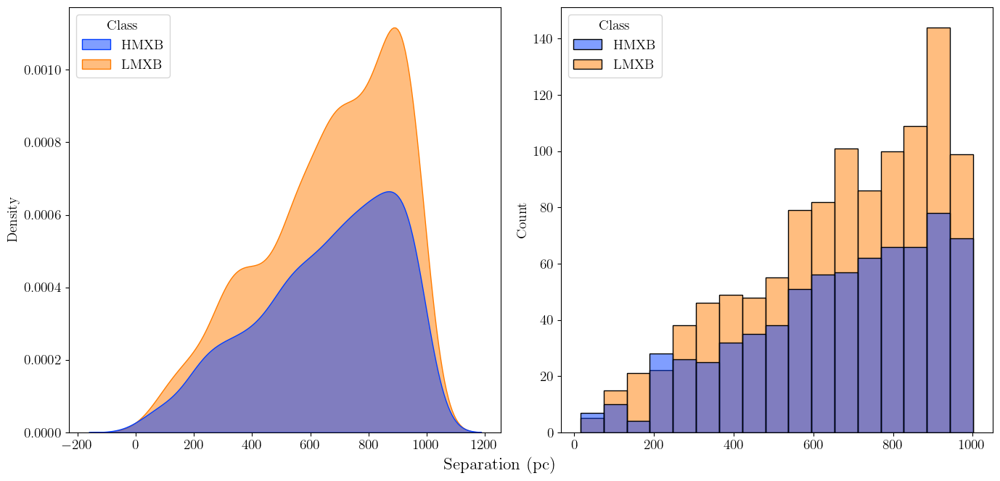

In [257]:
print(f'Maximum distance: {max(distances['Cluster Separation (pc)'])} pc')
print(f'Minimum distance: {min(distances['Cluster Separation (pc)'])} pc')
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))

sns.kdeplot(
    data=velocity,
    x='Cluster Separation (pc)',
    fill=True, 
    ax=ax[0], 
    alpha=0.5,
    hue='Class',
    palette='bright'
)
ax[0].set(xlabel=None)
sns.histplot(
    data=velocity,
    x='Cluster Separation (pc)',
    hue='Class',
    legend=True,
    # kind='hist',
    palette='bright',
    alpha=0.5,
    ax=ax[1]
)
ax[1].set(xlabel=None)

# ax[1].hist(x=velocity['Cluster Separation (pc)'].values, bins=30)
# ax[1].set_ylabel('Counts')

fig.supxlabel("Separation (pc)", x=0.5, y=0.05)
plt.tight_layout()
plt.savefig(M66_dir+'M66_XRB_ejection_cluster_cat_separation.png')
plt.show()


#### Velocity plots

Maximum velocity: 955.78908958313 km/s
Minimum velocity: 0.038541931268568225 km/s


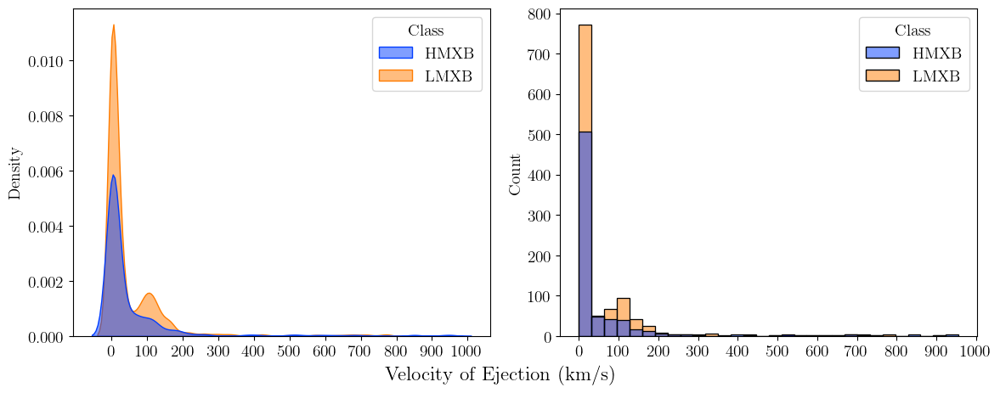

In [258]:
print(f'Maximum velocity: {max(velocity['Cluster Velocity (km/s)'])} km/s')
print(f'Minimum velocity: {min(velocity['Cluster Velocity (km/s)'])} km/s')
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

sns.kdeplot(
    data=velocity, 
    x='Cluster Velocity (km/s)',
    hue='Class',
    bw_adjust=0.5,
    fill=True,
    ax=ax[0],
    alpha=0.5,
    palette='bright'
)
ax[0].set(xlabel=None)
ax[0].set_xticks([i * 100 for i in range(0, 11)])

sns.histplot(
    data=velocity,
    x='Cluster Velocity (km/s)',
    hue='Class',
    bins=30,
    ax=ax[1], 
    alpha=0.5,
    palette='bright'
)
ax[1].set_xticks([i * 100 for i in range(0, 11)])
ax[1].set(xlabel=None)
fig.supxlabel("Velocity of Ejection (km/s)", x=0.5, y=0.07)
plt.tight_layout()
plt.savefig(M66_dir+'M66_XRB_ejection_cluster_cat_velocity.png')
plt.show()

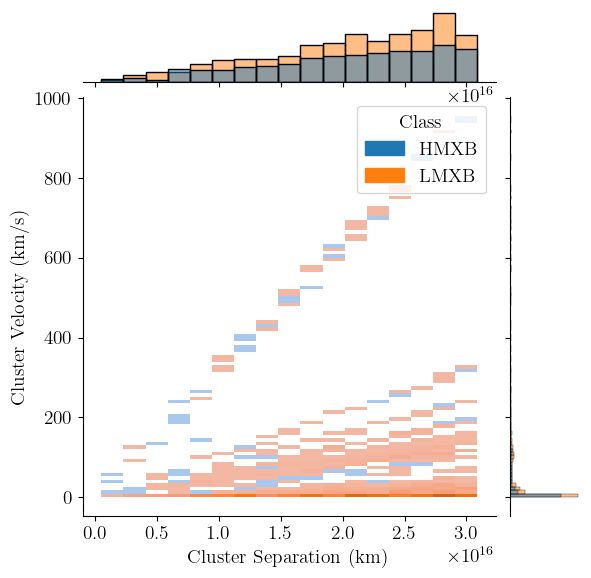

In [259]:
sns.jointplot(
    data=velocity,
    x='Cluster Separation (km)',
    y='Cluster Velocity (km/s)',
    hue='Class',
    kind='hist'
)

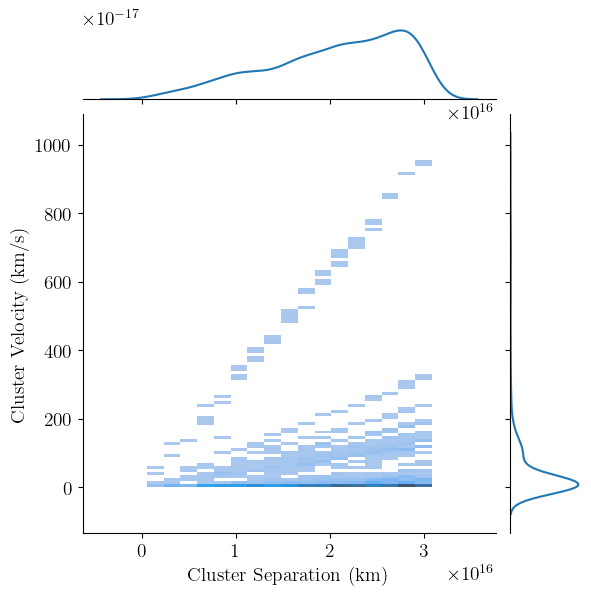

In [260]:
g = sns.JointGrid(data=velocity, x="Cluster Separation (km)", y="Cluster Velocity (km/s)")
g.plot_joint(sns.histplot)
g.plot_marginals(sns.kdeplot)

### Calculating Escape velocities 

The general formula of escape velocity of XRB ejection is $$v_{\text{esc}} = \sqrt{\frac{2 G M}{r}}$$
where $G$ is the gravitational constant, $M$ is the mass of the cluster and $r$ stands for the half mass radius of the cluster.

We can use the concentration index (CI) of a cluster to find the half mass radius. Phangs use CI as the difference in magnitudes measured in 1 pix and 3 pix 
radii apertures.

$$C.I. = \text{mag}_{\text{1 pix}} - \text{mag}_{\text{3 pix}}$$

## Compact Association Catalogs

In [261]:
hdu = fits.open(M66_dir+'ngc3627_compact_association_catalog/assoc/vselect/ws16pc/hlsp_phangs-cat_hst_wfc3_ngc3627_multi_v1_assoc-vselect-ws16pc-main.fits')
tbl = Table(hdu[1].data)
tbl = tbl.to_pandas()
tbl.columns

Index(['reg_id', 'reg_x', 'reg_y', 'reg_ra', 'reg_dec', 'reg_area', 'reg_rad',
       'NUV_dolflux_mjy', 'NUV_dolflux_mjy_err', 'U_dolflux_mjy',
       'U_dolflux_mjy_err', 'B_dolflux_mjy', 'B_dolflux_mjy_err',
       'V_dolflux_mjy', 'V_dolflux_mjy_err', 'I_dolflux_mjy',
       'I_dolflux_mjy_err', 'NUV_dolmag_vega', 'NUV_dolmag_vega_err',
       'U_dolmag_vega', 'U_dolmag_vega_err', 'B_dolmag_vega',
       'B_dolmag_vega_err', 'V_dolmag_vega', 'V_dolmag_vega_err',
       'I_dolmag_vega', 'I_dolmag_vega_err', 'reg_dolflux_Age_MinChiSq',
       'reg_dolflux_Age_MinChiSq_err', 'reg_dolflux_Mass_MinChiSq',
       'reg_dolflux_Mass_MinChiSq_err', 'reg_dolflux_Ebv_MinChiSq',
       'reg_dolflux_Ebv_MinChiSq_err', 'reg_dolflux_ChiSq_Reduced'],
      dtype='object')

In [262]:
ra, dec = tbl['reg_ra'].values, tbl['reg_dec'].values
fk5 = SkyCoord(ra=ra, dec=dec, unit='deg', frame='icrs').transform_to(FK5)
ra_fk5, dec_fk5 = fk5.ra.deg, fk5.dec.deg
tbl['RA'], tbl['Dec'] = ra_fk5, dec_fk5
tbl.to_csv(M66_dir+"ngc3627_compact_association_catalog/M66_phangs_wfc3_compact_association_catalog.frame")
tbl

,reg_id,reg_x,reg_y,reg_ra,reg_dec,reg_area,reg_rad,NUV_dolflux_mjy,NUV_dolflux_mjy_err,U_dolflux_mjy,...,I_dolmag_vega_err,reg_dolflux_Age_MinChiSq,reg_dolflux_Age_MinChiSq_err,reg_dolflux_Mass_MinChiSq,reg_dolflux_Mass_MinChiSq_err,reg_dolflux_Ebv_MinChiSq,reg_dolflux_Ebv_MinChiSq_err,reg_dolflux_ChiSq_Reduced,RA,Dec
0,1.0,7386.0,2975.0,170.057434,12.936649,523.132513,12.904195,0.000076,0.000031,0.000268,...,0.049561,621.0,96.0,10247.243218,2201.758,0.00,0.03,0.811458,170.057439,12.936646
1,2.0,7229.0,3023.0,170.059206,12.937177,327.428264,10.208999,0.000076,0.000021,0.000118,...,0.046549,537.0,213.0,5990.247664,55.648,0.01,0.13,1.597546,170.059212,12.937174
2,3.0,7312.0,3201.0,170.058269,12.939136,323.664720,10.150157,0.000009,0.000019,0.000189,...,0.131829,717.0,180.0,4182.178484,1338.572,0.00,0.18,1.789404,170.058274,12.939133
3,4.0,7434.0,3212.0,170.056892,12.939257,331.191807,10.267503,0.000067,0.000029,0.000086,...,0.072242,37.0,58.0,3063.127299,4181.037,0.56,0.12,0.319823,170.056897,12.939254
4,5.0,7646.0,3233.0,170.054498,12.939488,455.388734,12.039715,0.000131,0.000036,0.000234,...,0.070665,118.0,114.0,4061.832217,2807.382,0.25,0.44,0.045098,170.054503,12.939485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4239,4240.0,5720.0,10892.0,170.076251,13.023780,413.989759,11.479418,0.001135,0.000044,0.001306,...,0.069254,5.0,1.0,561.174598,124.246,0.17,0.08,1.047496,170.076257,13.023776
4240,4241.0,6509.0,10905.0,170.067339,13.023923,323.664720,10.150157,0.000044,0.000025,0.000114,...,0.090891,956.0,628.0,6210.304618,3321.105,0.00,0.00,0.165169,170.067344,13.023920
4241,4242.0,5967.0,10958.0,170.073461,13.024506,350.009523,10.555164,0.000136,0.000033,0.000316,...,0.144884,1.0,4.0,1919.652048,1477.328,0.68,0.18,0.817480,170.073467,13.024503
4242,4243.0,5445.0,11002.0,170.079358,13.024990,331.191807,10.267503,0.000079,0.000031,0.000242,...,0.041704,147.0,1682.0,14089.468617,9475.585,0.47,0.47,0.248801,170.079363,13.024987


In [263]:
WriteReg(
    tbl,
    outfile=M66_dir+"ngc3627_compact_association_catalog/M66_phangs_compact_association_catalog_wfc3_fk5.reg",
    coordsys='fk5',
    idheader='reg_id',
    coordheads=['RA', 'Dec'],
    radius=0.1,
    radunit='arcsec'
)

Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/ngc3627_compact_association_catalog/M66_phangs_compact_association_catalog_wfc3_fk5.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/ngc3627_compact_association_catalog/M66_phangs_compact_association_catalog_wfc3_fk5.reg saved!


In [264]:
cols = ['reg_id', 'reg_area', 'reg_rad','reg_dolflux_Age_MinChiSq',
       'reg_dolflux_Age_MinChiSq_err', 'reg_dolflux_Mass_MinChiSq',
       'reg_dolflux_Mass_MinChiSq_err', 'reg_dolflux_Ebv_MinChiSq',
       'reg_dolflux_Ebv_MinChiSq_err', 'reg_dolflux_ChiSq_Reduced']

temp_tbl = tbl[cols]

columns = {
    'reg_id'                       : 'CA ID',
    'reg_area'                     : 'CA Area (pc^2)',
    'reg_rad'                      : 'CA Eff Radius (pc)',
    'reg_dolflux_Age_MinChiSq'     : 'CA Age (Myr)',
    'reg_dolflux_Age_MinChiSq_err' : 'CA Age Err (Myr)',
    'reg_dolflux_Mass_MinChiSq'    : 'CA Mass (M_sun)',
    'reg_dolflux_Mass_MinChiSq_err': 'CA Mass Err (M_sun)',
    'reg_dolflux_Ebv_MinChiSq'     : 'CA Extinction',
    'reg_dolflux_Ebv_MinChiSq_err' : 'CA Extinction Err',
    'reg_dolflux_ChiSq_Reduced'    : 'CA MinChiSqd'
}
temp_tbl = temp_tbl.rename(columns=columns)
temp_tbl

,CA ID,CA Area (pc^2),CA Eff Radius (pc),CA Age (Myr),CA Age Err (Myr),CA Mass (M_sun),CA Mass Err (M_sun),CA Extinction,CA Extinction Err,CA MinChiSqd
0,1.0,523.132513,12.904195,621.0,96.0,10247.243218,2201.758,0.00,0.03,0.811458
1,2.0,327.428264,10.208999,537.0,213.0,5990.247664,55.648,0.01,0.13,1.597546
2,3.0,323.664720,10.150157,717.0,180.0,4182.178484,1338.572,0.00,0.18,1.789404
3,4.0,331.191807,10.267503,37.0,58.0,3063.127299,4181.037,0.56,0.12,0.319823
4,5.0,455.388734,12.039715,118.0,114.0,4061.832217,2807.382,0.25,0.44,0.045098
...,...,...,...,...,...,...,...,...,...,...
4239,4240.0,413.989759,11.479418,5.0,1.0,561.174598,124.246,0.17,0.08,1.047496
4240,4241.0,323.664720,10.150157,956.0,628.0,6210.304618,3321.105,0.00,0.00,0.165169
4241,4242.0,350.009523,10.555164,1.0,4.0,1919.652048,1477.328,0.68,0.18,0.817480
4242,4243.0,331.191807,10.267503,147.0,1682.0,14089.468617,9475.585,0.47,0.47,0.248801


In [265]:
hdu1= fits.open('/Users/undergradstudent/Downloads/catalogs/hlsp_phangs-cat_hst_uvis_ngc3627_multi_v1_obs-human-compact-association-class3.fits')
cat_tbl = Table(hdu1[1].data)
cat_tbl = cat_tbl.to_pandas()
cat_tbl.columns, len(cat_tbl)

(Index(['INDEX', 'ID_PHANGS_CLUSTER', 'ID_PHANGS_CANDIDATE',
        'ID_PHANGS_ALLSOURCES', 'PHANGS_X', 'PHANGS_Y', 'PHANGS_RA',
        'PHANGS_DEC', 'PHANGS_CLUSTER_CLASS_HUMAN',
        'PHANGS_CLUSTER_CLASS_ML_VGG', 'PHANGS_CLUSTER_CLASS_ML_VGG_QUAL',
        'PHANGS_F275W_VEGA', 'PHANGS_F275W_VEGA_ERR', 'PHANGS_F336W_VEGA',
        'PHANGS_F336W_VEGA_ERR', 'PHANGS_F438W_VEGA', 'PHANGS_F438W_VEGA_ERR',
        'PHANGS_F555W_VEGA', 'PHANGS_F555W_VEGA_ERR', 'PHANGS_F814W_VEGA',
        'PHANGS_F814W_VEGA_ERR', 'PHANGS_F275W_mJy', 'PHANGS_F275W_mJy_ERR',
        'PHANGS_F336W_mJy', 'PHANGS_F336W_mJy_ERR', 'PHANGS_F438W_mJy',
        'PHANGS_F438W_mJy_ERR', 'PHANGS_F555W_mJy', 'PHANGS_F555W_mJy_TOT_ERR',
        'PHANGS_F814W_mJy', 'PHANGS_F814W_mJy_TOT_ERR',
        'PHANGS_NON_DETECTION_FLAG', 'PHANGS_NO_COVERAGE_FLAG', 'PHANGS_CI',
        'CC_CLASS'],
       dtype='object'),
 184)

The second catalog has no usable information.

### Crossref`ing 

In [266]:
M66_xrbs = remove_unnamed(pd.read_csv(chandra_hst_dir+"M66_XRBs_quantifying_ejection_rates.txt"))

In [267]:
search_radius = 1000 / (3600 * 45.4)
print(f'Using search radius: {search_radius}')

Using search radius: 0.006118453255017132


In [268]:
# distances with the compact association catalog
distances_ca = calculate_distance(
    df=M66_xrbs,
    search_radius=search_radius,
    catalogs=['CA'],
    regions=[M66_dir+'ngc3627_compact_association_catalog/M66_phangs_compact_association_catalog_wfc3_fk5.reg'],
    sourceid='ID',
    imagefilename=f555w,
    instrument='wfc3',
)
distances_ca

Finding cross-references between sources. This will take a few minutes. Please wait.. 
DONE WITH CLEANING. CREATING DATAFRAME...


,RA,Dec,ID,CA ID,CSC ID,Auxiliary ID,Class,Best Star,2Sig,X,...,Mass,logAge,2 Sig (pc),2 Sig (km),Age (Myr),CA RA,CA Dec,CA Separation (arcsecs),CA Separation (pc),CA Separation (km)
0,170.062292,12.992626,2CXO J112014.9+125933-2,2480.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,22.265,6.77002,10.687848,329792523495880.9375,5.888708,170.064960,12.987337,21.215607,965.310138,2.978636e+16
1,170.062292,12.992626,2CXO J112014.9+125933-2,2508.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,22.265,6.77002,10.687848,329792523495880.9375,5.888708,170.059663,12.987711,19.951906,907.811715,2.801214e+16
2,170.062292,12.992626,2CXO J112014.9+125933-2,2509.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,22.265,6.77002,10.687848,329792523495880.9375,5.888708,170.058748,12.987722,21.590998,982.390392,3.031340e+16
3,170.062292,12.992626,2CXO J112014.9+125933-2,2526.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,22.265,6.77002,10.687848,329792523495880.9375,5.888708,170.061877,12.988031,16.607549,755.643463,2.331672e+16
4,170.062292,12.992626,2CXO J112014.9+125933-2,2531.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,22.265,6.77002,10.687848,329792523495880.9375,5.888708,170.065943,12.988086,20.764693,944.793515,2.915328e+16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8227,170.072915,12.945547,2CXO J112017.5+125644,138.0,2CXO J112017.5+125644,CXO072,LMXB,nan,0.369854,2803.5661,...,nan,nan,16.791378,518127782973714.1875,nan,170.077596,12.949390,21.473074,977.024850,3.014784e+16
8228,170.072915,12.945547,2CXO J112017.5+125644,159.0,2CXO J112017.5+125644,CXO072,LMXB,nan,0.369854,2803.5661,...,nan,nan,16.791378,518127782973714.1875,nan,170.075213,12.950523,19.645629,893.876137,2.758214e+16
8229,170.072915,12.945547,2CXO J112017.5+125644,160.0,2CXO J112017.5+125644,CXO072,LMXB,nan,0.369854,2803.5661,...,nan,nan,16.791378,518127782973714.1875,nan,170.075033,12.950523,19.394060,882.429752,2.722894e+16
8230,170.072915,12.945547,2CXO J112017.5+125644,164.0,2CXO J112017.5+125644,CXO072,LMXB,nan,0.369854,2803.5661,...,nan,nan,16.791378,518127782973714.1875,nan,170.073339,12.950655,18.450025,839.476129,2.590353e+16


In [269]:
# Merging the catalog info with the main df
distances_ca = distances_ca.merge(temp_tbl, on='CA ID', how='left')
distances_ca

,RA,Dec,ID,CA ID,CSC ID,Auxiliary ID,Class,Best Star,2Sig,X,...,CA Separation (km),CA Area (pc^2),CA Eff Radius (pc),CA Age (Myr),CA Age Err (Myr),CA Mass (M_sun),CA Mass Err (M_sun),CA Extinction,CA Extinction Err,CA MinChiSqd
0,170.062292,12.992626,2CXO J112014.9+125933-2,2480.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,2.978636e+16,436.571018,11.788336,667.0,167.0,15691.597351,292.546,0.00,0.07,6.361354
1,170.062292,12.992626,2CXO J112014.9+125933-2,2508.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,2.801214e+16,331.191807,10.267503,261.0,103.0,5492.808536,134.664,0.00,0.11,0.459044
2,170.062292,12.992626,2CXO J112014.9+125933-2,2509.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,3.031340e+16,447.861648,11.939799,5.0,0.0,843.814432,174.156,0.34,0.05,1.729077
3,170.062292,12.992626,2CXO J112014.9+125933-2,2526.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,2.331672e+16,628.511724,14.144310,537.0,40.0,87850.780322,9635.279,0.00,0.01,11.012067
4,170.062292,12.992626,2CXO J112014.9+125933-2,2531.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,2.915328e+16,331.191807,10.267503,5.0,0.0,937.088409,143.473,0.31,0.04,0.546250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8227,170.072915,12.945547,2CXO J112017.5+125644,138.0,2CXO J112017.5+125644,CXO072,LMXB,nan,0.369854,2803.5661,...,3.014784e+16,331.191807,10.267503,956.0,4837.0,19211.556670,30411.827,0.25,0.21,0.707537
8228,170.072915,12.945547,2CXO J112017.5+125644,159.0,2CXO J112017.5+125644,CXO072,LMXB,nan,0.369854,2803.5661,...,2.758214e+16,417.753302,11.531479,9.0,5.0,1080.106994,518.756,0.28,0.02,0.302513
8229,170.072915,12.945547,2CXO J112017.5+125644,160.0,2CXO J112017.5+125644,CXO072,LMXB,nan,0.369854,2803.5661,...,2.722894e+16,402.699129,11.321798,667.0,365.0,8363.764289,876.563,0.00,0.17,0.484923
8230,170.072915,12.945547,2CXO J112017.5+125644,164.0,2CXO J112017.5+125644,CXO072,LMXB,nan,0.369854,2803.5661,...,2.590353e+16,331.191807,10.267503,196.0,78.0,4906.727947,1474.053,0.27,0.02,0.295467


In [270]:
# Convert the ages of the clusters from Myr to s
ages_Myr, ages_err_Myr = distances_ca['CA Age (Myr)'].values * u.Myr, distances_ca['CA Age Err (Myr)'].values * u.Myr
ages_s, ages_err_s = ages_Myr.to(u.s), ages_err_Myr.to(u.s)
# save to distances df
distances_ca['CA Age (s)'] = ages_s.value
distances_ca['CA Age Err (s)'] = ages_err_s.value

In [271]:
distances_ca.columns

Index(['RA', 'Dec', 'ID', 'CA ID', 'CSC ID', 'Auxiliary ID', 'Class',
       'Best Star', '2Sig', 'X', 'Y', 'Mass', 'logAge', '2 Sig (pc)',
       '2 Sig (km)', 'Age (Myr)', 'CA RA', 'CA Dec', 'CA Separation (arcsecs)',
       'CA Separation (pc)', 'CA Separation (km)', 'CA Area (pc^2)',
       'CA Eff Radius (pc)', 'CA Age (Myr)', 'CA Age Err (Myr)',
       'CA Mass (M_sun)', 'CA Mass Err (M_sun)', 'CA Extinction',
       'CA Extinction Err', 'CA MinChiSqd', 'CA Age (s)', 'CA Age Err (s)'],
      dtype='object')

In [272]:
velocity_ca = calculate_velocity(
    distances_ca,
    coordheads=['CA Separation (km)', 'CA Age (s)'],
    errorheads=['2 Sig (km)', 'CA Age Err (s)'],
    catalog='CA'
)
velocity_ca

Make sure that the distances and ages are in km and seconds respectively...


,RA,Dec,ID,CA ID,CSC ID,Auxiliary ID,Class,Best Star,2Sig,X,...,CA Age Err (Myr),CA Mass (M_sun),CA Mass Err (M_sun),CA Extinction,CA Extinction Err,CA MinChiSqd,CA Age (s),CA Age Err (s),CA Velocity (km/s),CA Velocity Err (km/s)
0,170.062292,12.992626,2CXO J112014.9+125933-2,2480.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,167.0,15691.597351,292.546,0.00,0.07,6.361354,2.104892e+16,5.270119e+15,1.415102,0.354652
1,170.062292,12.992626,2CXO J112014.9+125933-2,2508.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,103.0,5492.808536,134.664,0.00,0.11,0.459044,8.236534e+15,3.250433e+15,3.400963,1.342739
2,170.062292,12.992626,2CXO J112014.9+125933-2,2509.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,0.0,843.814432,174.156,0.34,0.05,1.729077,1.577880e+14,0.000000e+00,192.114737,2.090099
3,170.062292,12.992626,2CXO J112014.9+125933-2,2526.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,40.0,87850.780322,9635.279,0.00,0.01,11.012067,1.694643e+16,1.262304e+15,1.375907,0.104320
4,170.062292,12.992626,2CXO J112014.9+125933-2,2531.0,2CXO J112014.9+125933,CXO003,HMXB,2.0,0.235415,3743.843919,...,0.0,937.088409,143.473,0.31,0.04,0.546250,1.577880e+14,0.000000e+00,184.762350,2.090099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8227,170.072915,12.945547,2CXO J112017.5+125644,138.0,2CXO J112017.5+125644,CXO072,LMXB,nan,0.369854,2803.5661,...,4837.0,19211.556670,30411.827,0.25,0.21,0.707537,3.016907e+16,1.526441e+17,0.999296,5.056092
8228,170.072915,12.945547,2CXO J112017.5+125644,159.0,2CXO J112017.5+125644,CXO072,LMXB,nan,0.369854,2803.5661,...,5.0,1080.106994,518.756,0.28,0.02,0.302513,2.840184e+14,1.577880e+14,97.113904,53.983002
8229,170.072915,12.945547,2CXO J112017.5+125644,160.0,2CXO J112017.5+125644,CXO072,LMXB,nan,0.369854,2803.5661,...,365.0,8363.764289,876.563,0.00,0.17,0.484923,2.104892e+16,1.151852e+16,1.293603,0.708321
8230,170.072915,12.945547,2CXO J112017.5+125644,164.0,2CXO J112017.5+125644,CXO072,LMXB,nan,0.369854,2803.5661,...,78.0,4906.727947,1474.053,0.27,0.02,0.295467,6.185290e+15,2.461493e+15,4.187925,1.668727


In [273]:
v = (np.round(velocity_ca['CA Velocity (km/s)'].values, decimals=2).astype(str) + ' km/s').tolist()
from helpers.regions import WriteReg
WriteReg(
    sources=velocity_ca,
    outfile=chandra_jwst_dir+'M66_XRBs_quantifying_xrb_ejection.reg',
    coordsys='fk5',
    coordheads=['RA', 'Dec'],
    additional_coords=['CA RA', 'CA Dec'],
    reg_type='ruler',
    label=v,
    radunit='degrees',
    # radius=0.5
)

Saving /Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-JWST/M66_XRBs_quantifying_xrb_ejection.reg
/Users/undergradstudent/Research/XRB-Analysis/Galaxies/M66/Chandra-JWST/M66_XRBs_quantifying_xrb_ejection.reg saved!


### Distance and Velocity Plots

##### Distance Plots

Maximum distance: 1001.5186043221748 pc
Minimum distance: 21.059217977555765 pc


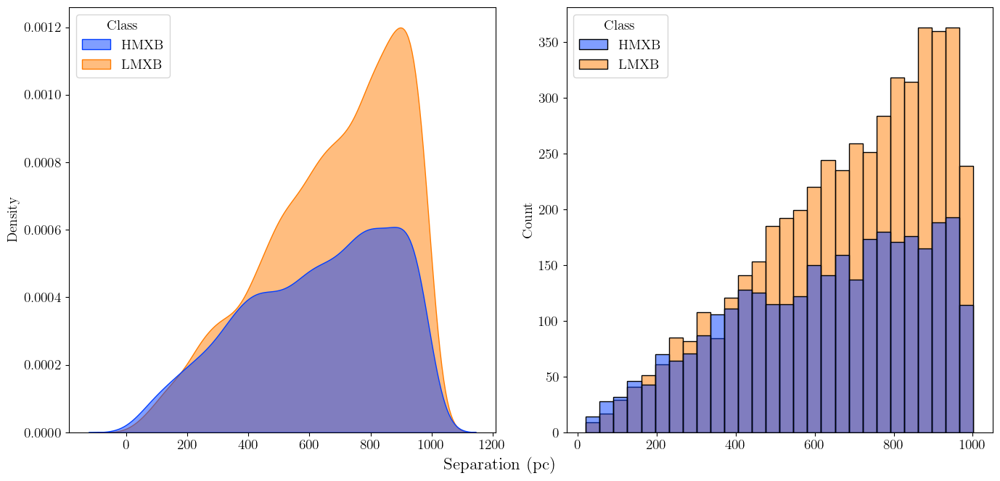

In [274]:
print(f'Maximum distance: {max(distances_ca['CA Separation (pc)'])} pc')
print(f'Minimum distance: {min(distances_ca['CA Separation (pc)'])} pc')
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))

sns.kdeplot(
    data=velocity_ca,
    x='CA Separation (pc)',
    fill=True, 
    ax=ax[0], 
    alpha=0.5,
    hue='Class',
    palette='bright'
)
ax[0].set(xlabel=None)
sns.histplot(
    data=velocity_ca,
    x='CA Separation (pc)',
    hue='Class',
    legend=True,
    # kind='hist',
    palette='bright',
    alpha=0.5,
    ax=ax[1]
)
ax[1].set(xlabel=None)

# ax[1].hist(x=velocity['Cluster Separation (pc)'].values, bins=30)
# ax[1].set_ylabel('Counts')

fig.supxlabel("Separation (pc)", x=0.5, y=0.05)
plt.tight_layout()
plt.savefig(M66_dir+'M66_XRB_ejection_compact_association_cat_separation.png')
plt.show()

##### Velocity Plots

Maximum velocity: 976.7262267516771 km/s
Minimum velocity: 0.008565152260183813 km/s


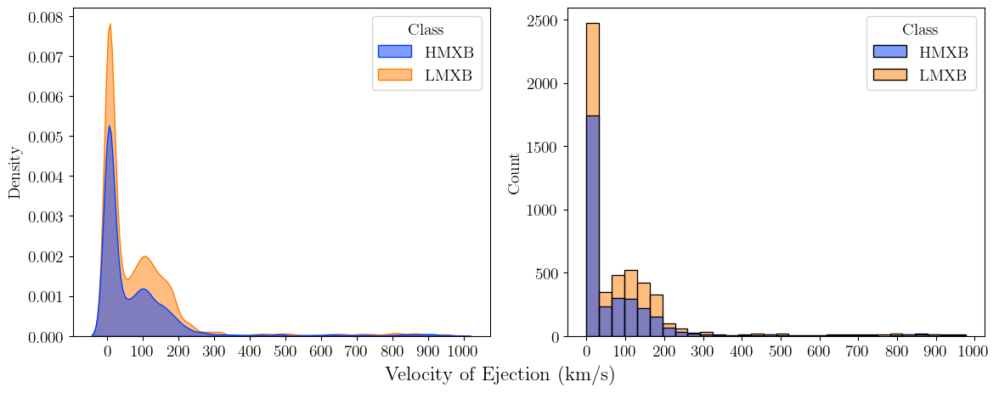

In [275]:
print(f'Maximum velocity: {max(velocity_ca['CA Velocity (km/s)'])} km/s')
print(f'Minimum velocity: {min(velocity_ca['CA Velocity (km/s)'])} km/s')
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

sns.kdeplot(
    data=velocity_ca, 
    x='CA Velocity (km/s)',
    hue='Class',
    bw_adjust=0.5,
    fill=True,
    ax=ax[0],
    alpha=0.5,
    palette='bright'
)
ax[0].set(xlabel=None)
ax[0].set_xticks([i * 100 for i in range(0, 11)])

sns.histplot(
    data=velocity_ca,
    x='CA Velocity (km/s)',
    hue='Class',
    bins=30,
    ax=ax[1], 
    alpha=0.5,
    palette='bright'
)
ax[1].set_xticks([i * 100 for i in range(0, 11)])
ax[1].set(xlabel=None)
fig.supxlabel("Velocity of Ejection (km/s)", x=0.5, y=0.07)
plt.tight_layout()
plt.savefig(M66_dir+'M66_XRB_ejection_compact_association_cat_velocity.png')
plt.show()

### Calculating Escape velocities 

The general formula of escape velocity of XRB ejection is $$v_{\text{esc}} = \sqrt{\frac{2 G M}{r}}$$
where $G$ is the gravitational constant, $M$ is the mass of the cluster and $r$ stands for the half mass radius of the cluster.

The compact association catalog by PHANGS provide the effective radii (what the radius would be if the region were a circle). We can use this to find the half mass radius and thus, the escape velocities.

Using the techniques in [Hunt et al 2023](https://iopscience.iop.org/article/10.3847/1538-4357/ace162), the three dimensional half mass radius of a cluster can be found using $$R_{h} = \frac{4}{3} R_{\text{eff}}.$$

We can solve for $R_{h}$, which is the three dimensional half mass radius of a cluster and then find the escape velocities


In [276]:
velocity_ca.columns

Index(['RA', 'Dec', 'ID', 'CA ID', 'CSC ID', 'Auxiliary ID', 'Class',
       'Best Star', '2Sig', 'X', 'Y', 'Mass', 'logAge', '2 Sig (pc)',
       '2 Sig (km)', 'Age (Myr)', 'CA RA', 'CA Dec', 'CA Separation (arcsecs)',
       'CA Separation (pc)', 'CA Separation (km)', 'CA Area (pc^2)',
       'CA Eff Radius (pc)', 'CA Age (Myr)', 'CA Age Err (Myr)',
       'CA Mass (M_sun)', 'CA Mass Err (M_sun)', 'CA Extinction',
       'CA Extinction Err', 'CA MinChiSqd', 'CA Age (s)', 'CA Age Err (s)',
       'CA Velocity (km/s)', 'CA Velocity Err (km/s)'],
      dtype='object')

In [277]:
# effective radius of a cluster in km
r_eff = velocity_ca['CA Eff Radius (pc)'].values * u.pc
r_h = (4 / 3 * r_eff).to(u.km)
velocity_ca['CA half-mass Radius (km)'] = r_h.value

# Now finding the escape velocities
from astropy.constants import G
M = velocity_ca['CA Mass (M_sun)'].values * u.Msun # Mass of the cluster
v_esc = np.sqrt(2 * G * M / r_h)
v_esc = v_esc.to(u.km/u.s)
velocity_ca['XRB escape velocity (km/s)'] = v_esc.value

Maximum velocity: 90.33574823724047 km/s
Minimum velocity: 0.30874437702086227 km/s


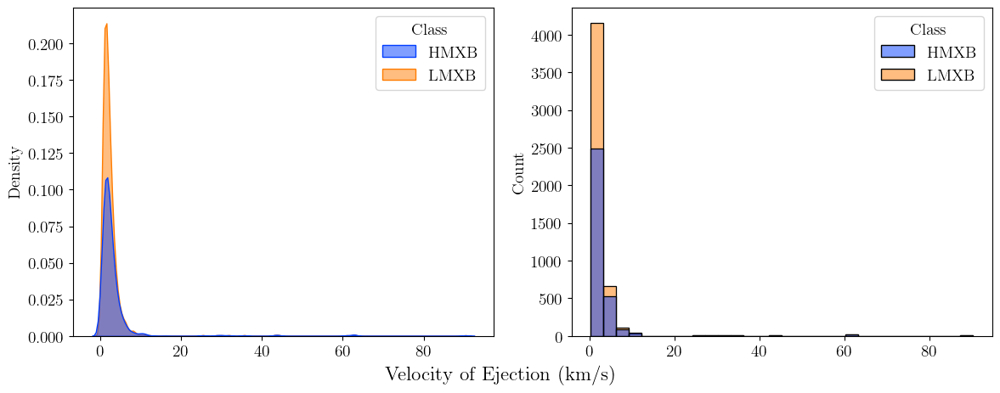

In [278]:
print(f'Maximum velocity: {max(velocity_ca['XRB escape velocity (km/s)'])} km/s')
print(f'Minimum velocity: {min(velocity_ca['XRB escape velocity (km/s)'])} km/s')
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

sns.kdeplot(
    data=velocity_ca, 
    x='XRB escape velocity (km/s)',
    hue='Class',
    bw_adjust=0.5,
    fill=True,
    ax=ax[0],
    alpha=0.5,
    palette='bright'
)
ax[0].set(xlabel=None)
# ax[0].set_xticks([i * 100 for i in range(0, 11)])

sns.histplot(
    data=velocity_ca,
    x='XRB escape velocity (km/s)',
    hue='Class',
    bins=30,
    ax=ax[1], 
    alpha=0.5,
    palette='bright'
)
# ax[1].set_xticks([i * 100 for i in range(0, 11)])
ax[1].set(xlabel=None)
fig.supxlabel("Velocity of Ejection (km/s)", x=0.5, y=0.07)
plt.tight_layout()
plt.savefig(M66_dir+'M66_XRB_ejection_compact_association_cat_escape_velocity.png')
plt.show()

### Comparing the two catalogs

##### Distance plots

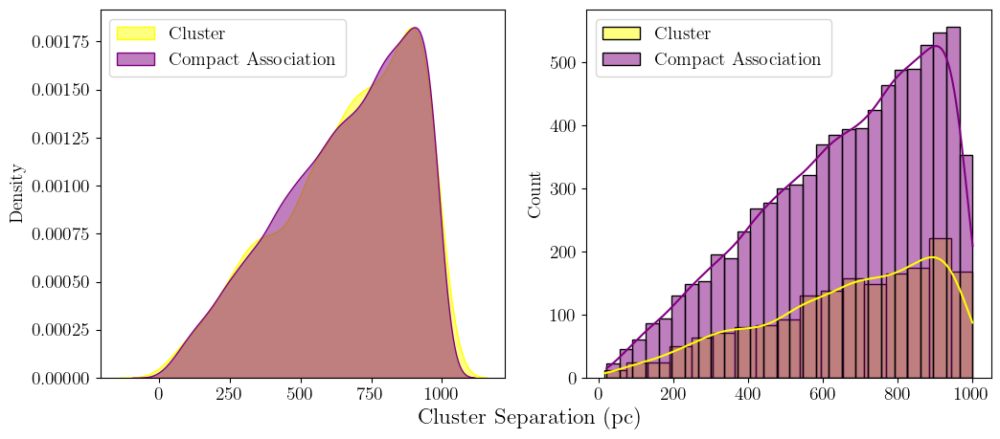

In [279]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))
sns.kdeplot(data=velocity, x='Cluster Separation (pc)', alpha=0.5, color='yellow',
            label='Cluster', fill=True, ax=ax[0])
sns.kdeplot(data=velocity_ca, x='CA Separation (pc)', alpha=0.5, color='purple',
            label='Compact Association', fill=True, ax=ax[0])
ax[0].set(xlabel=None)
ax[0].legend()
# ax[0].set_xticks([i * 100 for i in range(0, 12)])
sns.histplot(data=velocity, x='Cluster Separation (pc)', alpha=0.5, color='yellow',
            label='Cluster', fill=True, ax=ax[1], kde=True)
sns.histplot(data=velocity_ca, x='CA Separation (pc)', alpha=0.5, color='purple',
            label='Compact Association', fill=True, ax=ax[1], kde=True)
ax[1].legend()
ax[1].set(xlabel=None)
# ax[1].set_xticks([i * 100 for i in range(0, 12)])
fig.supxlabel('Cluster Separation (pc)', y=0.002)
plt.show()

##### Velocity plots

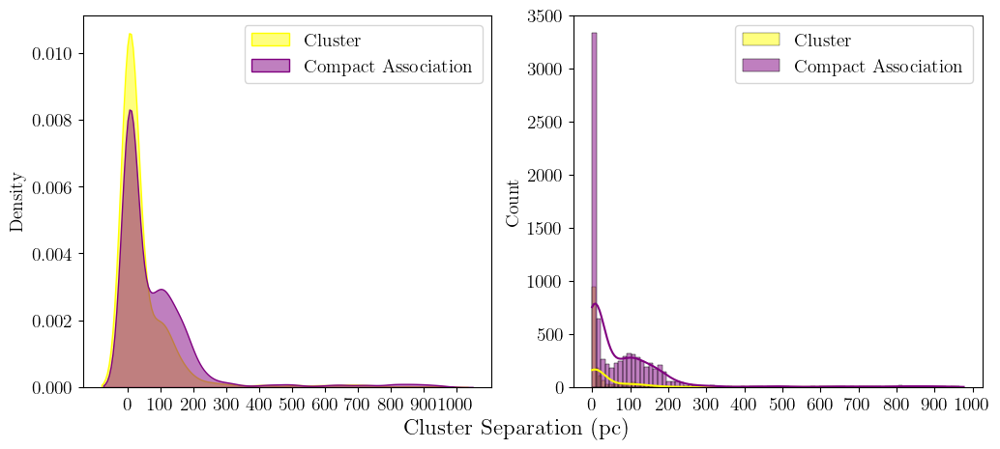

In [280]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))
sns.kdeplot(data=velocity, x='Cluster Velocity (km/s)', alpha=0.5, color='yellow',
            label='Cluster', fill=True, ax=ax[0])
sns.kdeplot(data=velocity_ca, x='CA Velocity (km/s)', alpha=0.5, color='purple',
            label='Compact Association', fill=True, ax=ax[0])
ax[0].set(xlabel=None)
ax[0].set_xticks([i * 100 for i in range(0, 11)])
ax[0].legend()
sns.histplot(data=velocity, x='Cluster Velocity (km/s)', alpha=0.5, color='yellow',
            label='Cluster', fill=True, ax=ax[1], kde=True)
sns.histplot(data=velocity_ca, x='CA Velocity (km/s)', alpha=0.5, color='purple',
            label='Compact Association', fill=True, ax=ax[1], kde=True)
ax[1].legend()
ax[1].set(xlabel=None)
ax[1].set_xticks([i * 100 for i in range(0, 11)])
fig.supxlabel('Cluster Separation (pc)', y=0.002)
plt.show()

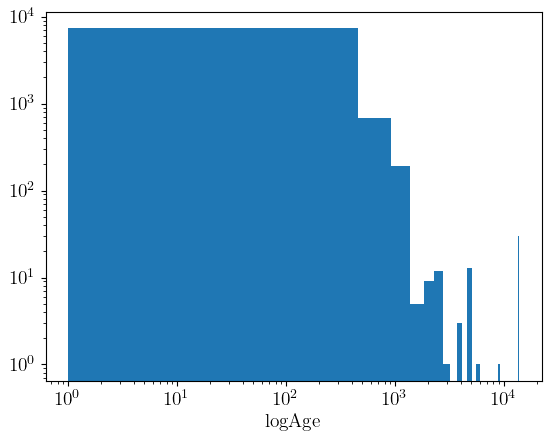

In [312]:
temp_tbl['CA Age (Myr)']
plt.hist(x=velocity_ca['CA Age (Myr)'], bins=30)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('logAge')
plt.show()

In [317]:
velocity_ca[['CA Velocity (km/s)', 'CA Velocity Err (km/s)']]

,CA Velocity (km/s),CA Velocity Err (km/s)
0,1.415102,0.354652
1,3.400963,1.342739
2,192.114737,2.090099
3,1.375907,0.104320
4,184.762350,2.090099
...,...,...
8227,0.999296,5.056092
8228,97.113904,53.983002
8229,1.293603,0.708321
8230,4.187925,1.668727


Meeting notes

Ejection scenarios
1. dynamical: flung out by gravitational interactions: V_xrb ~ V_esc: 15 km/s
2. Natal kicks: <br>
    2.1 NS XRB: in the 100s (200-400 km/s) <br>
    2.2 BH XRBs: 10s - 300kms <br>
    2.3 Plot Cluster M/R vs velocity <br>
    Plot different regions: v_esc, dynamical ejection, 2*escape velocity: 1.5-1.8 esc, BH natal kick, NS Natal Kick


v_min = d_min / t_max = projected separation of XRB-cluster / Age of star 
v_max = d_max / t_min = 1000 pc / t_min depend on ejection scenario
Natal kicks: formation time of the C.O. = 3 (HM stars) - 10 Myr (LM Stars) (Use 10 Myr)
            onset of mass transfer: few million yrs HMXB or 10's millions=billions LMXBs

v_max = 1000 pc / (age of cluster - formation of CO + onset of mass transfer)

Dynamical ejection: 
t_min (two body relaxation time): 
t_min = t_relax = Nof stars in the cluster / 8 ln(N) * (R^3 / GM)^1/2

Natal kicks time will probably be smaller.


1. Find the best parent cluster: make sure that the ages of the star within the error of the age of the cluster. If for a multi star system, a star does not have the same age, try sed fitting on all the stars and see if something fits.
2. Distances and the velocity with the best parent cluster (make sure using the age of the Cluster). Remake hists with just the parent clusters. 
3. Make M/R vs velocity diagram. Try using seaborn for the plot. 
4. Find v_max using the algorithm 
5. M81 cluster catalog available (GCs maybe). 
6. differences between LMXBs and HMXBs
7. when using JWST, use the HST pixel to arcsec scale 
8. Combine HST and JWST work 

# Algorithm for putting an upper limit on XRB ejection

$$v_{\text{max}} = \frac{d_{\text{max}}}{t_{\text{min}}}$$

For Natal kicks: 
$$v_{\text{max}} = \frac{1000 \text{pc}}{\text{Age of cluster} + \text{Formation of CO} + \text{Onset of mass transfer}}$$
where the formation time of the CO = 3 Myr (for high mass stars) or 10 Myr (for low mass stars), and onset of mass transfer = 1 million year 

For dyanmical ejection: 
$$t_{\text{min}} = t_{\text{relax}} = \frac{N}{8 \ln N} \left(\frac{R}{GM}\right)^{1/2}$$
where $N$ = number of stars in the cluster and $N = \frac{M_{\text{tot}}}{0.5}$.

**Things to keep in the back of my mind**
1. look at Compact cluster dataset. Which one to use? 

## Steps to perform in this analysis from this point forward:
1.  Merge JWST and HST work
2. Figure out the compact association catalog to use.
3. Find the most likely parent cluster or compact association for an X-ray source
4. Perform cluster analysis with them: distance plots, minimum velocity plots, escape velocity plots
5. Finding maximum velocity with the algorithm described above (plus from our meeting)
6. Making the M/R vs velocity plots with the shaded areas (look out if any differences observed between LMXBs and HMXBs)
7. XRB Lx vs Distance + XRB Lx vs Velocity (using min-max velocities as errorbars).